In [2]:
# ============================================================
# PART 1 (BATCH) — run scanpy pipeline for every TMA core, stop
# at markers
# ============================================================
# Runs once, loops over every TMA core found by DBSCAN, and for
# each one: isolates it, strips controls, runs the scanpy
# pipeline through Leiden clustering + marker ranking, and saves
# everything needed for manual annotation to disk.
#
# After this finishes, go review the marker table/dotplot for
# EACH core, then fill in CLUSTER_ANNOTATIONS_BY_CORE in part2
# (one dict of dicts, all cores at once) and run part2 once.

from pathlib import Path
import sys
import json

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import spatialdata as sd
import spatialdata_plot  # registers .pl accessor
from sklearn.cluster import DBSCAN

REPO_DIR = Path("/scratch/dkz4822/biohackathon2026/KIDS26-Team18/")
SRC_DIR = REPO_DIR / "src"
sys.path.insert(0, str(SRC_DIR))
from plot import SpatialCoord_plot, custom_barplot  # noqa: E402

RUNS_DIR = Path("/scratch/dkz4822/biohackathon2026/tma_runs")
RUNS_DIR.mkdir(parents=True, exist_ok=True)

SDATA_PATH = Path("/scratch/dkz4822/biohackathon2026/sdata_data6.zarr")
SCANPY_CFG = {
    "n_pcs": 30,
    "n_neighbors": 15,
    "leiden_resolution": 1.5,
    "seed": 42,
}
TOP_N = 10

# ------------------------------------------------------------
# Load full object and sanity-check counts (once)
# ------------------------------------------------------------
sdata = sd.read_zarr(SDATA_PATH)
adata_full = sdata["table"]

x = adata_full.X
vals = x.data if hasattr(x, "data") else np.asarray(x).ravel()
assert vals.min() >= 0, f"Expected nonnegative counts, got min={vals.min()}"
assert np.allclose(vals, np.round(vals)), "Non-integer values in .X"
rna_mask = ~adata_full.var_names.str.match(r"^(Negative|SystemControl)")
row_sums = np.asarray(adata_full[:, rna_mask].X.sum(axis=1)).ravel()
ref = adata_full.obs["nCount_RNA"].to_numpy(dtype=float)
assert np.allclose(row_sums, ref, atol=5), "X row sums (RNA genes) must match obs['nCount_RNA']"
print(f"Loaded {adata_full.n_obs:,} cells x {adata_full.n_vars:,} genes")

# ------------------------------------------------------------
# Split into TMA cores (DBSCAN on global coordinates), once
# ------------------------------------------------------------
coords = adata_full.obs[["CenterX_global_px", "CenterY_global_px"]].to_numpy()
clustering = DBSCAN(eps=2000, min_samples=50).fit(coords)
adata_full.obs["tma_core"] = clustering.labels_.astype(str)
core_ids = sorted(
    (c for c in adata_full.obs["tma_core"].unique() if c != "-1"),
    key=int,
)
print(f"Found {len(core_ids)} TMA cores: {core_ids}")
print(adata_full.obs["tma_core"].value_counts())

# ------------------------------------------------------------
# Process each core
# ------------------------------------------------------------
summary_rows = []

for CORE_ID in core_ids:
    print(f"\n{'#'*60}")
    print(f"# TMA{CORE_ID}")
    print(f"{'#'*60}")

    out_dir = RUNS_DIR / f"TMA{CORE_ID}"
    out_dir.mkdir(parents=True, exist_ok=True)

    adata_core = adata_full[adata_full.obs["tma_core"] == CORE_ID].copy()
    print(f"TMA{CORE_ID}: {adata_core.shape}")

    control_mask = (
        adata_core.var_names.str.startswith("SystemControl")
        | adata_core.var_names.str.startswith("Negative")
        | adata_core.var_names.str.endswith("-circ")
        | (adata_core.var_names == "oChIEF")
    )
    adata_core = adata_core[:, ~control_mask].copy()

    # --- scanpy pipeline ---
    adata_core_sc = adata_core.copy()
    sc.pp.normalize_total(adata_core_sc, target_sum=1e4)
    sc.pp.log1p(adata_core_sc)
    sc.pp.scale(adata_core_sc, max_value=10)

    n_comps = min(SCANPY_CFG["n_pcs"], adata_core_sc.n_obs - 1, adata_core_sc.n_vars - 1)
    sc.tl.pca(adata_core_sc, n_comps=n_comps, random_state=SCANPY_CFG["seed"])
    sc.pp.neighbors(adata_core_sc, n_neighbors=SCANPY_CFG["n_neighbors"])
    sc.tl.leiden(
        adata_core_sc,
        resolution=SCANPY_CFG["leiden_resolution"],
        key_added="leiden",
        random_state=SCANPY_CFG["seed"],
    )
    sc.tl.umap(adata_core_sc, random_state=SCANPY_CFG["seed"])

    adata_core.obs["leiden"] = adata_core_sc.obs["leiden"].astype(str)
    adata_core.obsm["X_umap"] = adata_core_sc.obsm["X_umap"]

    sc.pl.umap(adata_core, color=["leiden"], legend_loc="on data", show=False)
    plt.savefig(out_dir / f"umap_leiden_TMA{CORE_ID}.png", dpi=200, bbox_inches="tight")
    plt.close()

    # --- rank genes / marker table ---
    adata_core_rank = adata_core.copy()
    sc.pp.normalize_total(adata_core_rank, target_sum=1e4)
    sc.pp.log1p(adata_core_rank)
    sc.tl.rank_genes_groups(adata_core_rank, groupby="leiden", method="wilcoxon", use_raw=False)
    adata_core.uns["rank_genes_groups"] = adata_core_rank.uns["rank_genes_groups"]

    clusters = sorted(adata_core.obs["leiden"].unique(), key=int)
    marker_tables = []
    for cluster in clusters:
        df = sc.get.rank_genes_groups_df(adata_core, group=cluster)
        df = df.head(TOP_N).copy()
        df.insert(0, "cluster", cluster)
        marker_tables.append(df)
    markers_top = pd.concat(marker_tables, ignore_index=True)

    marker_dict = (
        markers_top.groupby("cluster", sort=False)["names"].apply(list).to_dict()
    )

    try:
        sc.tl.dendrogram(adata_core, groupby="leiden")
        sc.pl.rank_genes_groups_dotplot(
            adata_core, n_genes=TOP_N, groupby="leiden", standard_scale="var", show=False,
        )
        plt.savefig(out_dir / f"marker_dotplot_TMA{CORE_ID}.png", dpi=200, bbox_inches="tight")
        plt.close()
    except Exception as e:
        print(f"  [warn] dotplot/dendrogram failed for TMA{CORE_ID}: {e}")

    # --- save state for this core ---
    adata_core.write_h5ad(out_dir / f"adata_core_TMA{CORE_ID}_preannot.h5ad")
    markers_top.to_csv(out_dir / f"markers_top{TOP_N}_TMA{CORE_ID}.csv", index=False)
    with open(out_dir / f"marker_dict_TMA{CORE_ID}.json", "w") as f:
        json.dump(marker_dict, f, indent=2)

    print(f"TMA{CORE_ID}: {len(clusters)} clusters -> saved to {out_dir}")
    for cl in clusters:
        print(f"  cluster {cl}: {marker_dict[cl]}")

    summary_rows.append({
        "core_id": CORE_ID,
        "n_cells": adata_core.n_obs,
        "n_clusters": len(clusters),
        "clusters": clusters,
    })

# ------------------------------------------------------------
# Overview across all cores
# ------------------------------------------------------------
summary_df = pd.DataFrame(summary_rows)
summary_df.to_csv(RUNS_DIR / "all_cores_summary.csv", index=False)

print(f"\n{'='*60}")
print("ALL CORES PROCESSED — STOPPED FOR MANUAL ANNOTATION")
print(f"{'='*60}")
print(summary_df.to_string(index=False))
print(f"\nPer-core outputs in: {RUNS_DIR}/TMA<core_id>/")
print("Next: review each core's marker_dotplot_TMA<id>.png and marker_dict_TMA<id>.json,")
print("then fill in CLUSTER_ANNOTATIONS_BY_CORE in part2 (all cores at once) and run part2 once.")

Loaded 71,138 cells x 6,537 genes
Found 20 TMA cores: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19']
tma_core
16    6821
17    6148
2     5228
13    4881
7     4373
4     4315
11    3952
9     3915
1     3358
19    3334
0     2981
14    2766
15    2761
10    2728
6     2692
18    2613
12    2525
3     2086
8     1926
5     1735
Name: count, dtype: int64

############################################################
# TMA0
############################################################
TMA0: (2981, 6537)


/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA0: 15 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA0
  cluster 0: ['NDUFA3', 'SNRPD1', 'S100A8', 'NEAT1', 'KRT5', 'KRT6A', 'VPS29', 'PERP', 'PTK2', 'S100A9']
  cluster 1: ['COL1A2', 'COL1A1', 'DCN', 'COL3A1', 'COL6A3', 'CXCL12', 'COL6A2', 'MMP2', 'COL6A1', 'TWIST2']
  cluster 2: ['CD14', 'CD74', 'PLTP', 'C1QC', 'HLA-DRB', 'C1QA', 'HLA-DRA', 'FCGRT', 'C1QB', 'STAB1']
  cluster 3: ['CD74', 'HLA-DRB', 'HLA-DRA', 'HLA-DPA1', 'PLTP', 'C1QA', 'CD14', 'HLA-DQB1', 'FCGRT', 'C1QC']
  cluster 4: ['ACTA2', 'TAGLN', 'MYL9', 'TPM2', 'IGFBP7', 'ADIRF', 'COL4A2', 'COL4A1', 'TPM1', 'LMNA']
  cluster 5: ['COL4A3', 'SORCS2', 'CCNB3', 'RAPGEF5', 'RORB', 'EPHA3', 'mCherry', 'AMOT', 'DCC', 'GLRA2']
  cluster 6: ['CD74', 'HLA-DRB', 'HLA-DRA', 'TMSB4X', 'HLA-DPA1', 'TMSB10', 'MHC I', 'CYBA', 'HLA-DQB1', 'PLTP']
  cluster 7: ['DCN', 'COL1A1', 'CXCL14', 'COL3A1', 'COL1A2', 'CXCL12', 'COL6A2', 'COL6A1', 'SFRP2', 'COL6A3']
  cluster 8: ['S100A8', 'SNRPD1', 'KRT5', 'NDUFA3', 'PTK2', 'PERP

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA1: 15 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA1
  cluster 0: ['DCN', 'FBLN1', 'CFD', 'TWIST2', 'APOD', 'CXCL14', 'GSN', 'CXCL12', 'COL1A1', 'COMP']
  cluster 1: ['DCN', 'APOD', 'FBLN1', 'CXCL12', 'CFD', 'APOE', 'CXCL14', 'COMP', 'GSN', 'THBS2']
  cluster 2: ['COX1', 'COX2', 'POLA1', 'DSCAML1', 'DCC', 'RORB', 'NRXN2', 'RAPGEF5', 'CENPE', 'SORCS2']
  cluster 3: ['KRT5', 'SNRPD1', 'NDUFA3', 'OXR1', 'KRT14', 'NEAT1', 'KRT1', 'PERP', 'VPS29', 'KRT10']
  cluster 4: ['CD74', 'HLA-DRB', 'MHC I', 'HLA-DRA', 'AQP1', 'RASA4', 'HLA-E', 'HLA-DPA1', 'ADIRF', 'ACKR1']
  cluster 5: ['NDUFA3', 'VPS29', 'SIGMAR1', 'SNRPD1', 'PTEN', 'MED15', 'PTK2', 'TFF3', 'CCL21', 'MBIP']
  cluster 6: ['TAGLN', 'ACTA2', 'MYL9', 'TPM2', 'COX1', 'ADIRF', 'COX2', 'VIM', 'TIMP3', 'TMSB4X']
  cluster 7: ['COX1', 'COX2', 'TAGLN', 'DUSP2', 'MYL9', 'TMSB4X', 'S100A6', 'ACTA2', 'CRIP1', 'ADIRF']
  cluster 8: ['RNASE1', 'C1QA', 'PLTP', 'FCGRT', 'CST3', 'C1QC', 'CTSB', 'CD68', 'C1QB', 'CD74']
  clust

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA2: 11 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA2
  cluster 0: ['NDUFA3', 'SNRPD1', 'SIGMAR1', 'PTEN', 'VPS29', 'MED15', 'A1BG', 'KRT18', 'PTK2', 'SNRPA1']
  cluster 1: ['NDUFA3', 'SNRPD1', 'SIGMAR1', 'PTEN', 'VPS29', 'KRT18', 'PTK2', 'MED15', 'OXR1', 'COX20']
  cluster 2: ['COX2', 'COX1', 'A1BG', 'SIGMAR1', 'PTEN', 'SNRPD1', 'VPS29', 'MED15', 'SORCS2', 'USP9Y']
  cluster 3: ['NDUFA3', 'SNRPD1', 'PTEN', 'VPS29', 'SIGMAR1', 'KRT18', 'OXR1', 'A1BG', 'MED15', 'PTK2']
  cluster 4: ['COX2', 'COX1', 'SORCS2', 'SNAP25', 'POLA1', 'RAPGEF5', 'CCNB3', 'AFF2', 'HDAC6', 'MAP4']
  cluster 5: ['OXR1', 'NEAT1', 'YBX1', 'IL32', 'MMP2', 'RBM8A', 'MAF', 'POU5F1', 'SMPD2', 'TIMP2']
  cluster 6: ['CD74', 'HLA-DRB', 'HLA-DRA', 'B2M', 'MHC I', 'HLA-DPA1', 'CTSB', 'HLA-DQB1', 'LYZ', 'PLTP']
  cluster 7: ['COL4A1', 'IGFBP7', 'COL4A2', 'SPARC', 'TAGLN', 'MYH9', 'VIM', 'LMNA', 'MYL6', 'RHOB']
  cluster 8: ['CTSB', 'MHC I', 'COL1A1', 'CD74', 'B2M', 'HLA-DRA', 'COL3A1', 'MT2A', 'COL1A2

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA3: 14 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA3
  cluster 0: ['NDUFA3', 'OXR1', 'SNRPD1', 'NEAT1', 'KRT5', 'KRT1', 'KRT10', 'VPS29', 'PTK2', 'APIP']
  cluster 1: ['SNRPD1', 'VPS29', 'NDUFA3', 'OXR1', 'NEAT1', 'KRT1', 'PTK2', 'SIGMAR1', 'PTEN', 'KRT10']
  cluster 2: ['DCN', 'COL1A1', 'CXCL12', 'S100A6', 'COL3A1', 'VIM', 'COL1A2', 'MGP', 'GSN', 'TMSB4X']
  cluster 3: ['COX1', 'COX2', 'MHC I', 'SIGMAR1', 'SNRPD1', 'DUSP2', 'LMNA', 'MED15', 'SEC22B', 'PTK2']
  cluster 4: ['COX1', 'COX2', 'DCN', 'MHC I', 'S100A6', 'COL1A2', 'CXCL12', 'DUSP2', 'COL1A1', 'COL3A1']
  cluster 5: ['mCherry', 'SORCS2', 'RAPGEF5', 'MAGEB2', 'MAGEC1', 'CD40LG', 'POLA1', 'PCSK1N', 'ATG4D', 'SNAP25']
  cluster 6: ['HLA-DRB', 'CD74', 'HLA-DRA', 'RNASE1', 'TMSB4X', 'RASA4', 'HLA-E', 'CST3', 'MHC I', 'B2M']
  cluster 7: ['SNRPD1', 'NDUFA3', 'KRT1', 'PTK2', 'VPS29', 'PTEN', 'SIGMAR1', 'COX1', 'KRT18', 'KRT10']
  cluster 8: ['TAGLN', 'MYL9', 'TPM2', 'ACTA2', 'DES', 'TPM1', 'MYH11', 'FLNA', 'M

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA4: 15 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA4
  cluster 0: ['SORCS2', 'tdtomato', 'mCherry', 'RAPGEF5', 'AFF2', 'POLA1', 'PCSK1N', 'Luciferase', 'CCNB3', 'MAP4']
  cluster 1: ['KRT5', 'KRT14', 'KRT17', 'SFN', 'S100A2', 'S100A9', 'PERP', 'S100A8', 'DSC3', 'KRT6A']
  cluster 2: ['S100A9', 'S100A8', 'KRT6A', 'SFN', 'KRT14', 'KRT16', 'KRT5', 'S100A2', 'KRT17', 'S100A7']
  cluster 3: ['CD74', 'HLA-DRB', 'HLA-DRA', 'COX1', 'COX2', 'TMSB4X', 'LYZ', 'HLA-DPA1', 'MHC I', 'TMSB10']
  cluster 4: ['IL32', 'CORO1A', 'SNRPD1', 'NDUFA3', 'TMSB4X', 'PTEN', 'LTB', 'COTL1', 'S100A4', 'CRIP1']
  cluster 5: ['tdtomato', 'mCherry', 'VAMP7', 'PPP1R1B', 'Luciferase', 'SORCS2', 'BEX1', 'FOXO4', 'MAPK10', 'MYL7']
  cluster 6: ['HLA-DRB', 'CD74', 'HLA-DRA', 'LYZ', 'HLA-DPA1', 'HLA-DQB1', 'HLA-DPB1', 'IFI30', 'TYROBP', 'CST3']
  cluster 7: ['KRT16', 'KRT6A', 'S100A7', 'KRT10', 'S100A8', 'KRT1', 'LY6D', 'PERP', 'S100A9', 'AQP3']
  cluster 8: ['COL1A1', 'COL6A2', 'COL1A2', 'DCN', 'C

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA5: 13 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA5
  cluster 0: ['NDUFA3', 'SNRPD1', 'VPS29', 'MED15', 'PTEN', 'SIGMAR1', 'COX1', 'COX2', 'PTK2', 'MHC I']
  cluster 1: ['SEMG1', 'BMP15', 'DDIT3', 'DCC', 'POLA1', 'HLA-DQA1', 'SORCS2', 'ADGRF1', 'CD40LG', 'MME']
  cluster 2: ['VAMP7', 'CDK11A', 'CPAMD8', 'TBK1', 'MAPK10', 'PCP2', 'PGM2', 'MYL7', 'CRH', 'BCHE']
  cluster 3: ['TAB3', 'RFC2', 'ITGAE', 'CSF2', 'NDRG1', 'ADH1C', 'INO80', 'POLK', 'IFNA6', 'PRKAG1']
  cluster 4: ['TBK1', 'IFNA6', 'CPB2', 'SLC6A3', 'COP1', 'PPP1R1B', 'NUP210', 'SLC25A6', 'USP9Y', 'HTT']
  cluster 5: ['PSMD12', 'RAP2B', 'NUP214', 'LUZP2', 'SLC27A1', 'ANKRD30B', 'GLA', 'RIMS2', 'RAP1GDS1', 'IKBKB']
  cluster 6: ['PAK3', 'TLR1', 'BEX1', 'P4HA2', 'ATG2A', 'COL4A3', 'MS4A2', 'UBR2', 'STK4', 'NTF3']
  cluster 7: ['COX1', 'COX2', 'DCN', 'S100A6', 'CXCL14', 'TMSB4X', 'COL6A2', 'LMNA', 'COL1A2', 'S100A4']
  cluster 8: ['CHGA', 'ITGAE', 'CAB39L', 'CHD9', 'CLEC14A', 'INS', 'SCAMP1', 'PDHA1', 'DAB

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA6: 9 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA6
  cluster 0: ['SNRPD1', 'KRT5', 'NDUFA3', 'VPS29', 'PERP', 'PTK2', 'KRT6A', 'NEAT1', 'MED15', 'OXR1']
  cluster 1: ['NDUFA3', 'MED15', 'PTEN', 'SIGMAR1', 'VPS29', 'COL1A1', 'SNRPD1', 'COL3A1', 'PTK2', 'DCN']
  cluster 2: ['COX1', 'COX2', 'SNRPD1', 'NDUFA3', 'VPS29', 'MED15', 'SIGMAR1', 'DUSP2', 'PTK2', 'PTEN']
  cluster 3: ['USP9Y', 'EIF1AY', 'NLGN4Y', 'SORCS2', 'SNAP25', 'DCC', 'TMSB4Y', 'POLA1', 'RAPGEF5', 'MAP4']
  cluster 4: ['PGM2', 'tdtomato', 'ADRA1D', 'mCherry', 'EIF1AY', 'PPP1R1B', 'NLGN4Y', 'MYL7', 'TMSB4Y', 'SORCS2']
  cluster 5: ['VIM', 'TMSB4X', 'MHC I', 'MED15', 'HMGN1', 'PTEN', 'SIGMAR1', 'S100A6', 'CD74', 'PTK2']
  cluster 6: ['COX1', 'COX2', 'DCN', 'COL1A2', 'DUSP2', 'FBLN1', 'S100A6', 'COL1A1', 'VIM', 'CFD']
  cluster 7: ['CPAMD8', 'IFNA6', 'CDK11A', 'FCGR2B', 'PPP1R1B', 'PGM2', 'MYL7', 'VAMP7', 'PIAS1', 'BCHE']
  cluster 8: ['CD74', 'MHC I', 'B2M', 'COX1', 'COX2', 'TMSB4X', 'HLA-DRB', 'VIM',

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA7: 11 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA7
  cluster 0: ['USP9Y', 'EIF1AY', 'TMSB4Y', 'NLGN4Y', 'mCherry', 'SORCS2', 'tdtomato', 'Luciferase', 'PPP1R1B', 'DCC']
  cluster 1: ['S100A9', 'S100A8', 'KRT6A', 'PERP', 'KRT1', 'KRT16', 'HSPB1', 'KRT10', 'SFN', 'KRT5']
  cluster 2: ['KRT5', 'KRT14', 'S100A2', 'KRT17', 'OXR1', 'COL17A1', 'H2BC5', 'ATP1B3', 'KRT6A', 'COL7A1']
  cluster 3: ['KRT10', 'KRT1', 'CALML3', 'S100A8', 'PERP', 'NEAT1', 'S100A9', 'KRT6A', 'S100A7', 'KRT4']
  cluster 4: ['COL1A1', 'COL3A1', 'COL1A2', 'DCN', 'CD74', 'TMSB4X', 'S100A4', 'COL6A2', 'COX1', 'S100A6']
  cluster 5: ['CD74', 'HLA-DRB', 'HLA-DRA', 'TMSB4X', 'HLA-DPA1', 'LYZ', 'HLA-DQB1', 'TMSB10', 'HLA-DPB1', 'S100A4']
  cluster 6: ['COL1A1', 'COL3A1', 'COL1A2', 'COL6A1', 'DCN', 'COL6A2', 'MMP2', 'SFRP2', 'C1R', 'COL6A3']
  cluster 7: ['VIM', 'IGFBP7', 'COX2', 'COX1', 'TMSB4X', 'CRIP1', 'B2M', 'CD74', 'TAGLN', 'COL4A2']
  cluster 8: ['COL1A1', 'DCN', 'COL3A1', 'CXCL14', 'COL1A2', '

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA8: 12 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA8
  cluster 0: ['SNRPD1', 'MED15', 'SIGMAR1', 'NDUFA3', 'PTEN', 'VPS29', 'COX1', 'COX2', 'DUSP2', 'KRT18']
  cluster 1: ['KRT10', 'NEAT1', 'KRT1', 'PERP', 'SNRPD1', 'NDUFA3', 'VPS29', 'PTK2', 'FGFR3', 'MED15']
  cluster 2: ['PPP1R1B', 'SOX9', 'FCGR2B', 'ATG4D', 'MS4A2', 'VAMP7', 'HLA-DQA1', 'tdtomato', 'PRTN3', 'SORCS2']
  cluster 3: ['HLA-DQA1', 'SORCS2', 'CCNB3', 'AFF2', 'SNAP25', 'RAPGEF5', 'POLA1', 'mCherry', 'MAP4', 'HDAC6']
  cluster 4: ['NEAT1', 'PERP', 'NDUFA3', 'PTK2', 'KRT1', 'MED15', 'PTEN', 'VPS29', 'KRT10', 'SNRPD1']
  cluster 5: ['DCN', 'COL1A1', 'COL3A1', 'COL6A1', 'COL1A2', 'CFD', 'COL6A2', 'RHOB', 'FBLN1', 'FSTL1']
  cluster 6: ['CD74', 'TMSB4X', 'VIM', 'HLA-DRB', 'MHC I', 'TMSB10', 'COX2', 'COX1', 'S100A6', 'TXNIP']
  cluster 7: ['CD74', 'HLA-DRB', 'TMSB10', 'TMSB4X', 'VIM', 'CST3', 'MHC I', 'PTK2', 'GLUL', 'S100A6']
  cluster 8: ['COL1A1', 'DCN', 'COL1A2', 'COL3A1', 'FBLN1', 'SPARC', 'COL6A2'

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA9: 12 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA9
  cluster 0: ['COX1', 'COX2', 'COL1A1', 'VIM', 'TMSB4X', 'COL3A1', 'IGFBP7', 'CD74', 'COL1A2', 'S100A6']
  cluster 1: ['KRT14', 'KRT5', 'S100A2', 'KRT17', 'COL17A1', 'KRT15', 'KRT6A', 'CXCL14', 'HSPB1', 'SFN']
  cluster 2: ['KRT1', 'KRT10', 'KRT4', 'NEAT1', 'S100A8', 'S100A9', 'PERP', 'CALML3', 'CALML5', 'LY6D']
  cluster 3: ['CD74', 'HLA-DRB', 'HLA-DRA', 'TMSB4X', 'HLA-DPA1', 'LYZ', 'S100A4', 'SIGMAR1', 'PTEN', 'CST3']
  cluster 4: ['S100A9', 'IFI6', 'PERP', 'SFN', 'HSPB1', 'S100A8', 'KRT6A', 'KRT10', 'IFI27', 'KRT1']
  cluster 5: ['CD74', 'HLA-DRB', 'TMSB4X', 'HLA-DRA', 'COL3A1', 'COL6A2', 'S100A4', 'VIM', 'LYZ', 'COL1A1']
  cluster 6: ['HLA-DQA1', 'SORCS2', 'mCherry', 'tdtomato', 'Luciferase', 'POLA1', 'KCNQ3', 'RAPGEF5', 'SNAP25', 'HDAC6']
  cluster 7: ['mCherry', 'SORCS2', 'IL21', 'PPP1R1B', 'tdtomato', 'ITGAE', 'POLA1', 'CENPE', 'Luciferase', 'CCNB3']
  cluster 8: ['COL1A1', 'COL6A2', 'COL1A2', 'COL6A1'

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA10: 11 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA10
  cluster 0: ['SORCS2', 'HLA-DQA1', 'POLA1', 'RAPGEF5', 'mCherry', 'SNAP25', 'KCNQ3', 'SOX17', 'ELF4', 'CCNB3']
  cluster 1: ['NDUFA3', 'OXR1', 'SNRPD1', 'VPS29', 'MED15', 'PTK2', 'PTEN', 'NEAT1', 'SIGMAR1', 'KRT18']
  cluster 2: ['COX1', 'COX2', 'SNRPD1', 'PTEN', 'NDUFA3', 'MHC I', 'MED15', 'DUSP2', 'VPS29', 'PTK2']
  cluster 3: ['TMSB4Y', 'HLA-DQA1', 'mCherry', 'PPP1R1B', 'CCNB3', 'SORCS2', 'SOX17', 'ELF4', 'NLGN4X', 'POLA1']
  cluster 4: ['PTEN', 'COX2', 'MHC I', 'NDUFA3', 'COX1', 'B2M', 'MED15', 'VPS29', 'SIGMAR1', 'HLA-DRB']
  cluster 5: ['COX1', 'YFP', 'IFNA6', 'MS4A2', 'COX2', 'PPP1R1B', 'TBK1', 'CDK11A', 'DCN', 'MYL7']
  cluster 6: ['NEAT1', 'VPS29', 'PERP', 'SIGMAR1', 'SNRPD1', 'OXR1', 'KRT1', 'MED15', 'KRT10', 'NDUFA3']
  cluster 7: ['COL1A1', 'COL1A2', 'COL3A1', 'MED15', 'PTEN', 'VPS29', 'DCN', 'NDUFA3', 'COL6A1', 'SNRPD1']
  cluster 8: ['CD74', 'HLA-DRB', 'TMSB4X', 'HLA-DRA', 'B2M', 'SIGMAR1', '

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA11: 14 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA11
  cluster 0: ['S100A8', 'S100A9', 'KRT1', 'KRT10', 'S100A7', 'KRT6A', 'PERP', 'SFN', 'CALML5', 'KRT16']
  cluster 1: ['KRT15', 'KRT14', 'CXCL14', 'COL17A1', 'KRT5', 'S100A2', 'COL7A1', 'MT2A', 'ATP1B3', 'LTF']
  cluster 2: ['KRT10', 'KRT1', 'DSC3', 'NDUFA3', 'KRT4', 'ALDH2', 'AQP3', 'CRABP2', 'LY6D', 'PERP']
  cluster 3: ['KRT14', 'KRT5', 'KRT6A', 'LY6D', 'PERP', 'DSC3', 'SFN', 'AQP3', 'KRT16', 'S100A8']
  cluster 4: ['CALML5', 'PI3', 'NEAT1', 'S100A7', 'OXR1', 'SPRR2A', 'S100A8', 'SMPD2', 'SPINK5', 'KRT1']
  cluster 5: ['KRT5', 'S100A2', 'SFN', 'KRT14', 'DSC3', 'SLC2A1', 'S100A9', 'HSPB1', 'S100A14', 'CD44']
  cluster 6: ['COX2', 'COX1', 'COL1A1', 'COL3A1', 'COL1A2', 'CD74', 'MHC I', 'TMSB4X', 'COL6A1', 'VIM']
  cluster 7: ['CD74', 'HLA-DRB', 'HLA-DRA', 'HLA-DPA1', 'TMSB4X', 'LYZ', 'TMSB10', 'VIM', 'HLA-DPB1', 'HLA-DQB1']
  cluster 8: ['KRT10', 'KRT1', 'DSC3', 'PERP', 'FABP5', 'LY6D', 'DSP', 'AQP3', 'SFN',

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA12: 11 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA12
  cluster 0: ['NDUFA3', 'SNRPD1', 'NEAT1', 'PTK2', 'VPS29', 'OXR1', 'MED15', 'KRT1', 'KRT10', 'SIGMAR1']
  cluster 1: ['HLA-DQA1', 'mCherry', 'RAPGEF5', 'tdtomato', 'AFF2', 'SORCS2', 'POLA1', 'HDAC6', 'ST18', 'DACH2']
  cluster 2: ['PPP1R1B', 'VAMP7', 'Luciferase', 'TBK1', 'HLA-DQA1', 'mCherry', 'NPY2R', 'CACNA1F', 'ADRA1D', 'HDAC6']
  cluster 3: ['SNRPD1', 'COX2', 'NDUFA3', 'COX1', 'SIGMAR1', 'VPS29', 'PTEN', 'MED15', 'KRT10', 'PTK2']
  cluster 4: ['CD74', 'HLA-DRB', 'COX1', 'TMSB4X', 'COX2', 'MHC I', 'HLA-DRA', 'DUSP2', 'B2M', 'PTEN']
  cluster 5: ['COL1A2', 'COL1A1', 'COL3A1', 'DCN', 'COL6A2', 'COL6A1', 'MMP2', 'S100A6', 'SFRP2', 'CXCL14']
  cluster 6: ['VPS29', 'NEAT1', 'SNRPD1', 'KRT10', 'NDUFA3', 'KRT1', 'SIGMAR1', 'PTK2', 'PTEN', 'MED15']
  cluster 7: ['COL1A1', 'COL1A2', 'COL3A1', 'DCN', 'COL6A2', 'COL6A1', 'CXCL14', 'MMP2', 'S100A6', 'SFRP2']
  cluster 8: ['SNRPD1', 'COX2', 'COX1', 'VPS29', 'MED15'

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA13: 13 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA13
  cluster 0: ['SORCS2', 'LILRA3', 'HLA-DQA1', 'AFF2', 'RORB', 'tdtomato', 'mCherry', 'SYT10', 'POLA1', 'IL21']
  cluster 1: ['KRT10', 'KRT1', 'S100A8', 'NEAT1', 'S100A9', 'PERP', 'AQP3', 'LY6D', 'DSC3', 'SFN']
  cluster 2: ['COX1', 'COX2', 'CD74', 'COL1A1', 'TMSB4X', 'COL3A1', 'HLA-DRB', 'HLA-DRA', 'S100A6', 'VIM']
  cluster 3: ['COL1A1', 'COL3A1', 'COL1A2', 'COL6A1', 'COL6A2', 'NDUFA3', 'PTEN', 'MED15', 'SNRPD1', 'DCN']
  cluster 4: ['TMSB4X', 'CD74', 'HLA-DRB', 'HLA-DRA', 'S100A4', 'TMSB10', 'HLA-DPA1', 'IL32', 'LYZ', 'COTL1']
  cluster 5: ['S100A9', 'S100A8', 'KRT1', 'KRT10', 'KRT6A', 'PERP', 'AQP3', 'SFN', 'KRT16', 'DSC3']
  cluster 6: ['KRT5', 'KRT14', 'S100A9', 'KRT6A', 'DSC3', 'S100A8', 'PERP', 'KRT1', 'SFN', 'AQP3']
  cluster 7: ['KRT5', 'KRT14', 'S100A2', 'KRT17', 'COL17A1', 'CXCL14', 'KRT6A', 'OXR1', 'ATP1B3', 'NDUFA3']
  cluster 8: ['COL1A2', 'COL3A1', 'COL1A1', 'COL6A2', 'COL6A1', 'SFRP2', 'CXCL

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA14: 8 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA14
  cluster 0: ['NDUFA3', 'SNRPD1', 'VPS29', 'PTEN', 'MED15', 'PTK2', 'SIGMAR1', 'COX1', 'COX2', 'KRT18']
  cluster 1: ['SORCS2', 'RAPGEF5', 'mCherry', 'MAP4', 'DCC', 'AFF2', 'RORB', 'IFNW1', 'HLA-DQA1', 'CENPE']
  cluster 2: ['NDUFA3', 'SNRPD1', 'PTK2', 'PTEN', 'MED15', 'VPS29', 'SIGMAR1', 'KRT18', 'NEAT1', 'MHC I']
  cluster 3: ['SORCS2', 'AFF2', 'RAPGEF5', 'SOX17', 'IFNW1', 'AGTR2', 'AZU1', 'IL21', 'MAGEB2', 'CCNB3']
  cluster 4: ['HLA-G', 'PPP1R1B', 'MAPK10', 'FCGR2B', 'PIAS1', 'BCHE', 'CDK11A', 'PGM2', 'OLFM3', 'NDRG1']
  cluster 5: ['COX1', 'COX2', 'SNRPD1', 'VPS29', 'NDUFA3', 'MHC I', 'MED15', 'DUSP2', 'SIGMAR1', 'PTEN']
  cluster 6: ['C6', 'MAGEA12', 'tdtomato', 'LILRA3', 'POLA1', 'SORCS2', 'DLG3', 'GPR37L1', 'mCherry', 'KRT6C']
  cluster 7: ['COL1A1', 'COL3A1', 'DCN', 'COL1A2', 'CFD', 'CXCL12', 'SPARC', 'COL6A2', 'SFRP2', 'GSN']

############################################################
# TMA15
###

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA15: 14 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA15
  cluster 0: ['KRT6A', 'PERP', 'KRT16', 'KRT17', 'OXR1', 'PI3', 'AQP3', 'LY6D', 'NEAT1', 'SLPI']
  cluster 1: ['SORCS2', 'RORB', 'RAPGEF5', 'CCNB3', 'POLA1', 'DCC', 'mCherry', 'IFNW1', 'SOX17', 'AFF2']
  cluster 2: ['KRT5', 'CXCL14', 'S100A2', 'KRT14', 'COL17A1', 'MT2A', 'PKM', 'ENO1', 'SFN', 'SLC2A1']
  cluster 3: ['NDUFA3', 'SNRPD1', 'PTEN', 'VPS29', 'MED15', 'SIGMAR1', 'KRT18', 'TMSB4X', 'COX20', 'DISC1']
  cluster 4: ['NDUFA3', 'SNRPD1', 'PTEN', 'VPS29', 'MED15', 'mCherry', 'SOX17', 'SORCS2', 'DCC', 'TRIM34']
  cluster 5: ['SNRPD1', 'PTEN', 'VPS29', 'MED15', 'SIGMAR1', 'NDUFA3', 'KRT18', 'TMSB4X', 'PTK2', 'PLEK']
  cluster 6: ['NEAT1', 'SPRR2A', 'KRT80', 'LCN2', 'GM2A', 'CALML5', 'P4HB', 'PI3', 'S100A7', 'ATP1B1']
  cluster 7: ['SPRR2A', 'GM2A', 'DUSP2', 'GLUL', 'LCN2', 'PHKG2', 'NEAT1', 'S100A7', 'A1BG', 'KRT80']
  cluster 8: ['COL1A1', 'B2M', 'COL1A2', 'COL3A1', 'MHC I', 'COL6A1', 'COL4A1', 'VIM', 'SP

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA16: 17 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA16
  cluster 0: ['NEAT1', 'ERRFI1', 'AASS', 'APOC3', 'CYP2E1', 'AZGP1', 'APOC1', 'ACSL1', 'RBP4', 'MT2A']
  cluster 1: ['APOC1', 'HP', 'APOC3', 'SERPINA1', 'FGA', 'APOA2', 'APOA1', 'ALDOB', 'FGG', 'TTR']
  cluster 2: ['A1BG', 'NDUFA3', 'SNRPD1', 'PHKG2', 'MHC I', 'H2AX', 'PCGF6', 'DUSP2', 'PTK2', 'PTEN']
  cluster 3: ['HP', 'SERPINA1', 'APOA1', 'APOC3', 'APOC1', 'ALDOB', 'DUSP2', 'APOA2', 'FGA', 'APOE']
  cluster 4: ['ERRFI1', 'AZGP1', 'ALDH1L1', 'ACSL1', 'AASS', 'ASL', 'MT2A', 'PCK1', 'HPX', 'NEAT1']
  cluster 5: ['USP9Y', 'SORCS2', 'CENPE', 'USP5', 'AZU1', 'IL21', 'MNDA', 'COL4A3', 'MELK', 'BCL10']
  cluster 6: ['ANXA4', 'RHOB', 'SPP1', 'KRT7', 'NDUFA3', 'SNRPD1', 'FGFR2', 'LYZ', 'AQP1', 'PHKG2']
  cluster 7: ['CD74', 'HLA-DRB', 'HLA-DRA', 'CD163', 'CTSB', 'TMSB4X', 'GPX1', 'C1QC', 'MHC I', 'HLA-DPA1']
  cluster 8: ['NEAT1', 'VPS29', 'AASS', 'ERRFI1', 'APOC3', 'HP', 'MT1X', 'CYP2E1', 'RBP4', 'APOA1']
  clust

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA17: 20 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA17
  cluster 0: ['AQP3', 'KRT19', 'GATA3', 'CA2', 'L1CAM', 'HMGCS2', 'TSPAN1', 'CTSH', 'ST6GAL1', 'KCTD12']
  cluster 1: ['ATP1A1', 'PEBP1', 'KNG1', 'GOLM1', 'SDC1', 'ATP1B1', 'PLAU', 'SPP1', 'LDHB', 'IDH2']
  cluster 2: ['ATP1A1', 'KNG1', 'PLAU', 'GOLM1', 'ATP1B1', 'SPP1', 'SDC1', 'PEBP1', 'TMEM37', 'ACSL1']
  cluster 3: ['CRYAB', 'PAX8', 'PFKFB3', 'AKT2', 'CLU', 'TACSTD2', 'LMNA', 'TPM1', 'ODC1', 'IGFBP3']
  cluster 4: ['THBS1', 'DCN', 'MGP', 'C7', 'TNC', 'LUM', 'BGN', 'COL1A1', 'IGFBP5', 'COL1A2']
  cluster 5: ['ATP1A1', 'PEBP1', 'ATP1B1', 'SPP1', 'LDHB', 'APP', 'CTSD', 'KNG1', 'BCAM', 'SERPINA1']
  cluster 6: ['DCN', 'MGP', 'THBS1', 'IGFBP5', 'BGN', 'TNC', 'LUM', 'TIMP3', 'TMSB4X', 'CALD1']
  cluster 7: ['TMSB4X', 'IGFBP5', 'IKZF1', 'NLGN4Y', 'CENPE', 'IFNW1', 'SLC13A3', 'APELA', 'ATP1A3', 'S100A7']
  cluster 8: ['PLVAP', 'CD74', 'HLA-DRB', 'MHC I', 'B2M', 'FN1', 'KLF2', 'HLA-E', 'RAMP3', 'ENG']
  cluster 

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA18: 10 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA18
  cluster 0: ['OXR1', 'NDUFA3', 'KRT10', 'SNRPD1', 'KRT1', 'PTK2', 'PCGF6', 'VPS29', 'NEAT1', 'A1BG']
  cluster 1: ['POLA1', 'mCherry', 'HLA-DQA1', 'SORCS2', 'FGF13', 'DCC', 'LAT', 'RAPGEF5', 'NLRP2', 'DACH2']
  cluster 2: ['MED15', 'NDUFA3', 'PTEN', 'VPS29', 'SNRPD1', 'SIGMAR1', 'PTK2', 'MHC I', 'KRT18', 'TMSB4X']
  cluster 3: ['ATG4D', 'PPP1R1B', 'HLA-G', 'PGM2', 'NPY2R', 'YFP', 'HLA-DQA1', 'POLA1', 'LILRA3', 'MAGEA12']
  cluster 4: ['COX1', 'COX2', 'DUSP2', 'SNRPD1', 'NDUFA3', 'VPS29', 'KRT1', 'CD74', 'MED15', 'KRT5']
  cluster 5: ['TMSB4X', 'MHC I', 'B2M', 'PTEN', 'MED15', 'VPS29', 'CD74', 'HLA-DRB', 'SIGMAR1', 'NDUFA3']
  cluster 6: ['SIGMAR1', 'NDUFA3', 'VPS29', 'MED15', 'SNRPD1', 'PTEN', 'COX1', 'COX2', 'UBB', 'PTK2']
  cluster 7: ['DCN', 'COL1A1', 'COL1A2', 'COL6A2', 'COX2', 'CFD', 'COX1', 'CXCL14', 'SFRP2', 'GSN']
  cluster 8: ['CDK11A', 'HLA-G', 'PDGFRA', 'FCGR2B', 'NDRG1', 'VAMP7', 'PTPN1', 'IFNA

/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
/home/dkz4822/.conda/envs/biohackathon26/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 6182 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  _choose_representation(adata, use_rep=use_rep, n_pcs=n_pcs)


TMA19: 11 clusters -> saved to /scratch/dkz4822/biohackathon2026/tma_runs/TMA19
  cluster 0: ['SORCS2', 'mCherry', 'RAPGEF5', 'tdtomato', 'HLA-DQA1', 'IFNW1', 'FGF13', 'CCNB3', 'ELF4', 'DCC']
  cluster 1: ['OXR1', 'NDUFA3', 'SNRPD1', 'S100A8', 'KRT1', 'S100A9', 'KRT10', 'PERP', 'NEAT1', 'VPS29']
  cluster 2: ['tdtomato', 'mCherry', 'NPY2R', 'PPP1R1B', 'MYL7', 'CDK11A', 'CPAMD8', 'VAMP7', 'FCGR2B', 'PGM2']
  cluster 3: ['COX1', 'COX2', 'COL3A1', 'COL1A1', 'CD74', 'COL1A2', 'S100A6', 'DCN', 'CXCL14', 'DUSP2']
  cluster 4: ['TMSB4X', 'CD74', 'HLA-DRB', 'TMSB10', 'VIM', 'HLA-DRA', 'MED15', 'MHC I', 'S100A6', 'PTEN']
  cluster 5: ['SNRPD1', 'S100A8', 'VPS29', 'S100A9', 'NDUFA3', 'KRT1', 'PTK2', 'KRT5', 'KRT10', 'SIGMAR1']
  cluster 6: ['S100A8', 'DUSP2', 'S100A9', 'COX2', 'COX1', 'KRT1', 'KRT10', 'KRT5', 'KRT14', 'SNRPD1']
  cluster 7: ['COL1A1', 'DCN', 'CXCL14', 'COX1', 'COL3A1', 'COL1A2', 'COX2', 'SPARC', 'CFD', 'COL6A2']
  cluster 8: ['COL1A2', 'COL1A1', 'COL3A1', 'DCN', 'COL6A1', 'COL6A


############################################################
# TMA0
############################################################
Loaded TMA0: (2981, 6182)
cell_type_scanpy
Macrophage                   800
Fibroblast                   768
Inflamed keratinocyte        600
Unknown                      406
Pericyte or smooth muscle    244
Endothelial                   95
Lymphocyte                    68
Name: count, dtype: int64
  Rule-based comparison using: ['Endothelial', 'Fibroblast', 'Inflamed keratinocyte', 'Lymphocyte', 'Macrophage', 'Pericyte or smooth muscle']


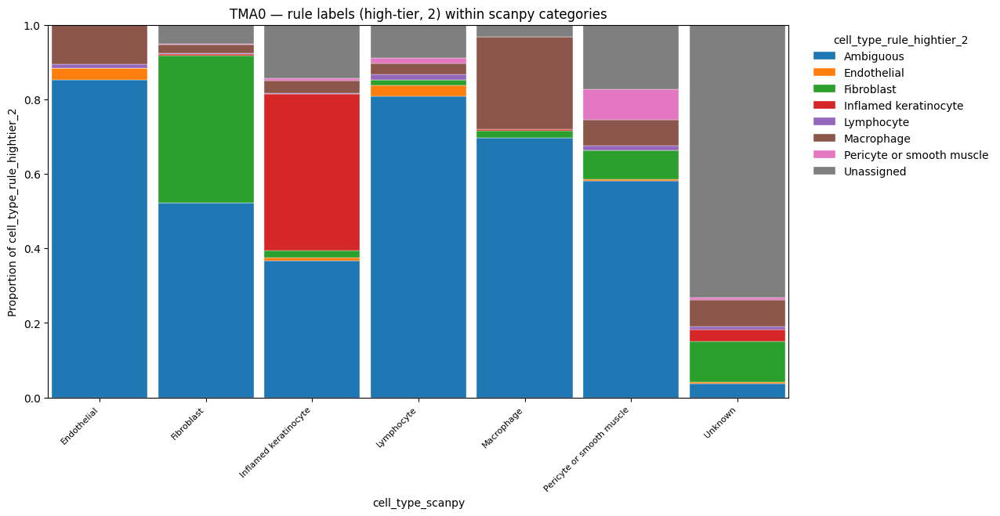

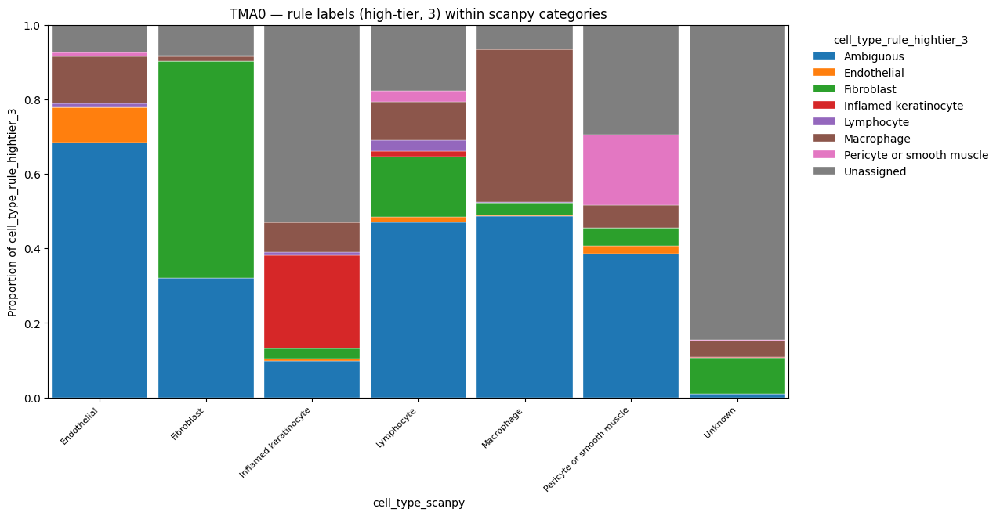

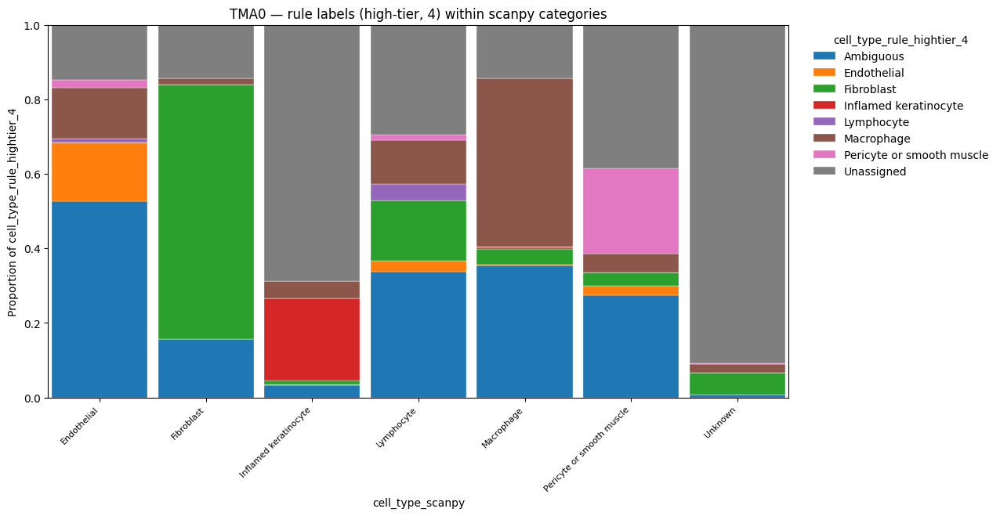

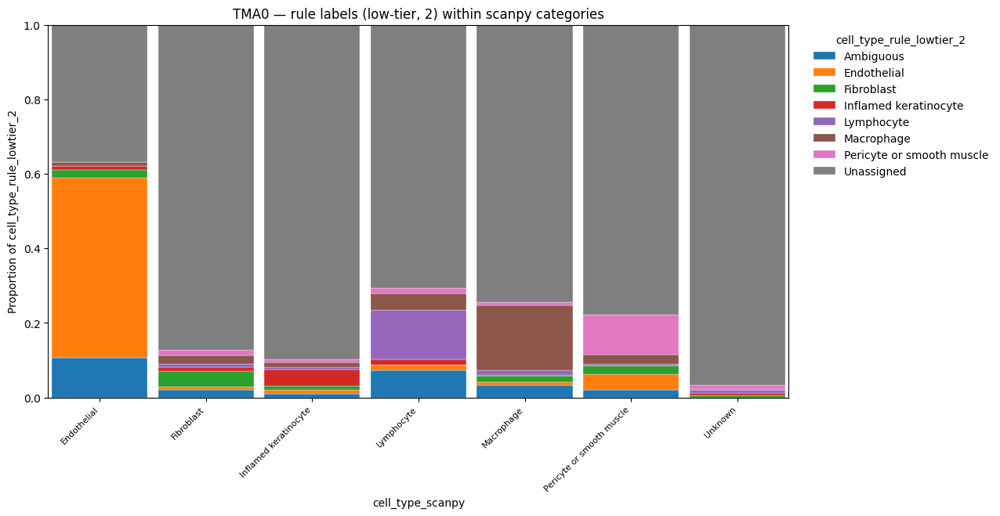

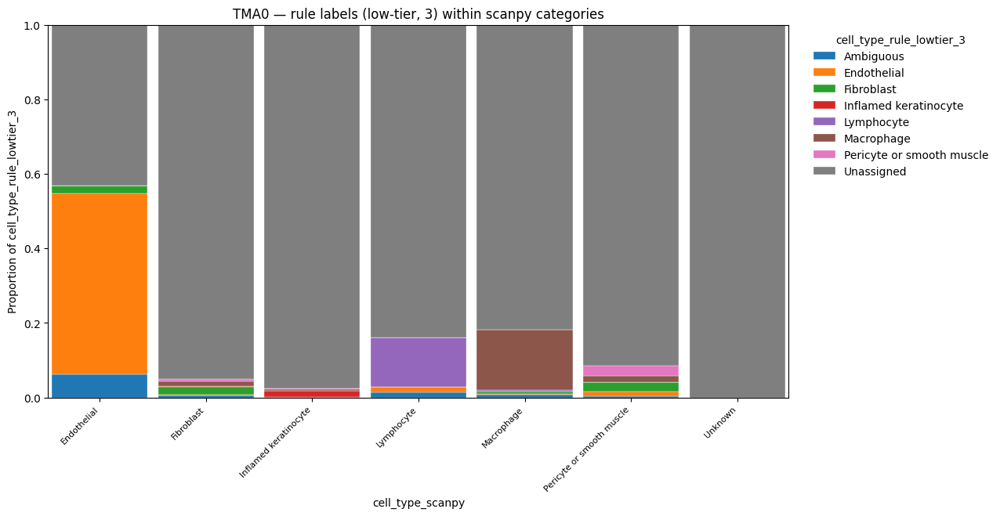

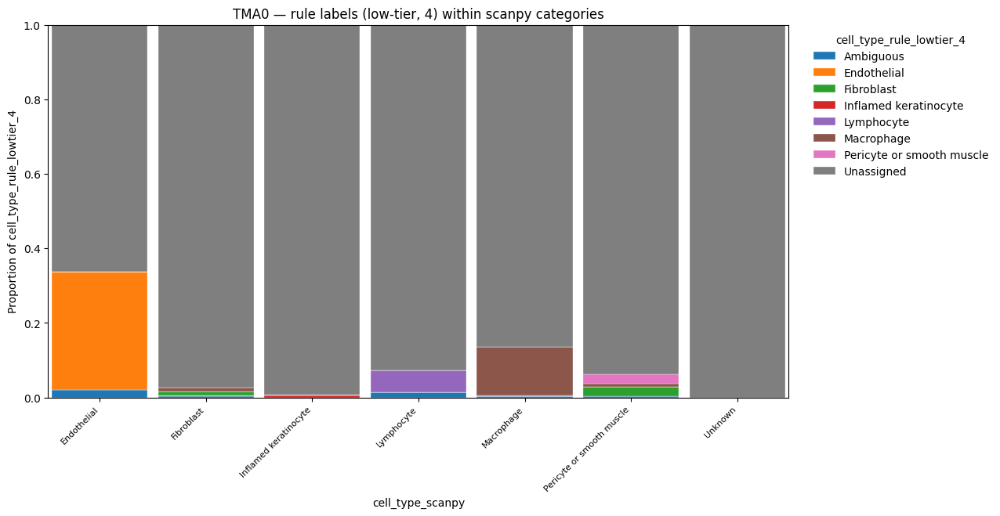

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA0/adata_core_TMA0_final.h5ad

############################################################
# TMA1
############################################################
Loaded TMA1: (3358, 6182)
cell_type_scanpy
Fibroblast                    867
Unknown                       845
Keratinocyte                  553
Pericyte or smooth muscle     399
Macrophage                    378
Endothelial and macrophage    316
Name: count, dtype: int64
  Rule-based comparison using: ['Endothelial', 'Fibroblast', 'Keratinocyte', 'Macrophage', 'Pericyte or smooth muscle']


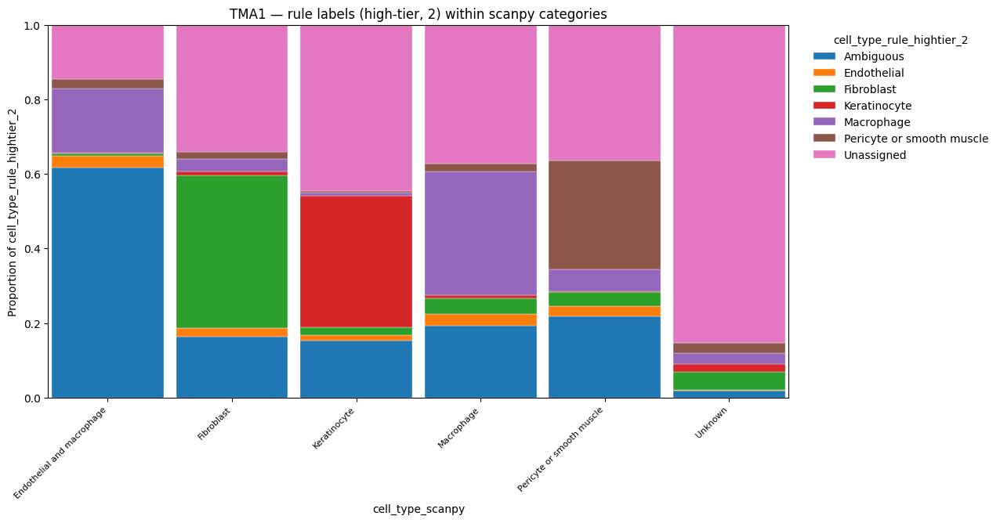

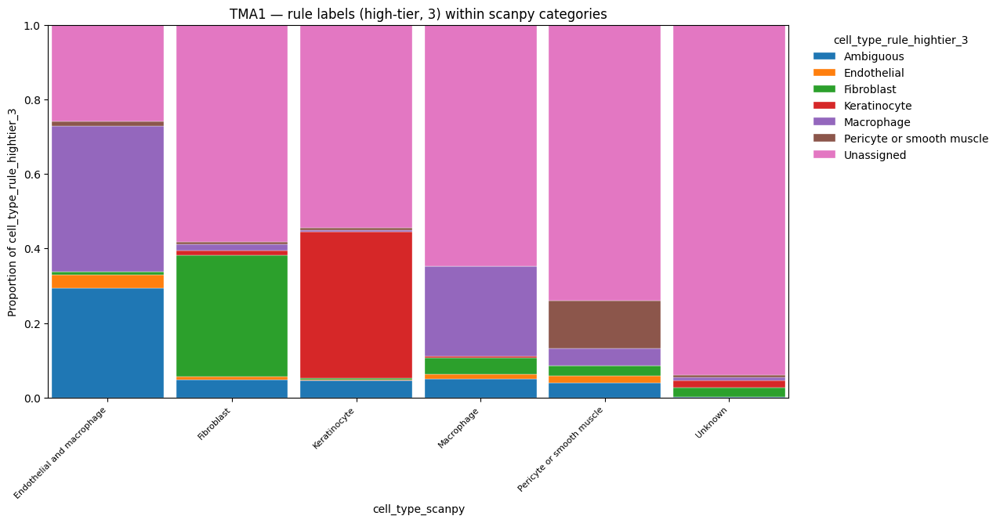

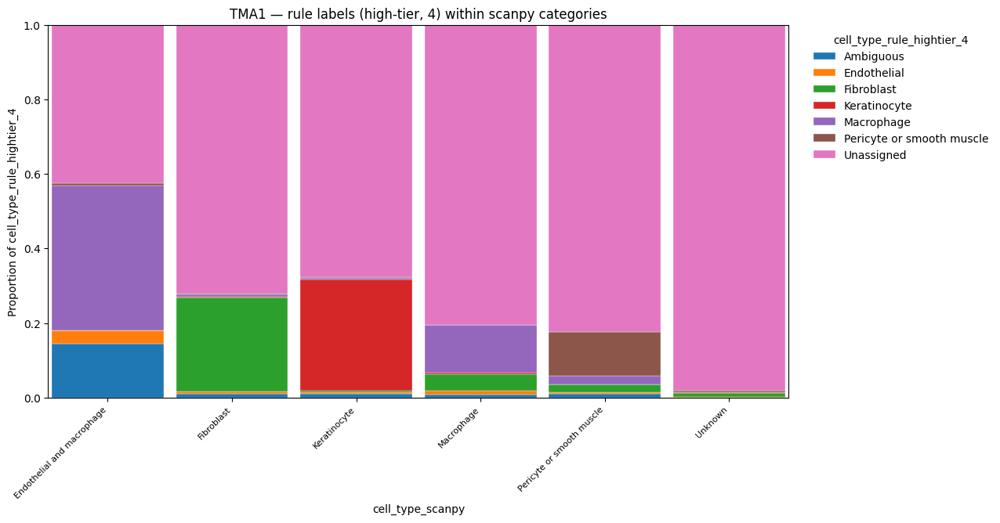

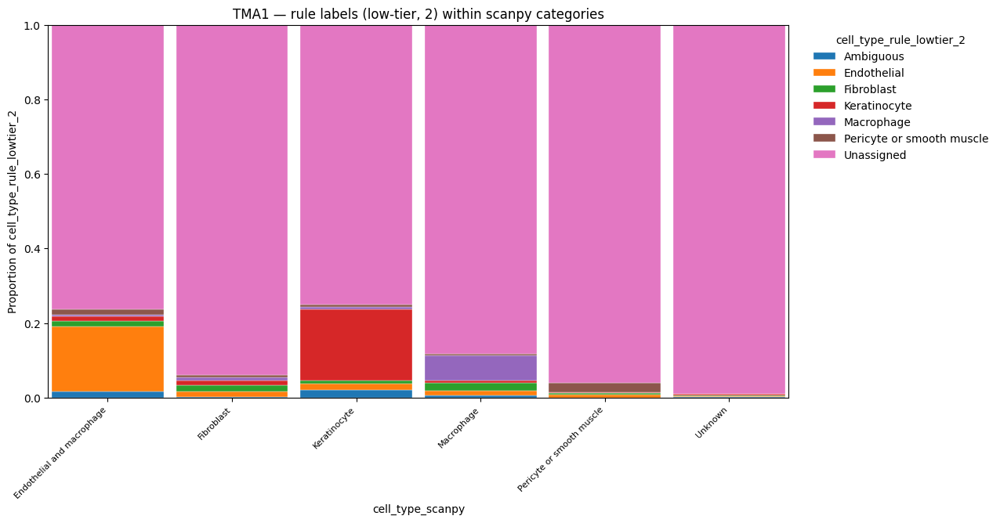

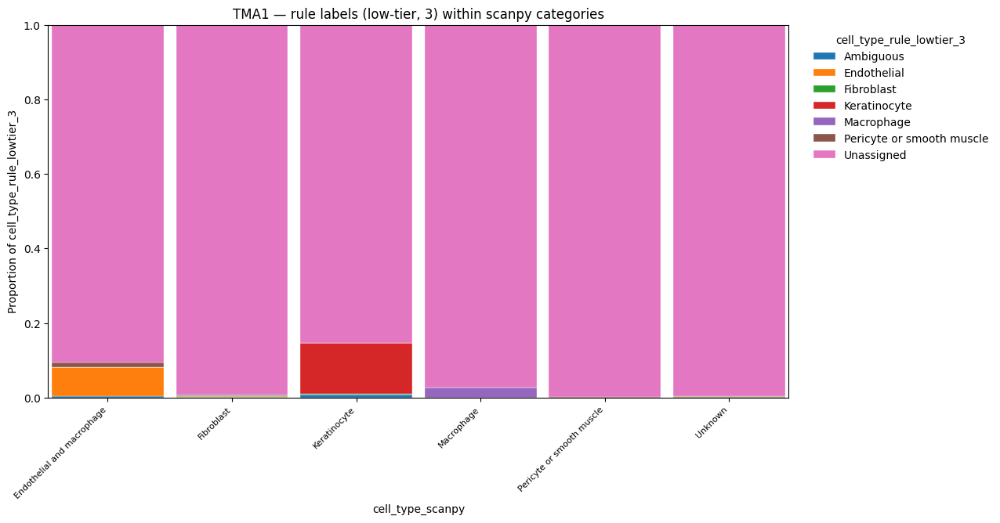

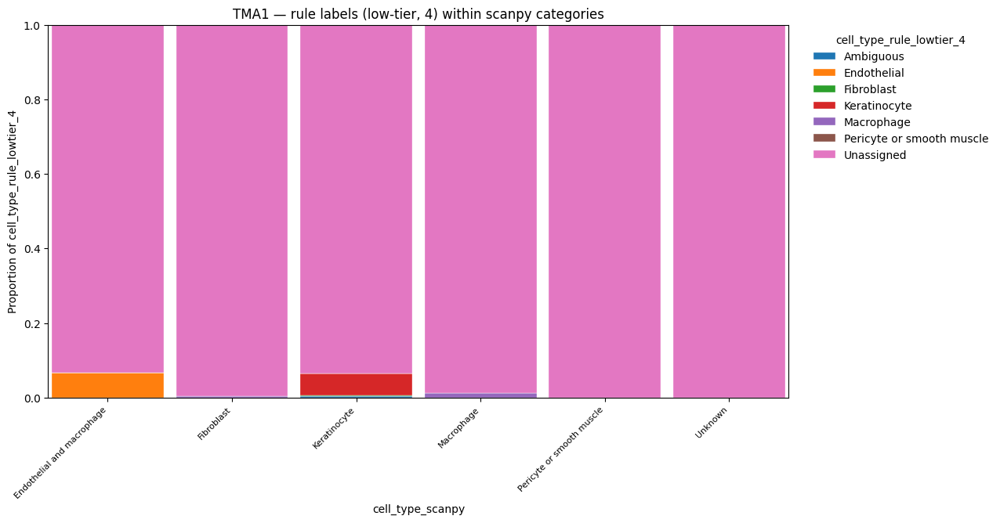

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA1/adata_core_TMA1_final.h5ad

############################################################
# TMA2
############################################################
Loaded TMA2: (5228, 6182)
cell_type_scanpy
Epithelial (unspecified)     2063
Unknown                      1205
Macrophage and fibroblast     525
Lymphocyte                    476
Macrophage                    402
Pericyte or smooth muscle     388
Fibroblast                    169
Name: count, dtype: int64
  Rule-based comparison using: ['Epithelial (unspecified)', 'Fibroblast', 'Lymphocyte', 'Macrophage', 'Pericyte or smooth muscle']


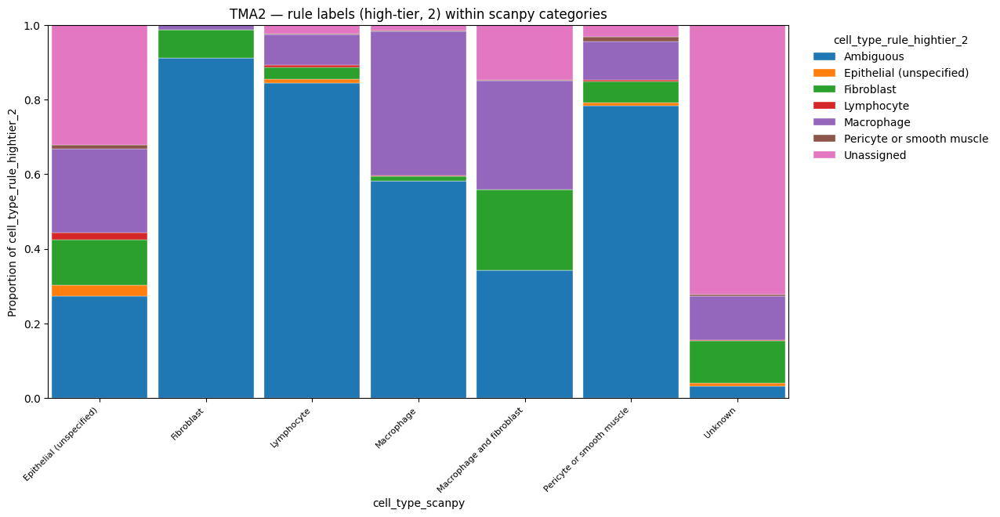

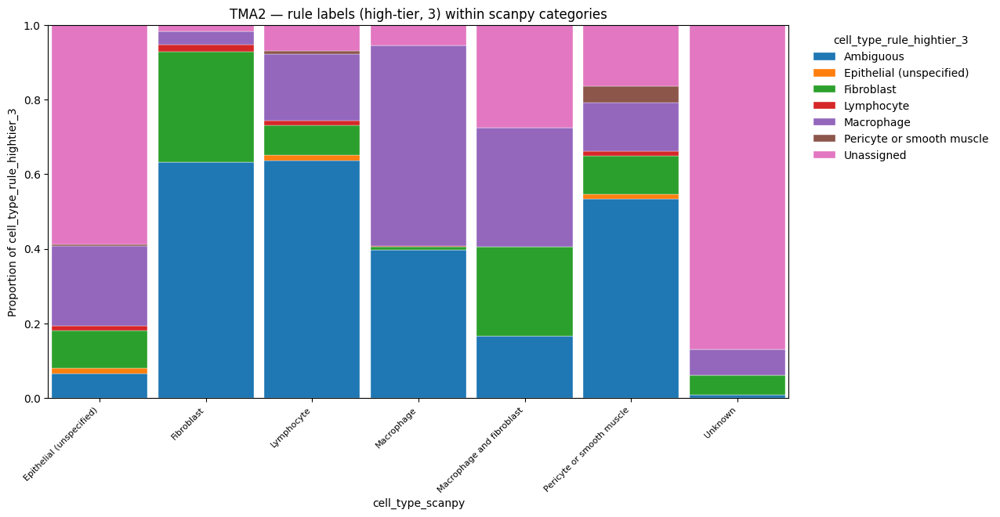

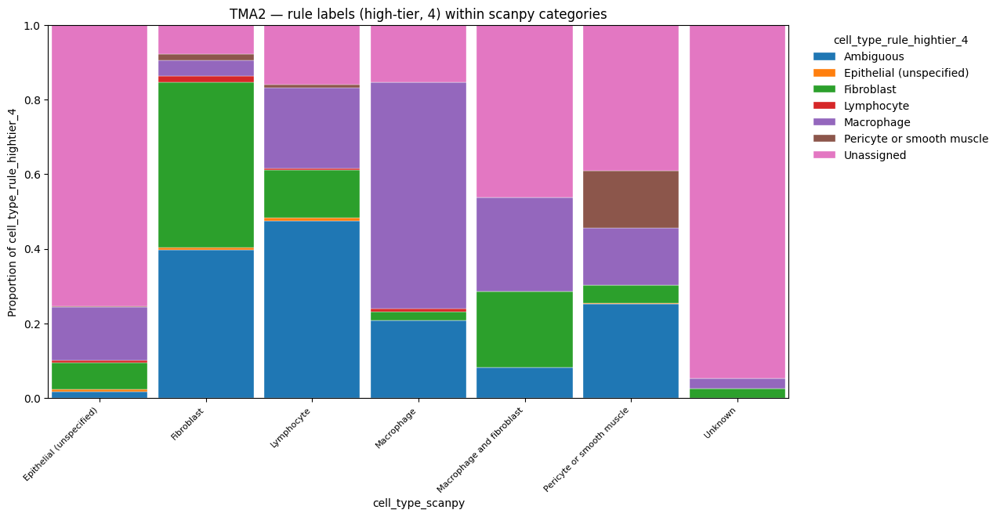

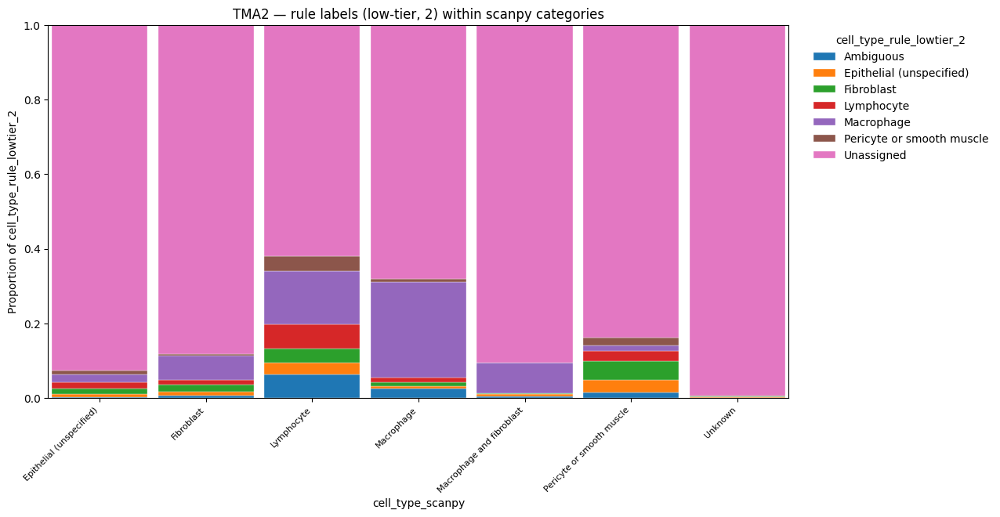

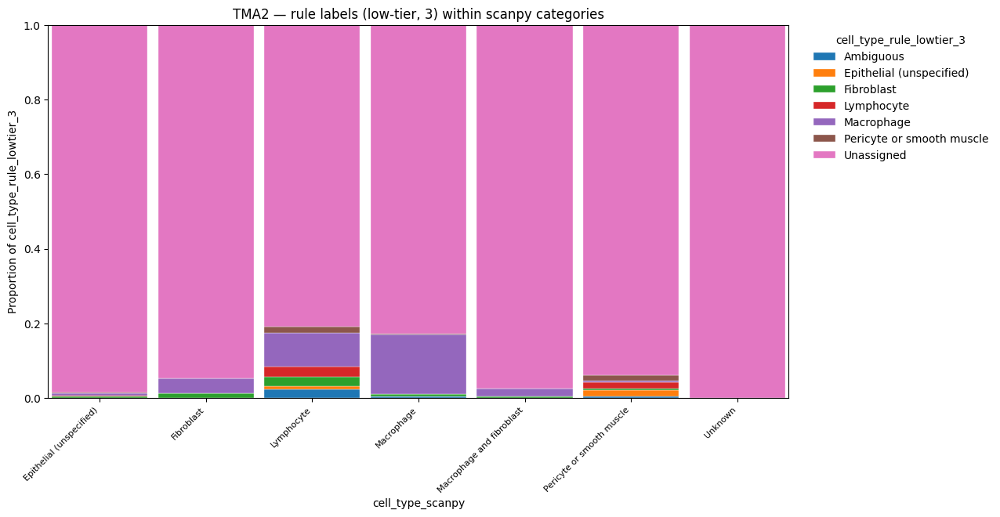

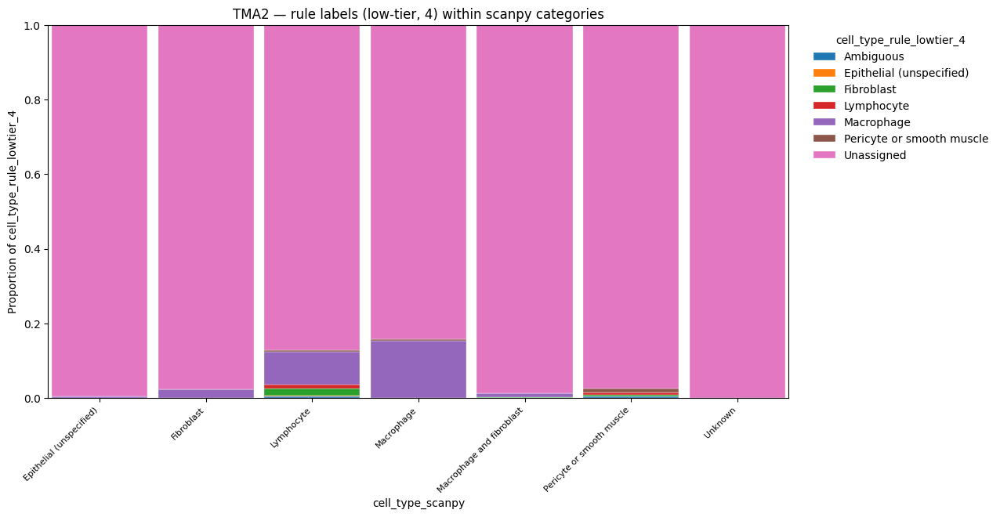

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA2/adata_core_TMA2_final.h5ad

############################################################
# TMA3
############################################################
Loaded TMA3: (2086, 6182)
cell_type_scanpy
Keratinocyte                 783
Fibroblast                   553
Unknown                      431
Macrophage                   194
Pericyte or smooth muscle    125
Name: count, dtype: int64
  Rule-based comparison using: ['Fibroblast', 'Keratinocyte', 'Macrophage', 'Pericyte or smooth muscle']


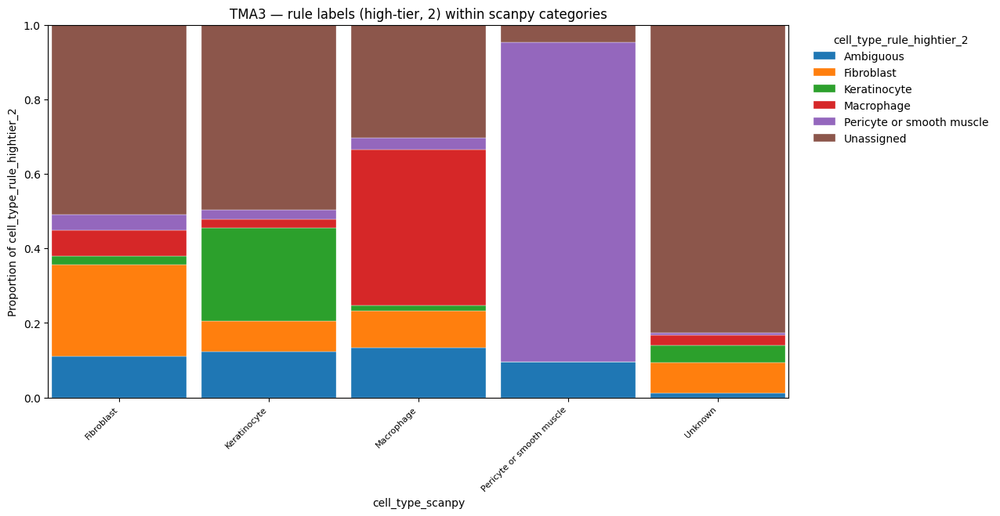

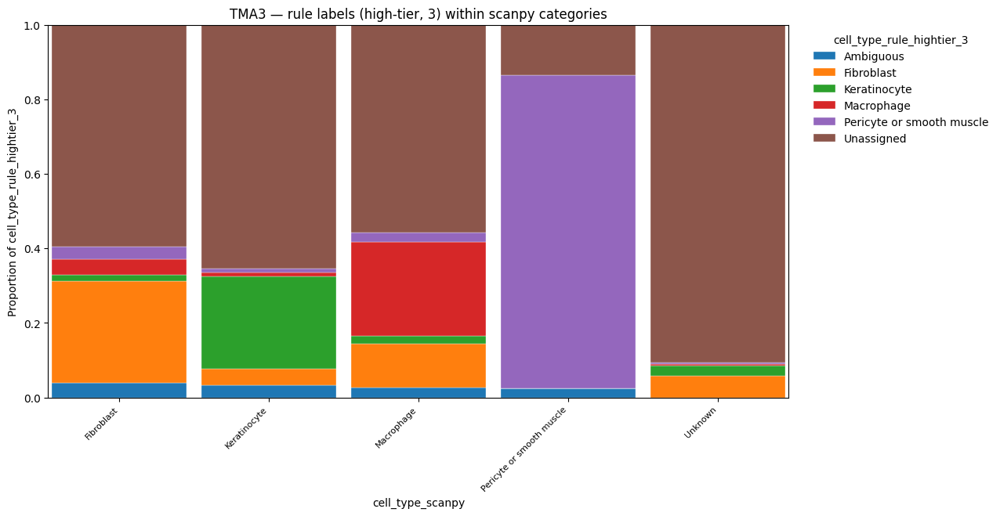

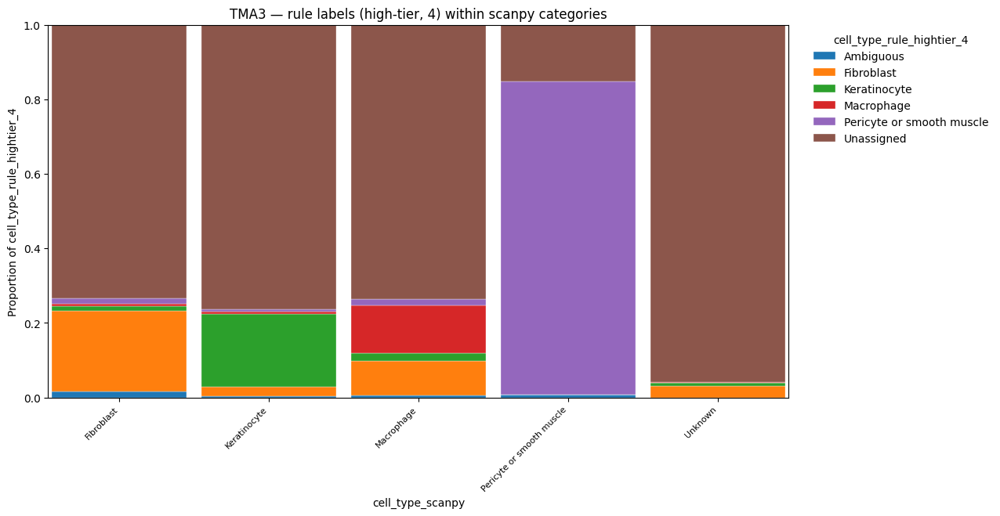

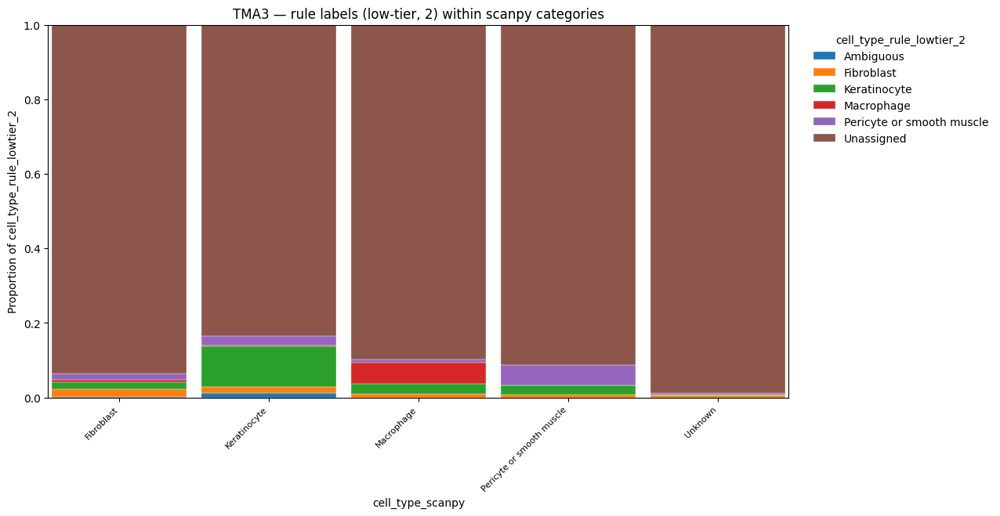

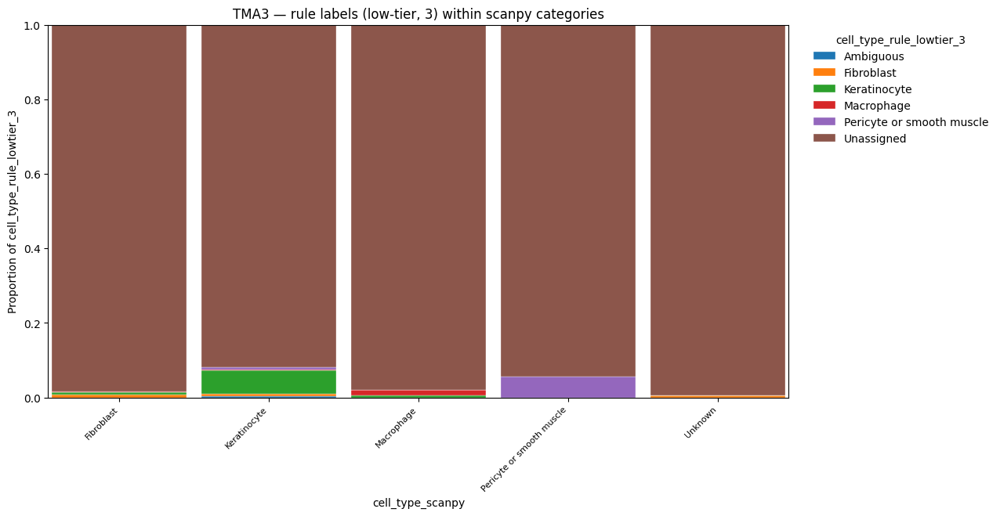

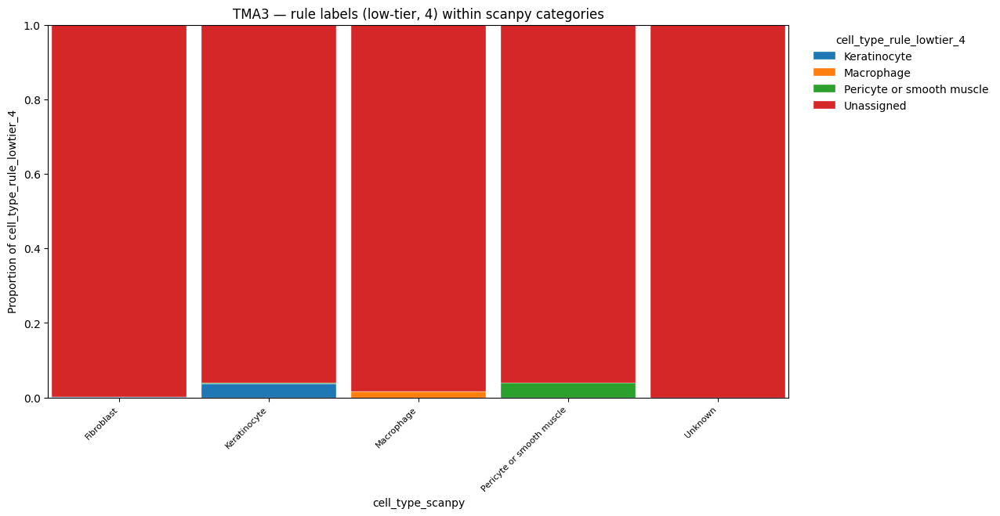

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA3/adata_core_TMA3_final.h5ad

############################################################
# TMA4
############################################################
Loaded TMA4: (4315, 6182)
cell_type_scanpy
Inflamed keratinocyte       1163
Unknown                      989
Macrophage                   922
Fibroblast                   547
Lymphocyte                   400
Endothelial                  194
Epithelial (unspecified)     100
Name: count, dtype: int64
  Rule-based comparison using: ['Endothelial', 'Epithelial (unspecified)', 'Fibroblast', 'Inflamed keratinocyte', 'Lymphocyte', 'Macrophage']


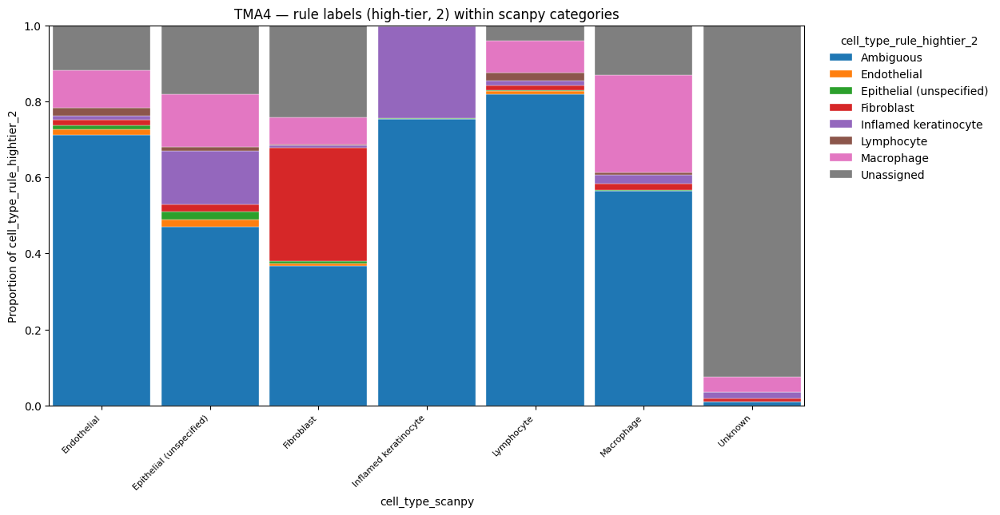

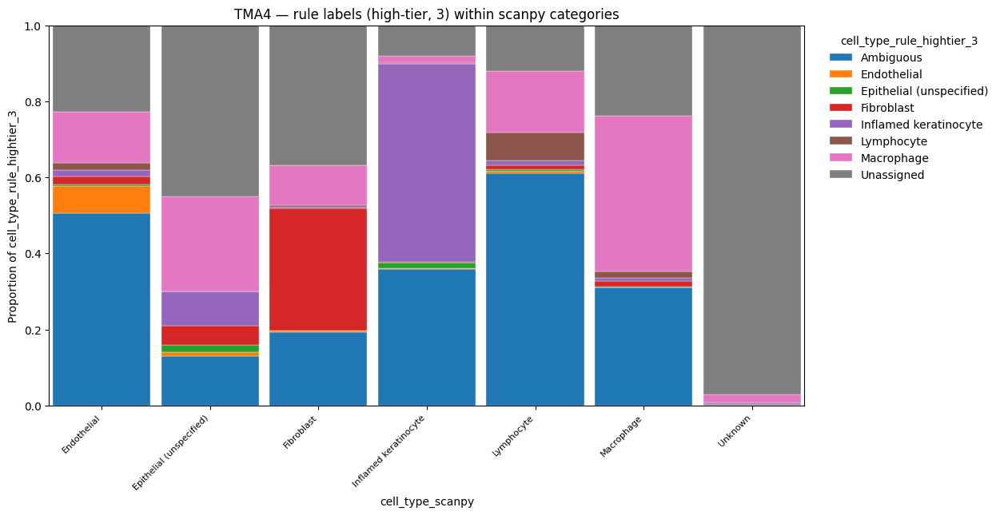

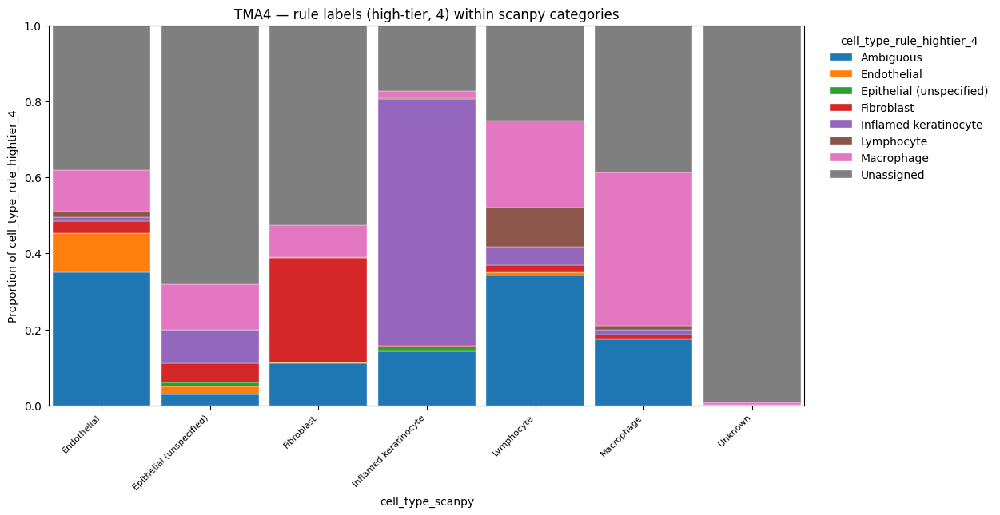

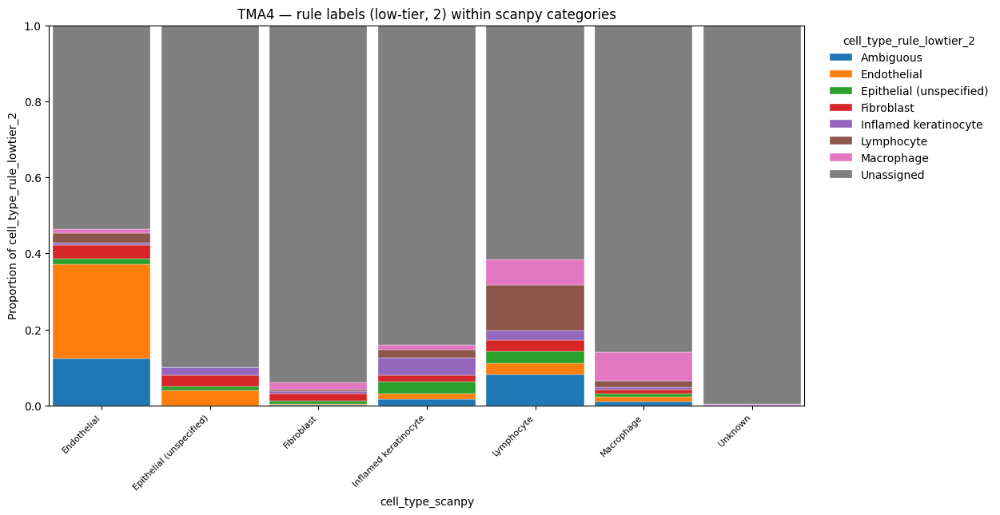

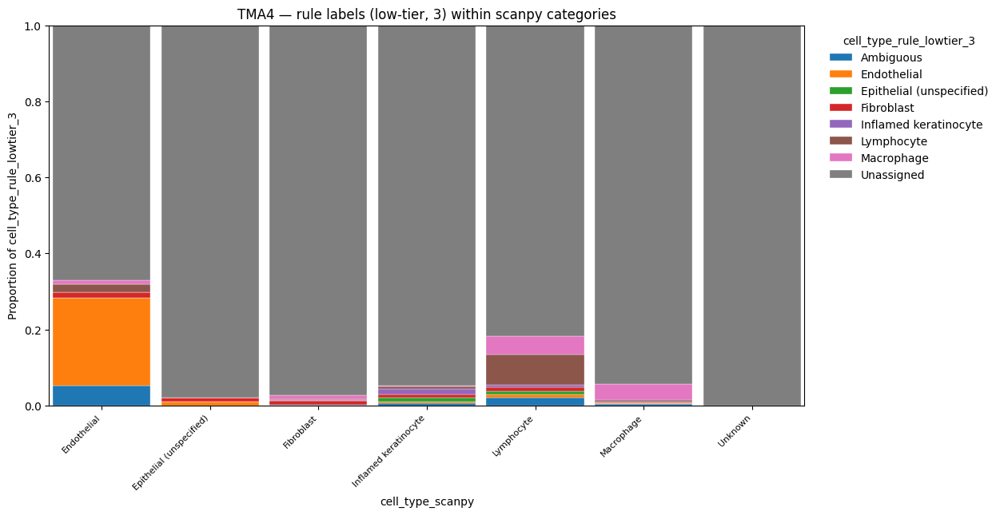

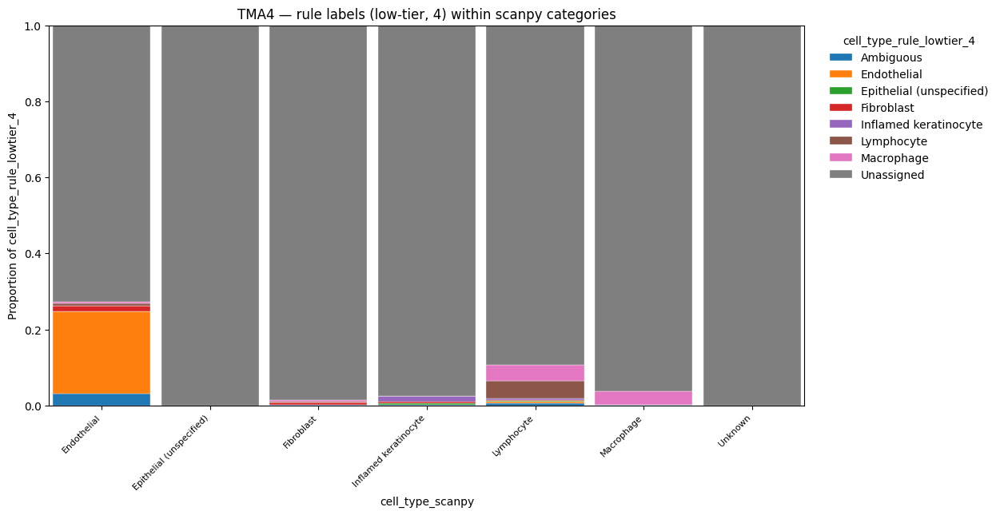

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA4/adata_core_TMA4_final.h5ad

############################################################
# TMA5
############################################################
Loaded TMA5: (1735, 6182)
cell_type_scanpy
Unknown       1641
Fibroblast      94
Name: count, dtype: int64
  Rule-based comparison using: ['Fibroblast']


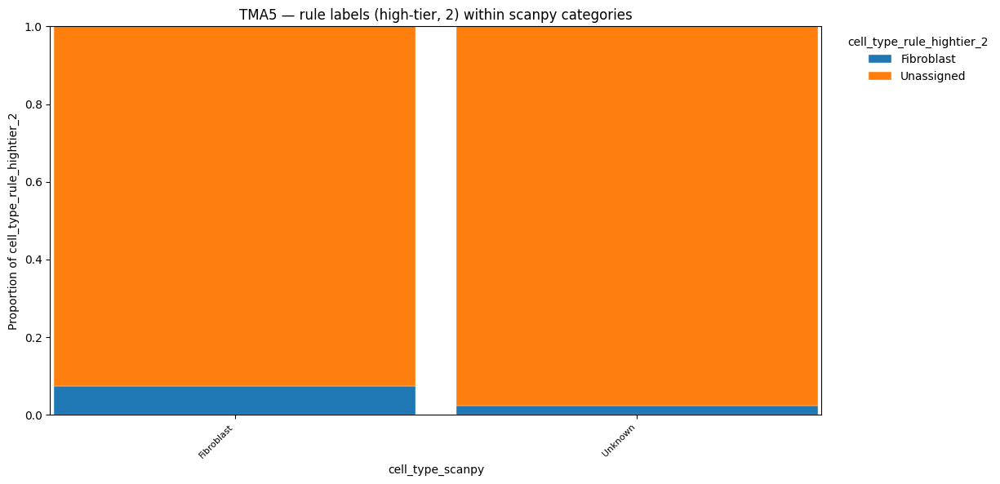

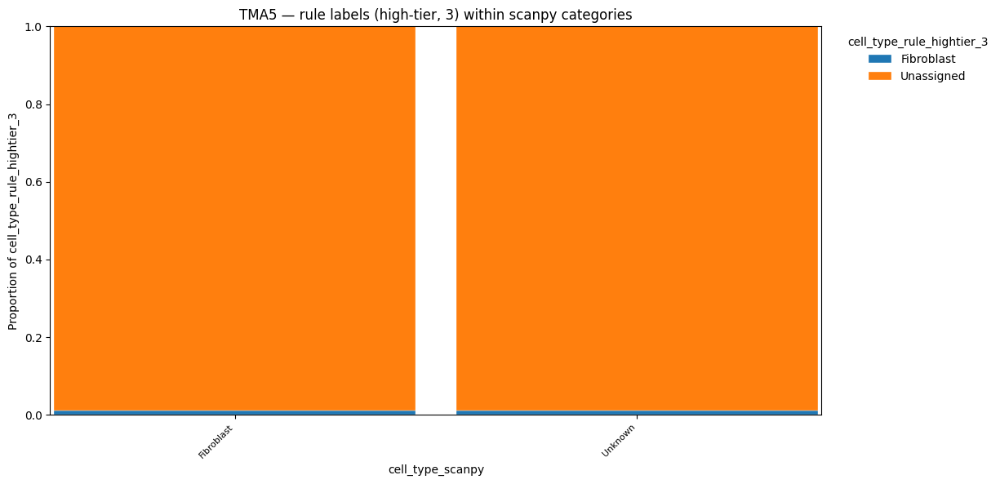

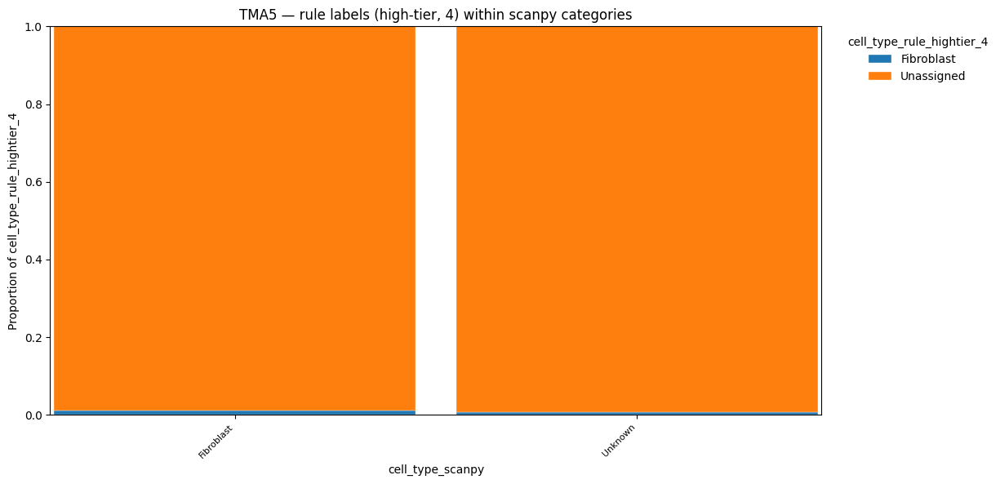

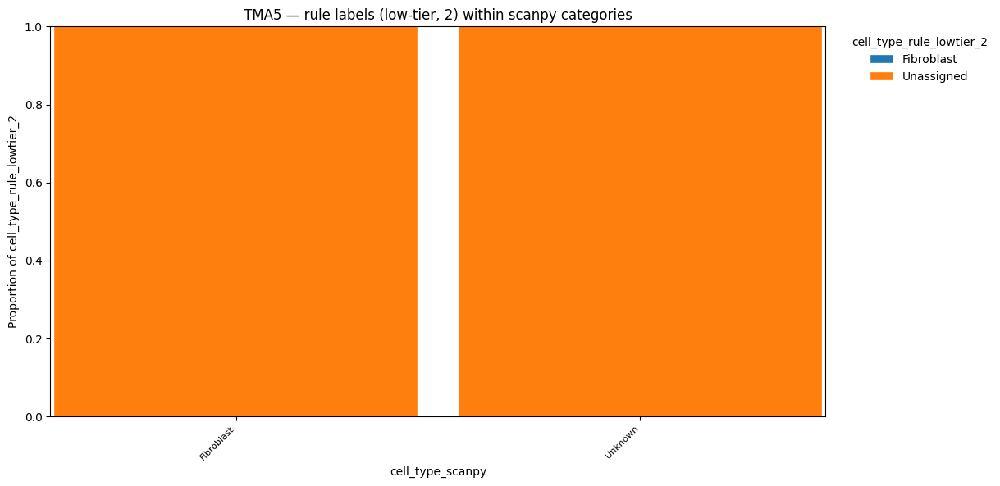

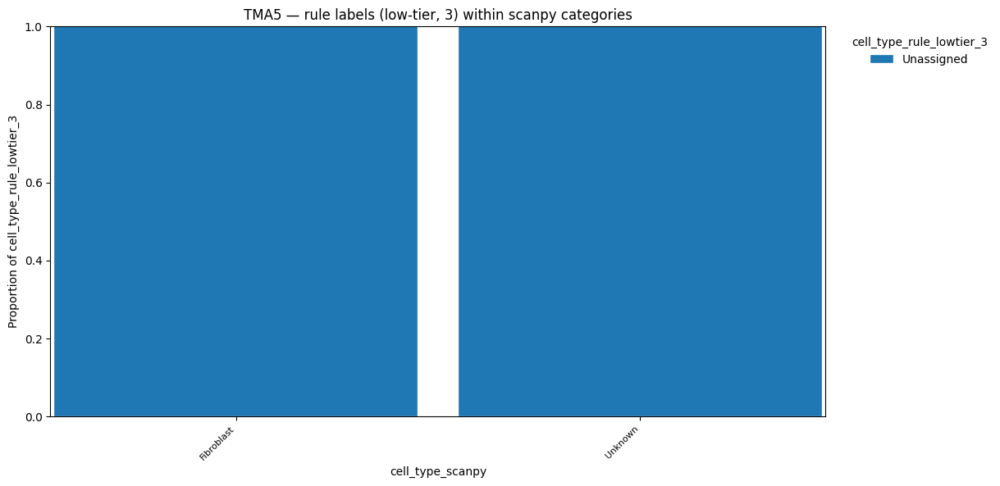

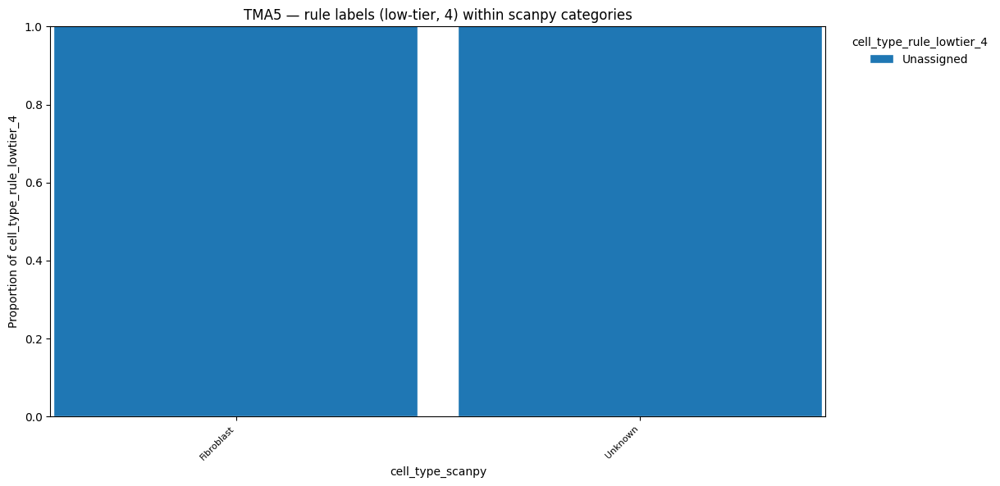

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA5/adata_core_TMA5_final.h5ad

############################################################
# TMA6
############################################################
Loaded TMA6: (2692, 6182)
cell_type_scanpy
Unknown         1201
Fibroblast       686
Keratinocyte     463
Macrophage       342
Name: count, dtype: int64
  Rule-based comparison using: ['Fibroblast', 'Keratinocyte', 'Macrophage']


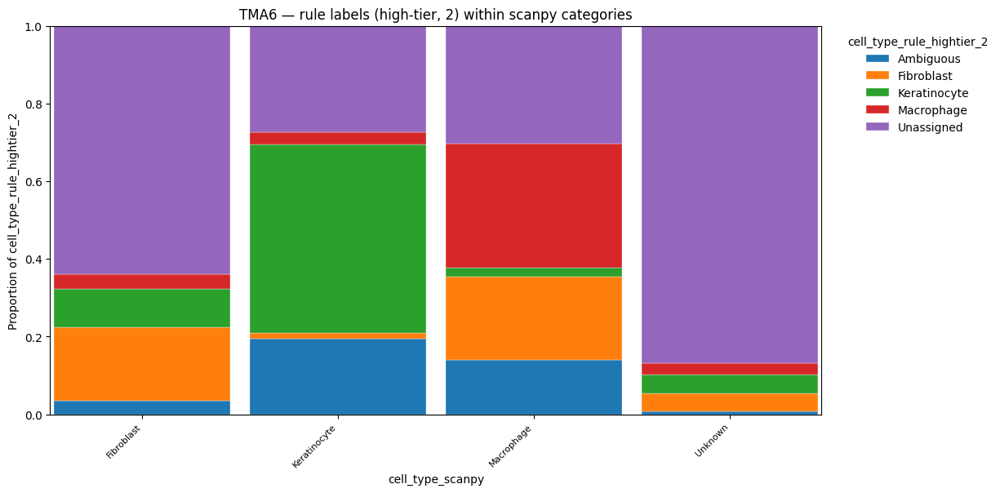

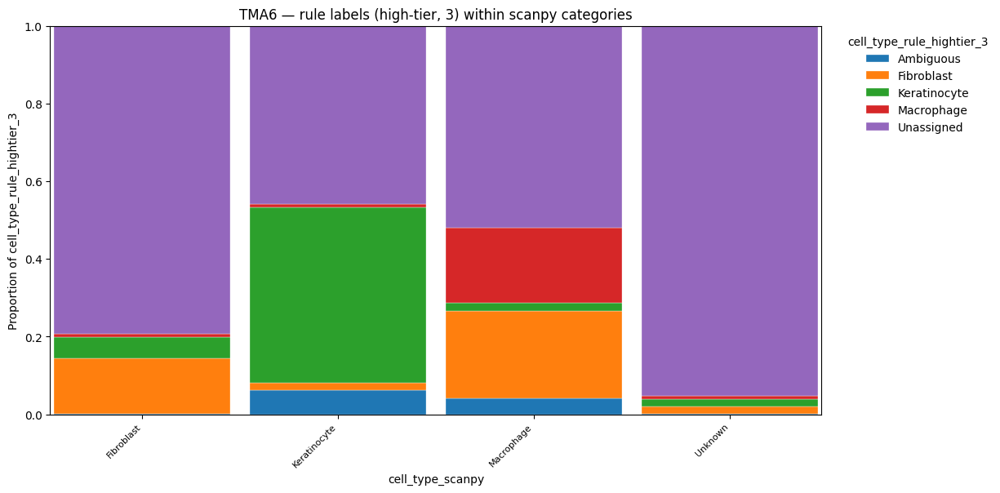

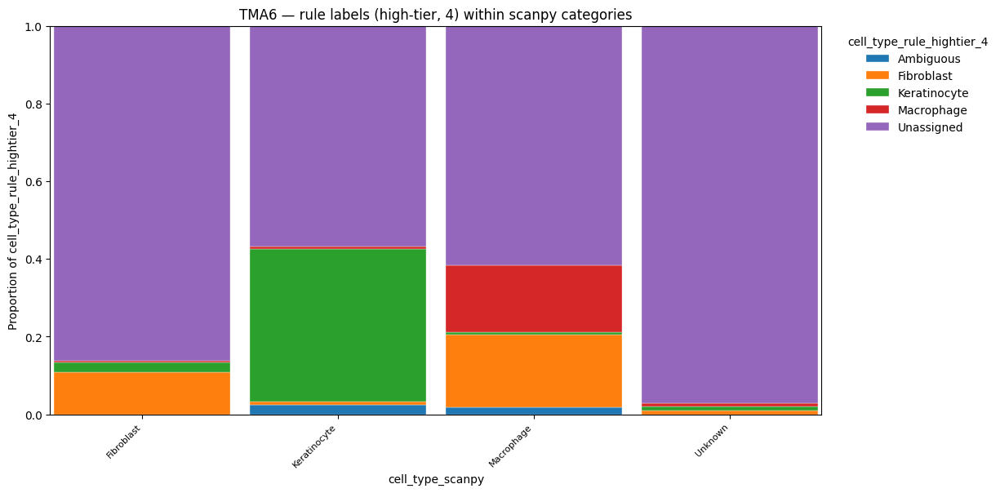

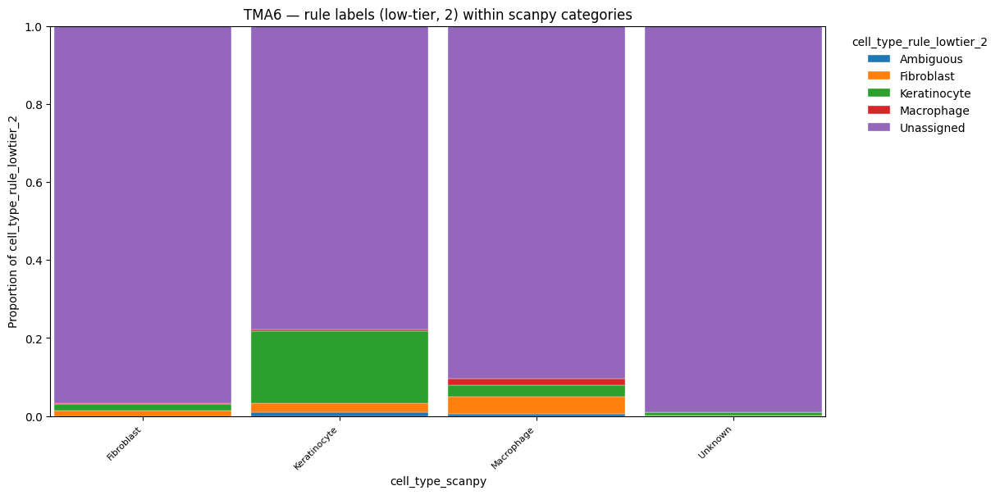

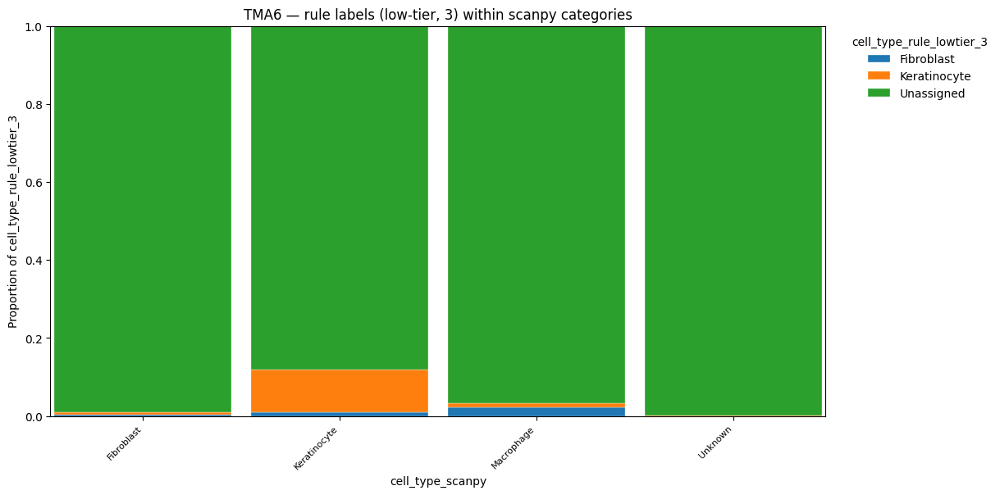

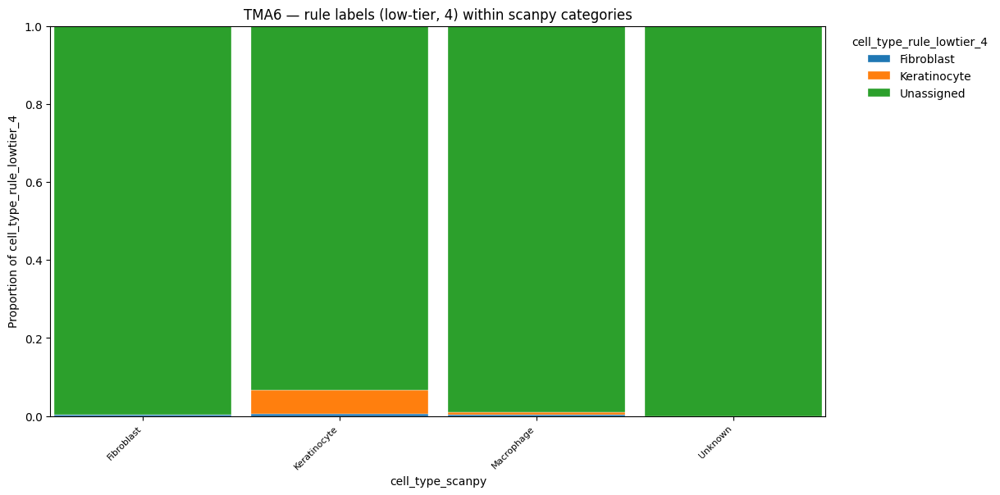

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA6/adata_core_TMA6_final.h5ad

############################################################
# TMA7
############################################################
Loaded TMA7: (4373, 6182)
cell_type_scanpy
Inflamed keratinocyte    1126
Fibroblast               1076
Keratinocyte              661
Unknown                   651
Macrophage                471
Endothelial               388
Name: count, dtype: int64
  Rule-based comparison using: ['Endothelial', 'Fibroblast', 'Inflamed keratinocyte', 'Keratinocyte', 'Macrophage']


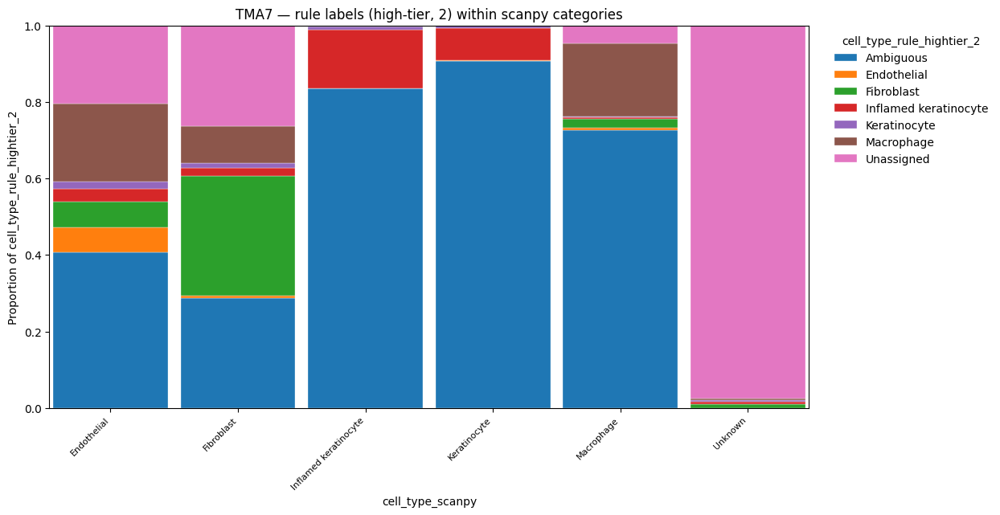

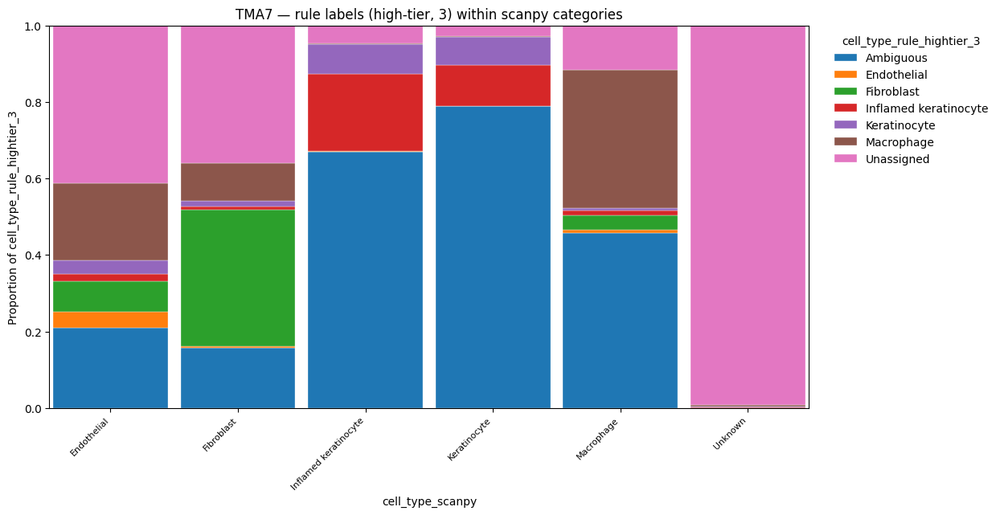

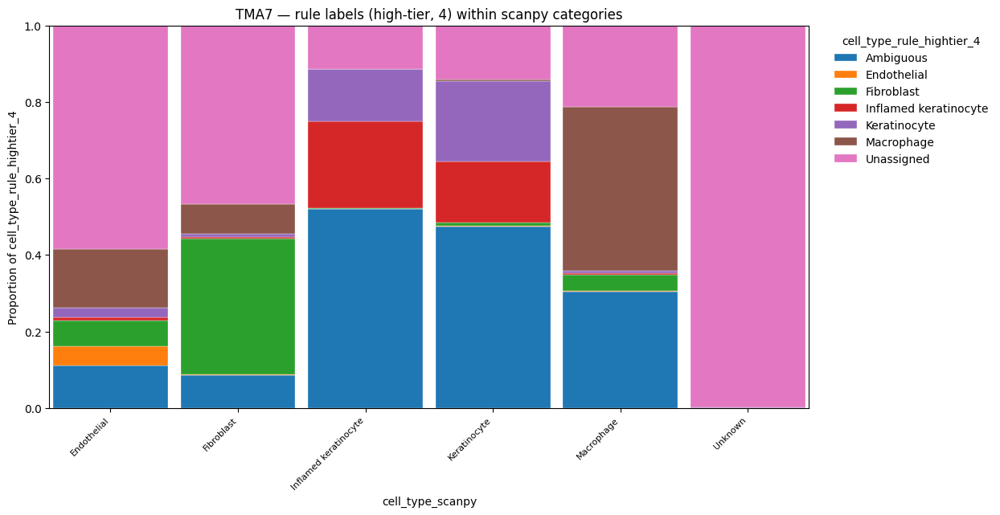

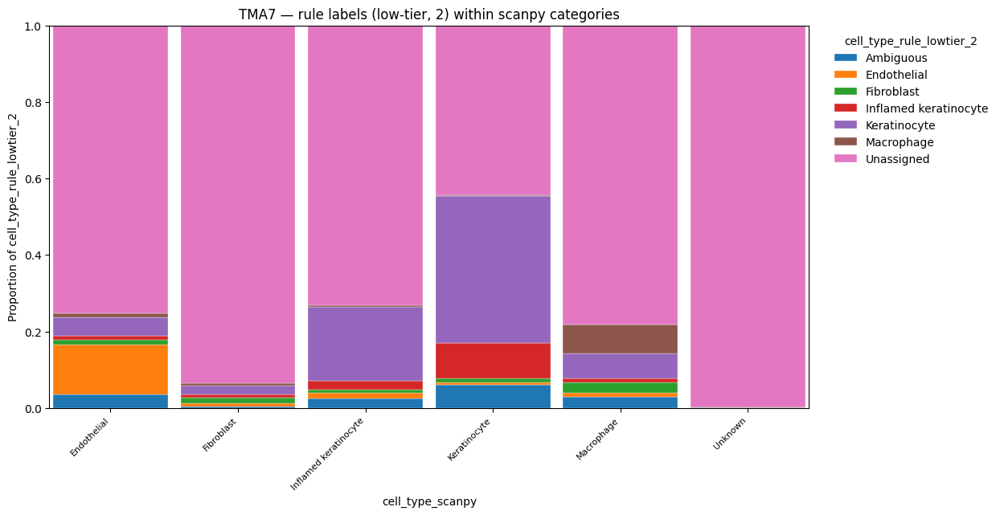

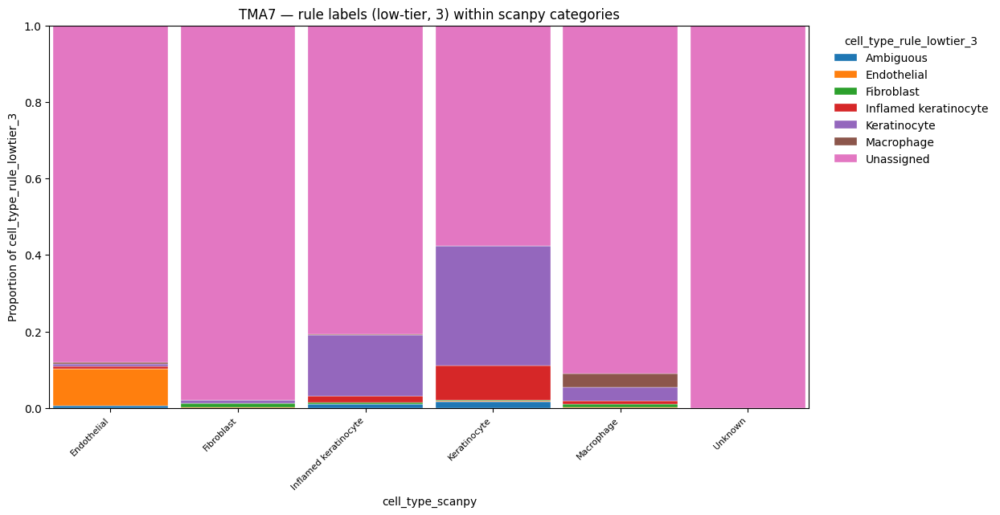

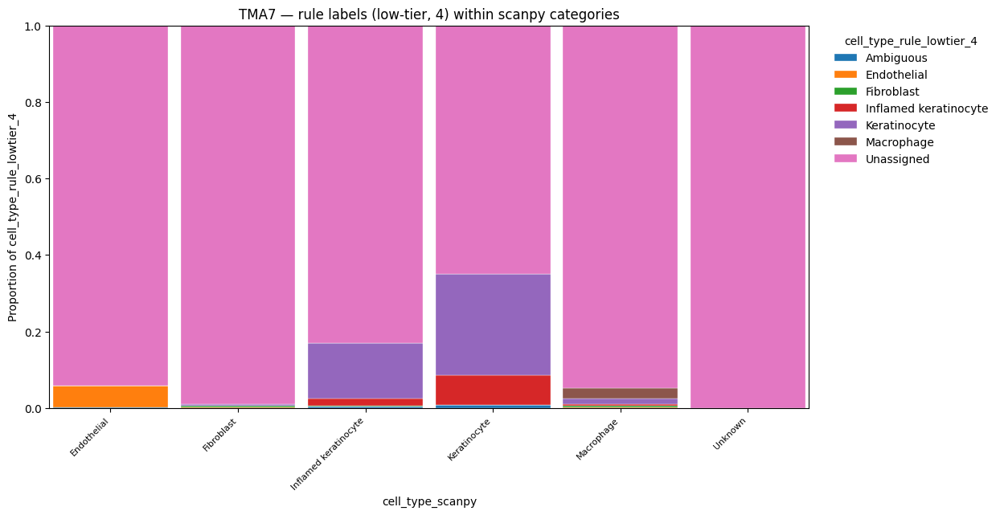

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA7/adata_core_TMA7_final.h5ad

############################################################
# TMA8
############################################################
Loaded TMA8: (1926, 6182)
cell_type_scanpy
Unknown                      534
Keratinocyte                 451
Epithelial (unspecified)     345
Macrophage                   286
Fibroblast                   253
Pericyte or smooth muscle     57
Name: count, dtype: int64
  Rule-based comparison using: ['Epithelial (unspecified)', 'Fibroblast', 'Keratinocyte', 'Macrophage', 'Pericyte or smooth muscle']


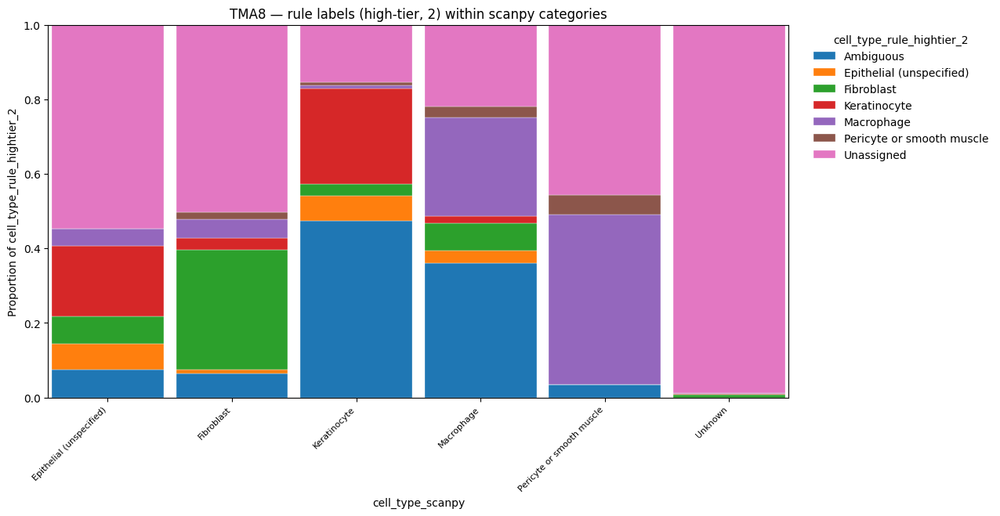

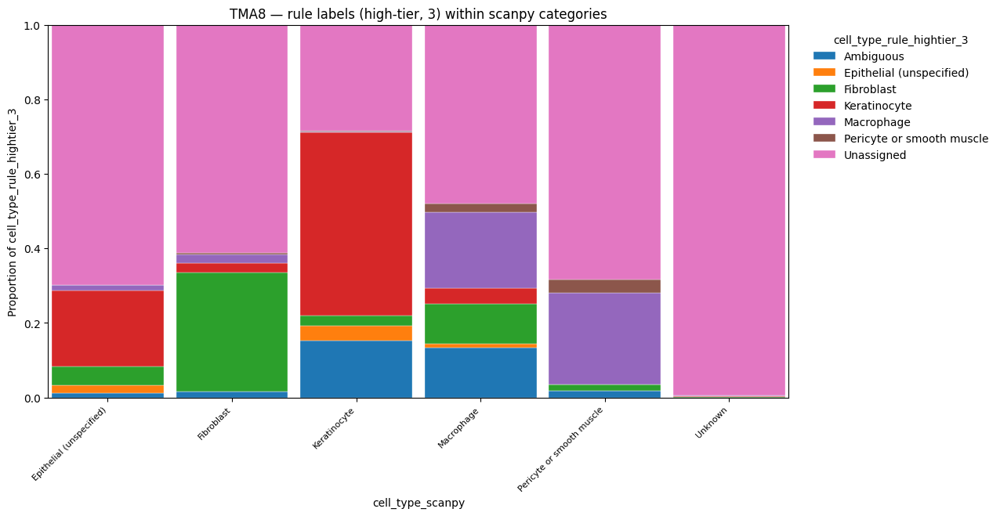

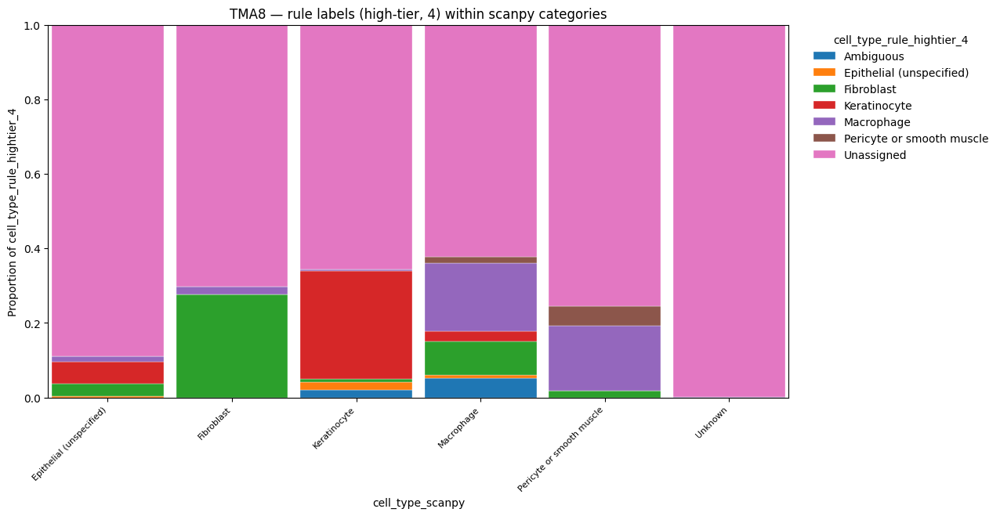

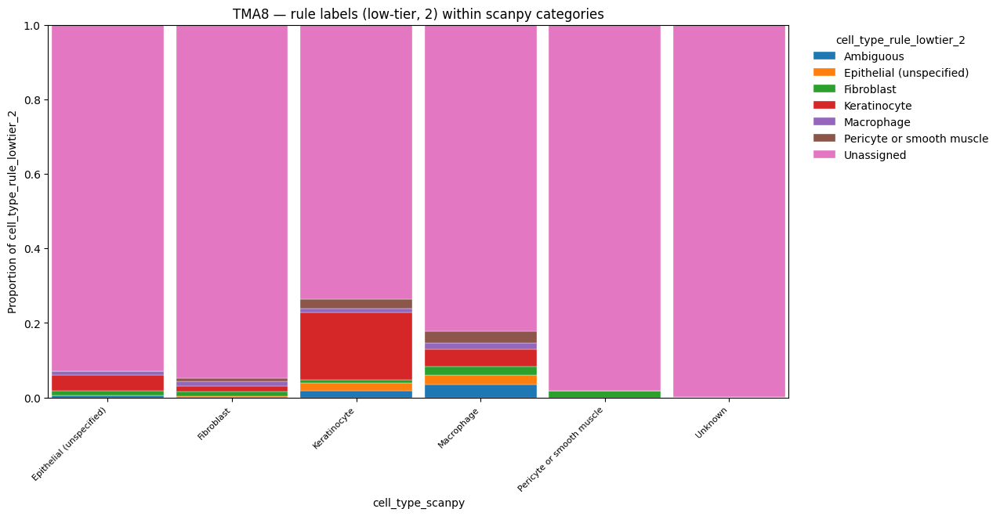

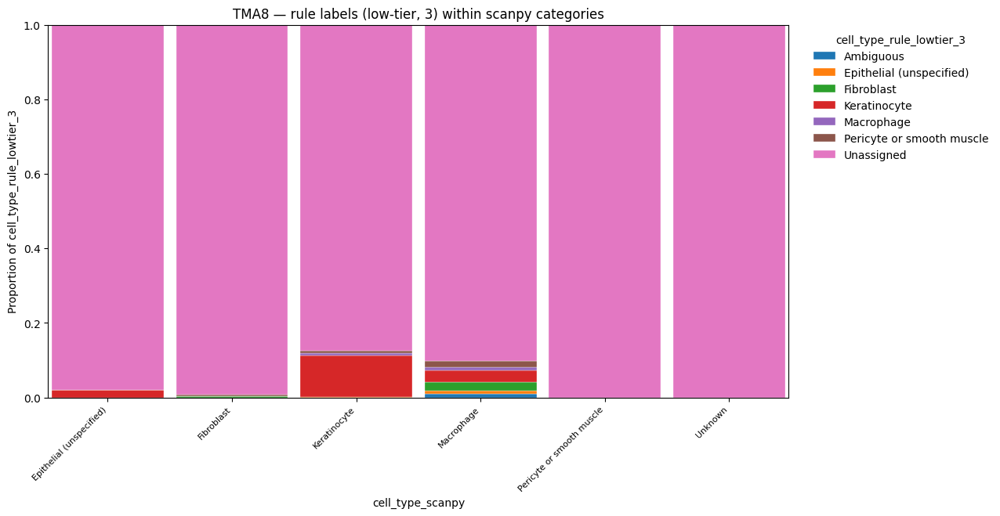

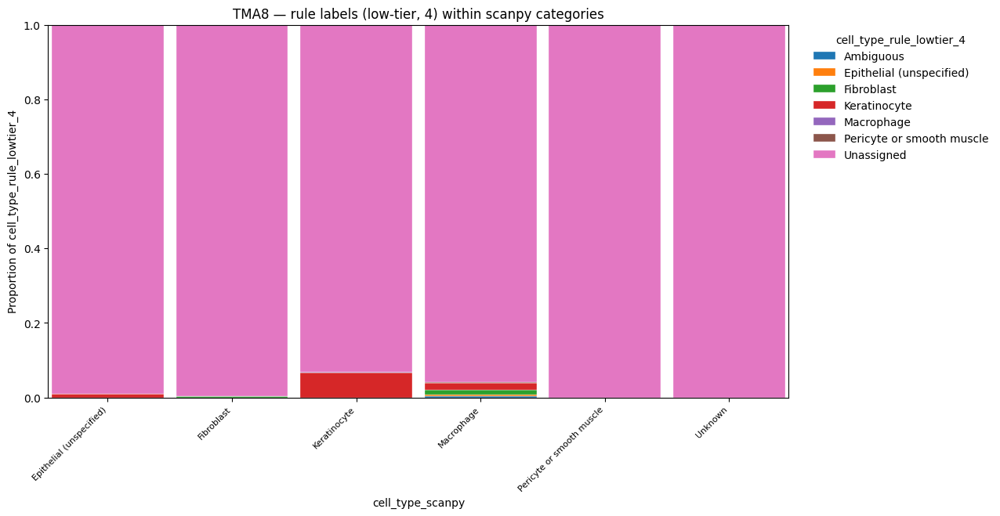

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA8/adata_core_TMA8_final.h5ad

############################################################
# TMA9
############################################################
Loaded TMA9: (3915, 6182)
cell_type_scanpy
Inflamed keratinocyte        890
Keratinocyte                 783
Fibroblast                   739
Unknown                      545
Macrophage                   454
Macrophage and fibroblast    357
Endothelial                  147
Name: count, dtype: int64
  Rule-based comparison using: ['Endothelial', 'Fibroblast', 'Inflamed keratinocyte', 'Keratinocyte', 'Macrophage']


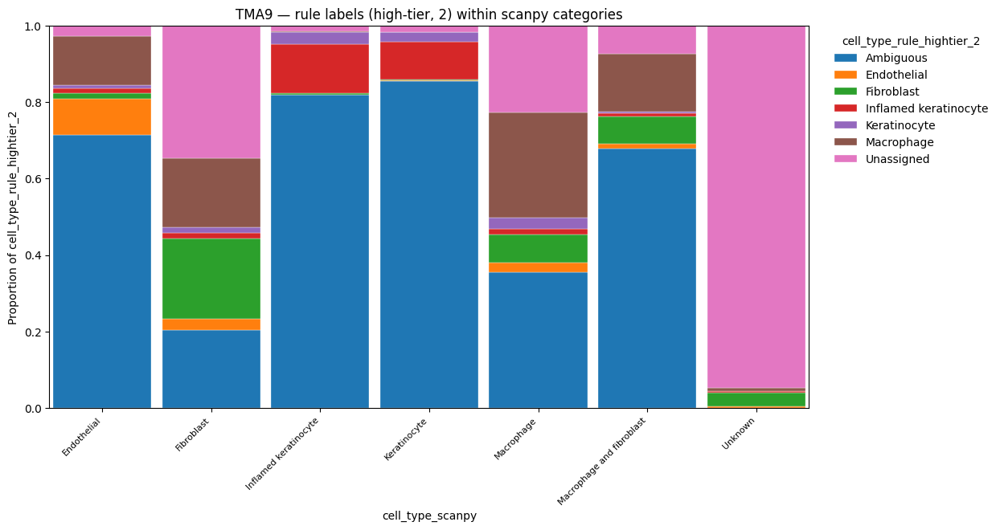

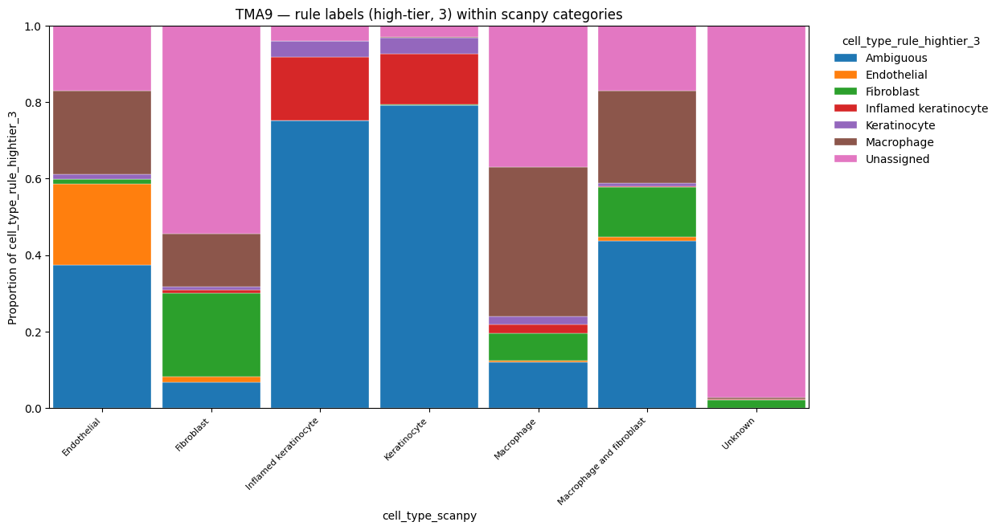

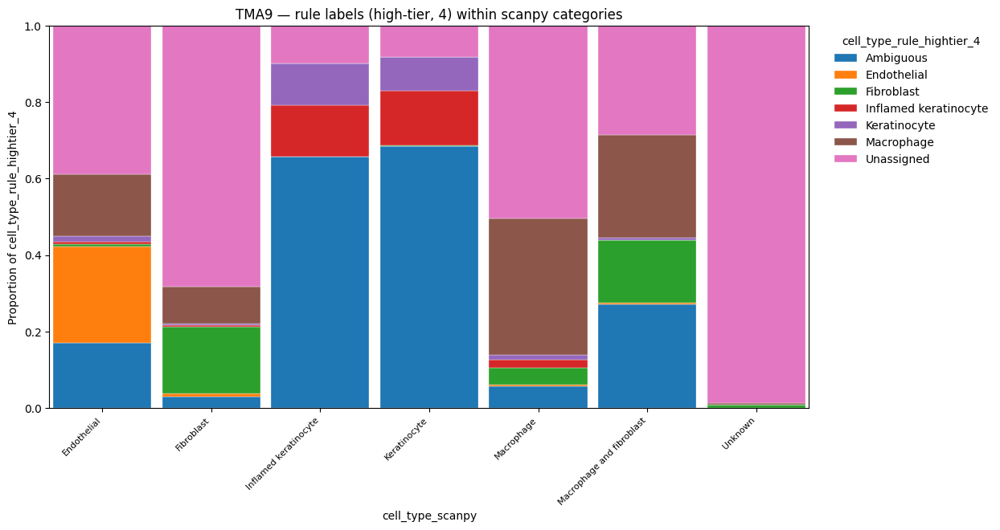

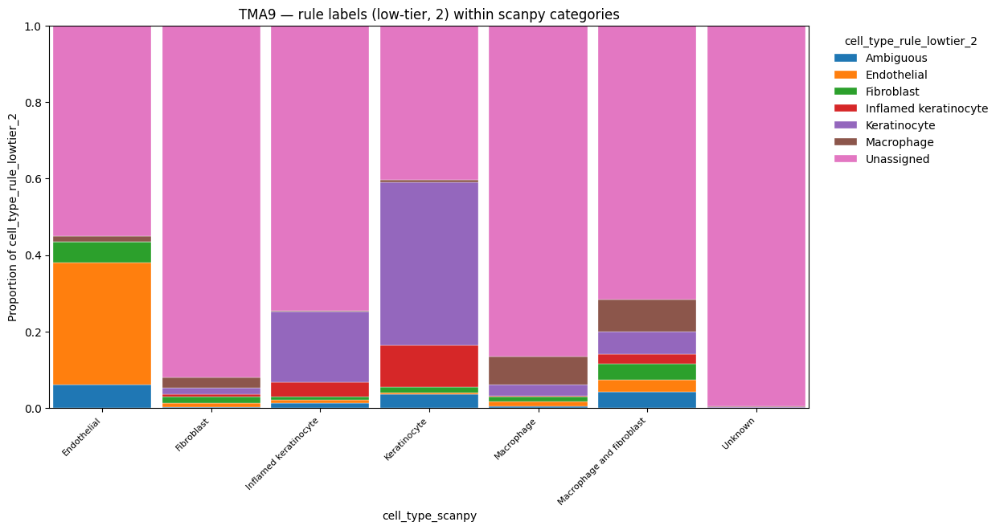

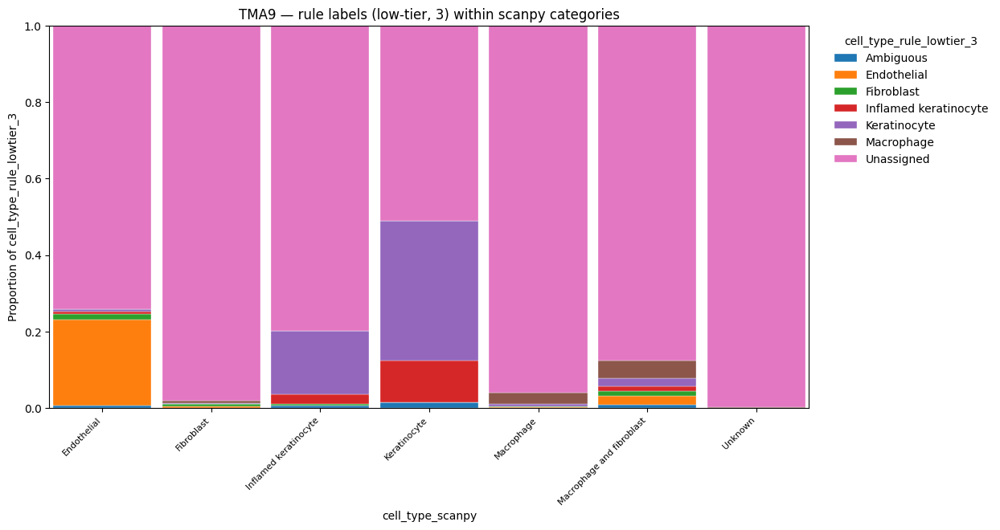

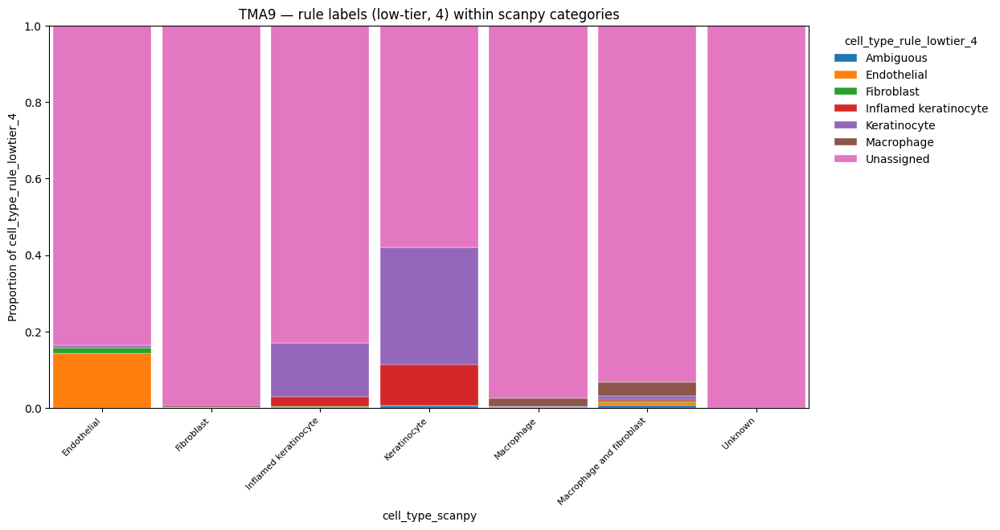

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA9/adata_core_TMA9_final.h5ad

############################################################
# TMA10
############################################################
Loaded TMA10: (2728, 6182)
cell_type_scanpy
Unknown                     1296
Keratinocyte                 433
Macrophage                   406
Epithelial (unspecified)     370
Fibroblast                   223
Name: count, dtype: int64
  Rule-based comparison using: ['Epithelial (unspecified)', 'Fibroblast', 'Keratinocyte', 'Macrophage']


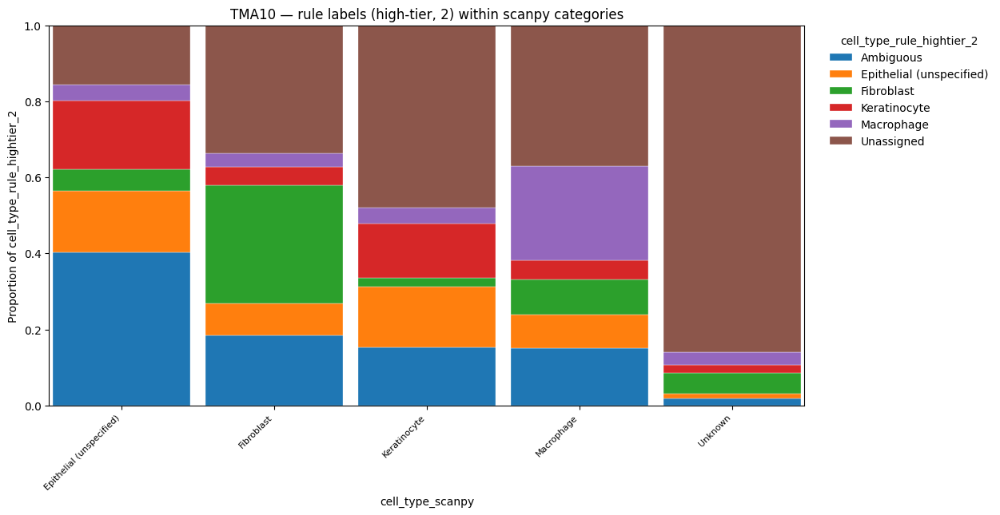

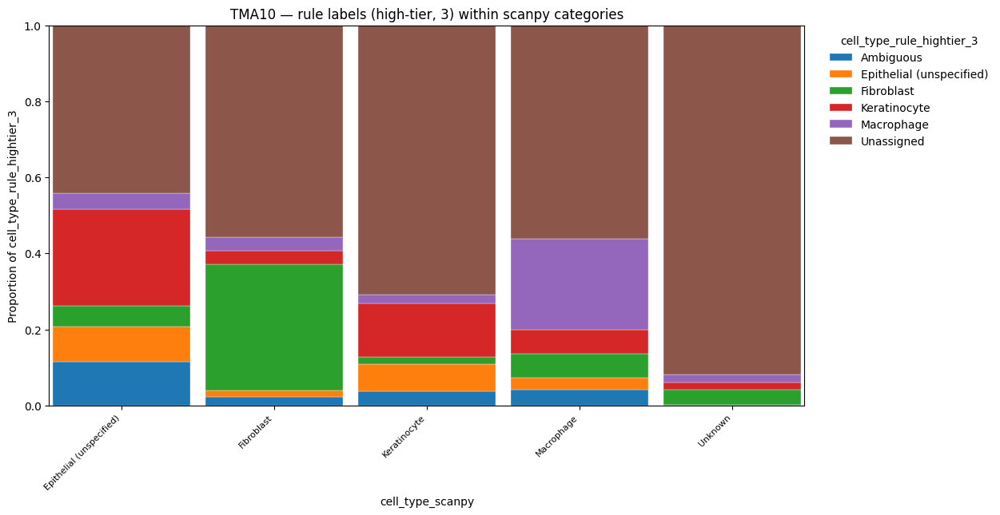

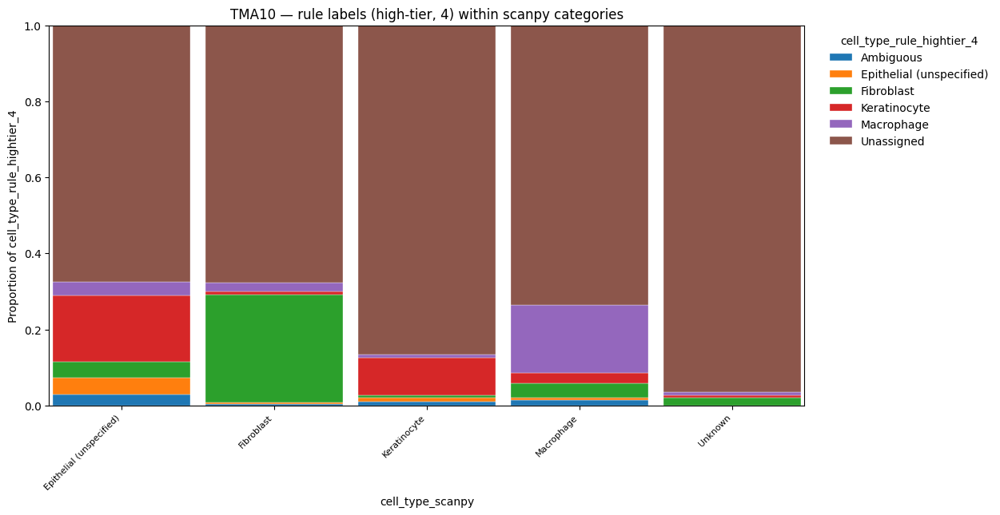

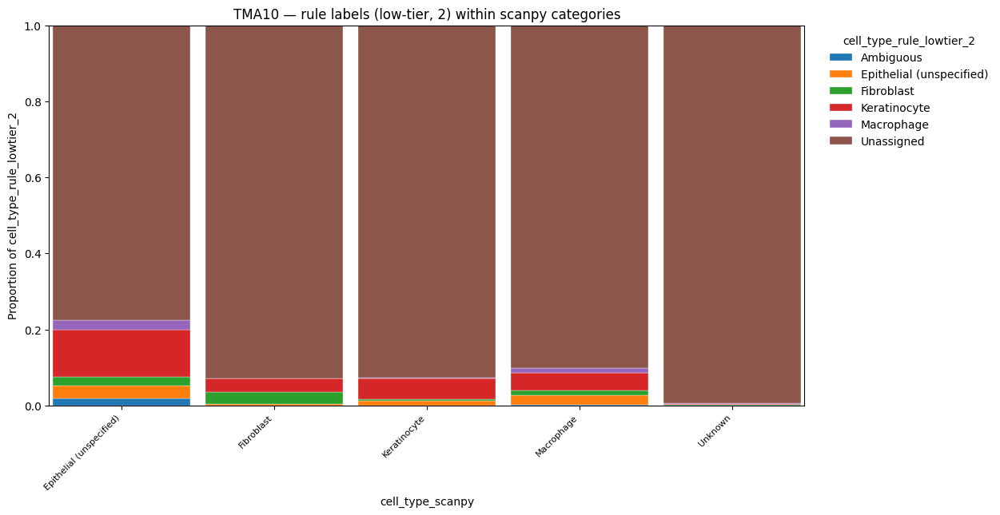

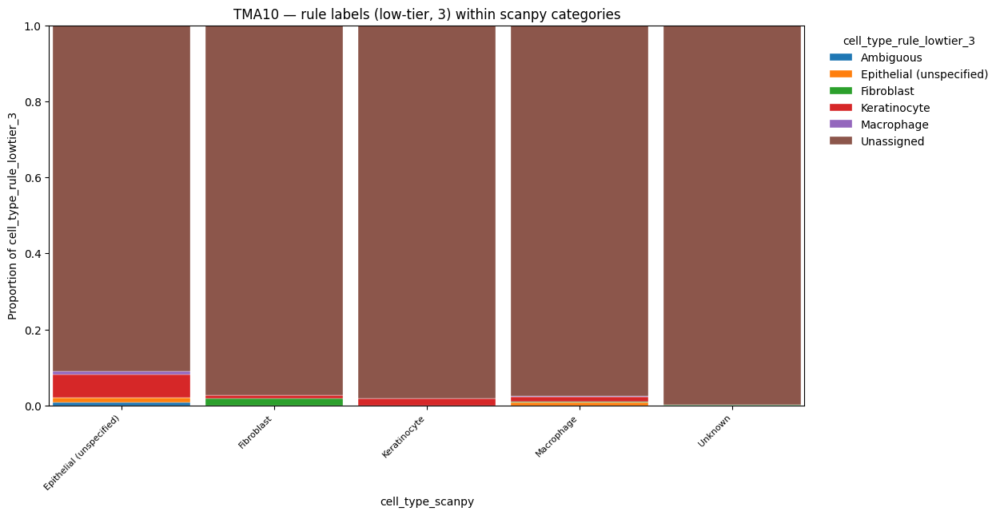

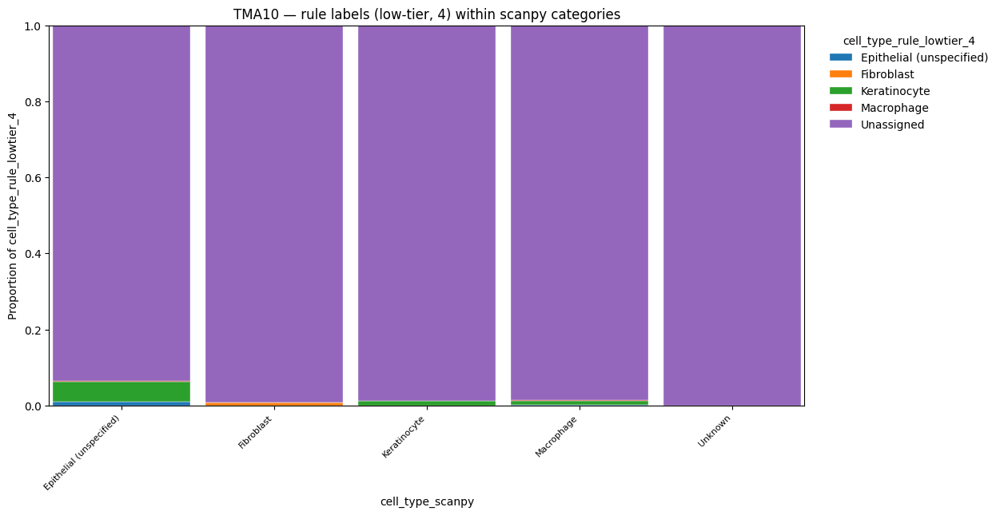

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA10/adata_core_TMA10_final.h5ad

############################################################
# TMA11
############################################################
Loaded TMA11: (3952, 6182)
cell_type_scanpy
Keratinocyte               2035
Inflamed keratinocyte       829
Fibroblast                  537
Macrophage                  257
Endothelial or pericyte     151
Unknown                     143
Name: count, dtype: int64
  Rule-based comparison using: ['Endothelial', 'Fibroblast', 'Inflamed keratinocyte', 'Keratinocyte', 'Macrophage', 'Pericyte or smooth muscle']


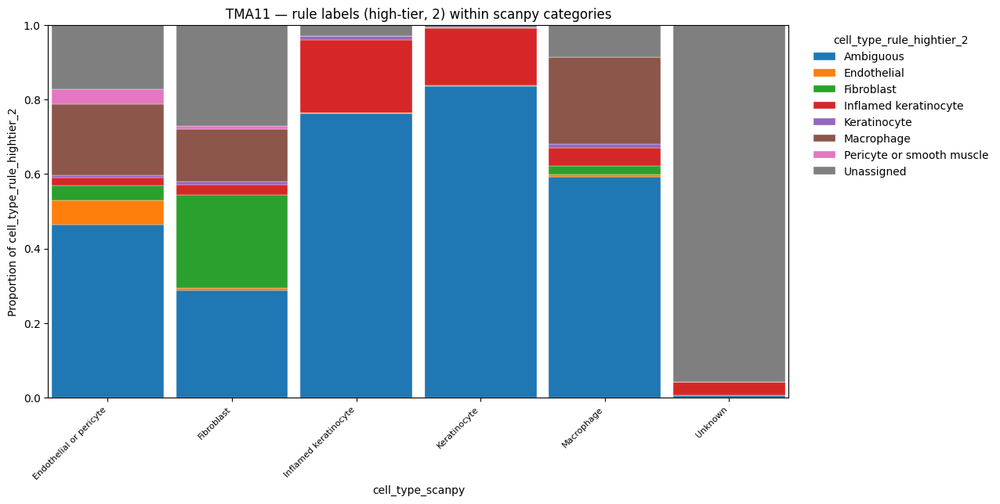

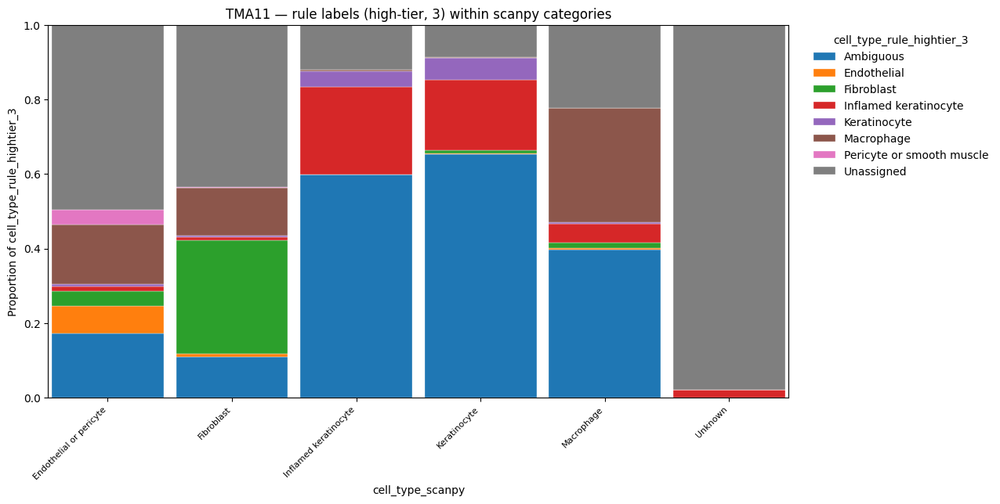

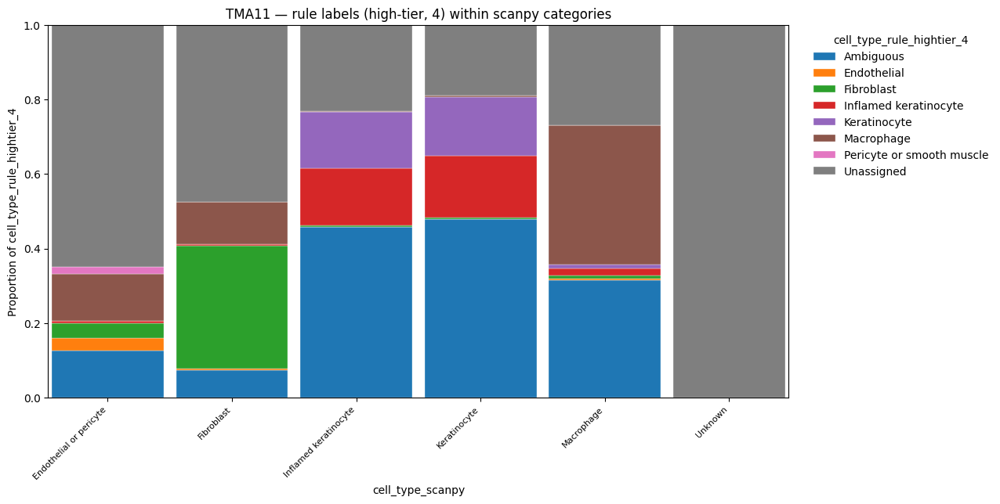

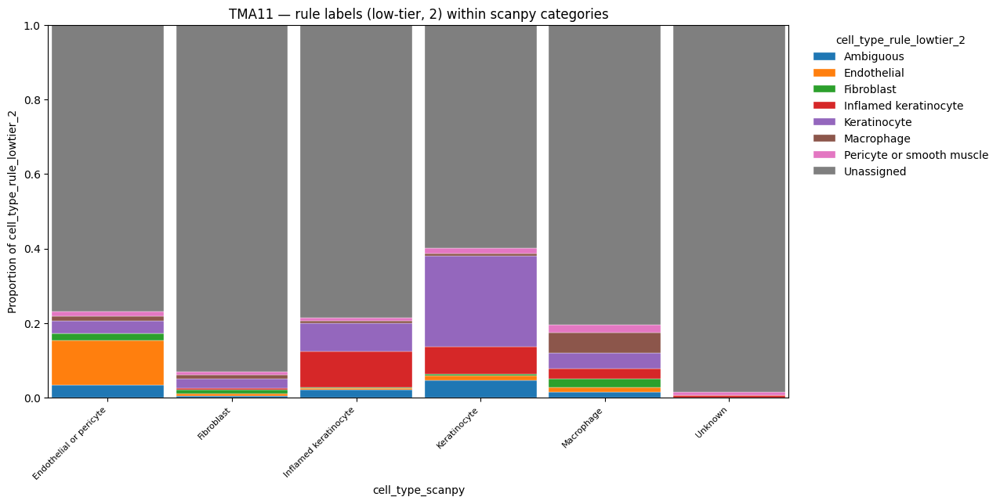

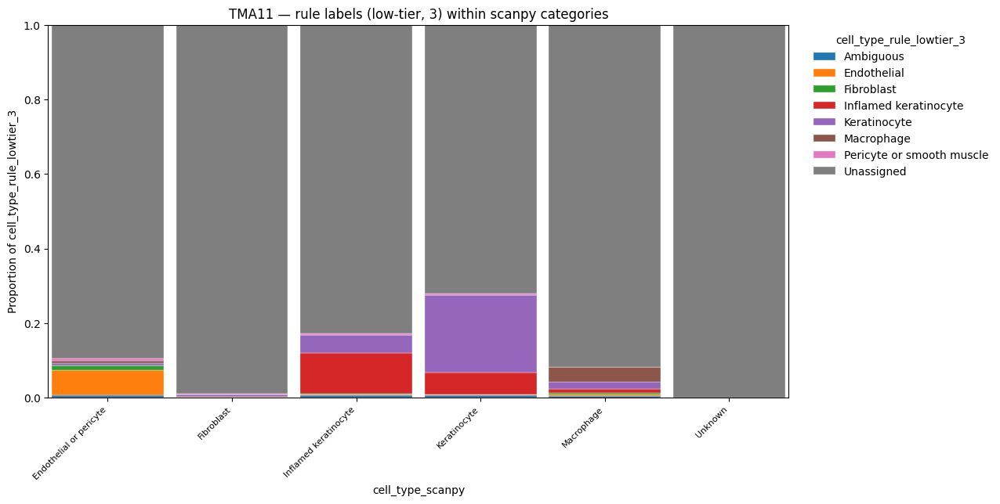

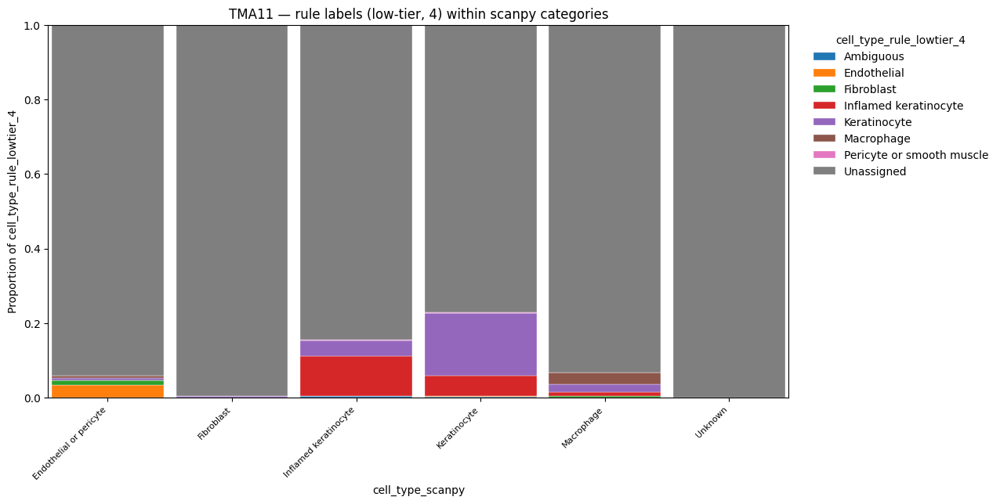

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA11/adata_core_TMA11_final.h5ad

############################################################
# TMA12
############################################################
Loaded TMA12: (2525, 6182)
cell_type_scanpy
Keratinocyte                 1034
Unknown                       775
Fibroblast                    443
Macrophage                    228
Pericyte or smooth muscle      45
Name: count, dtype: int64
  Rule-based comparison using: ['Fibroblast', 'Keratinocyte', 'Macrophage', 'Pericyte or smooth muscle']


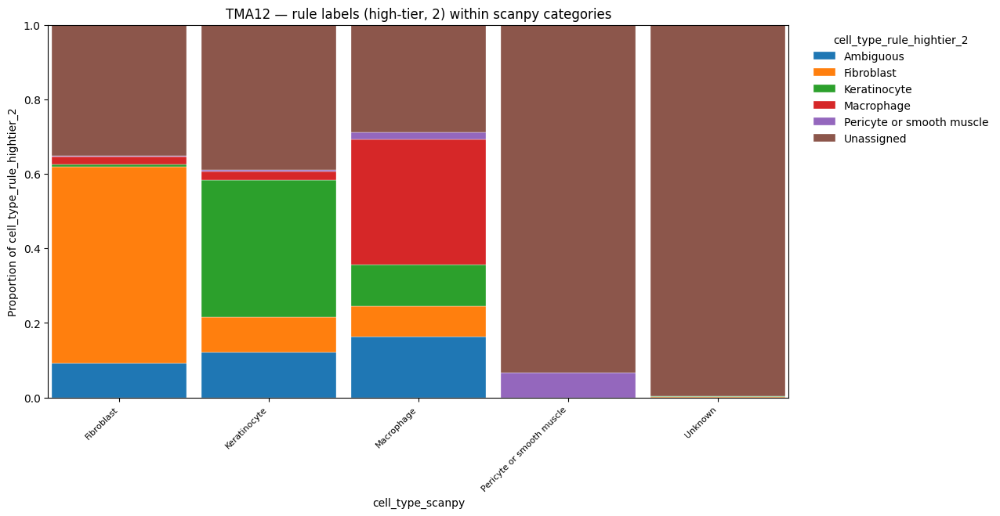

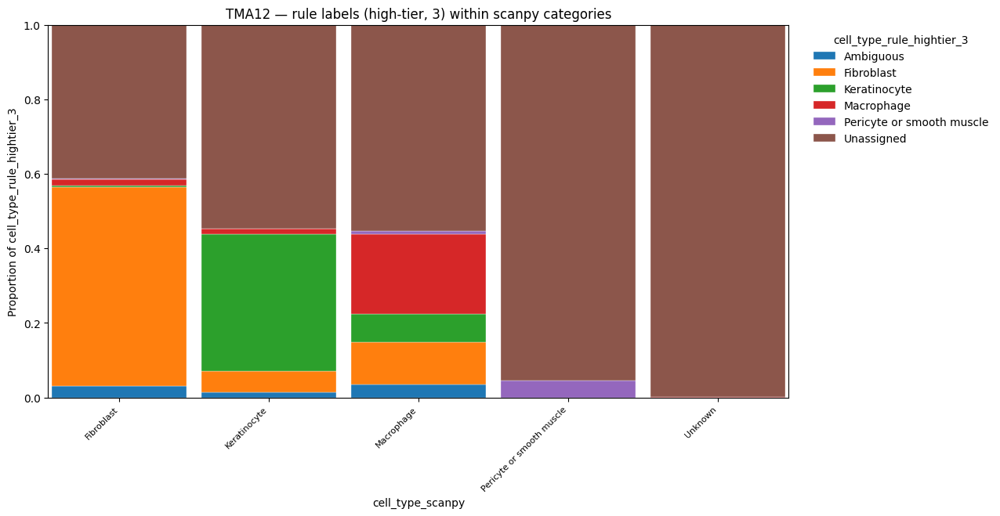

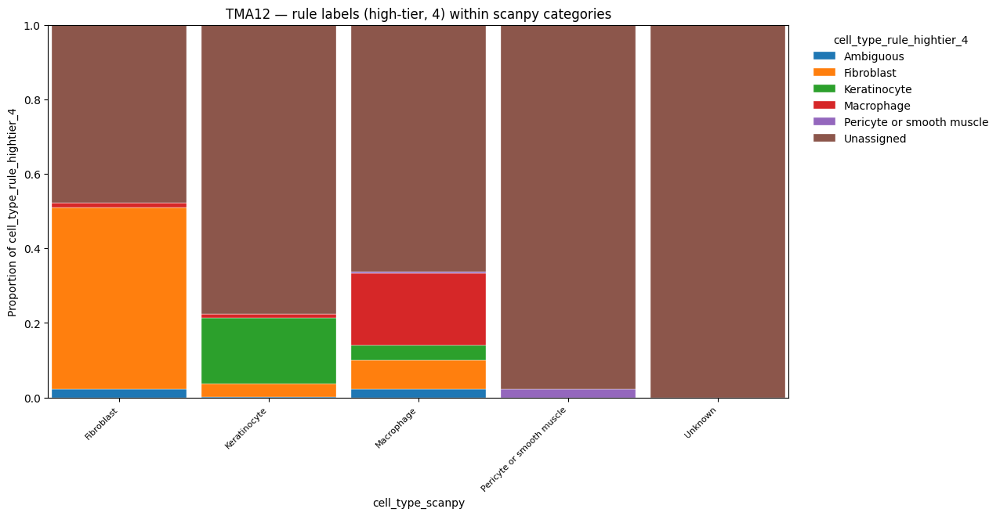

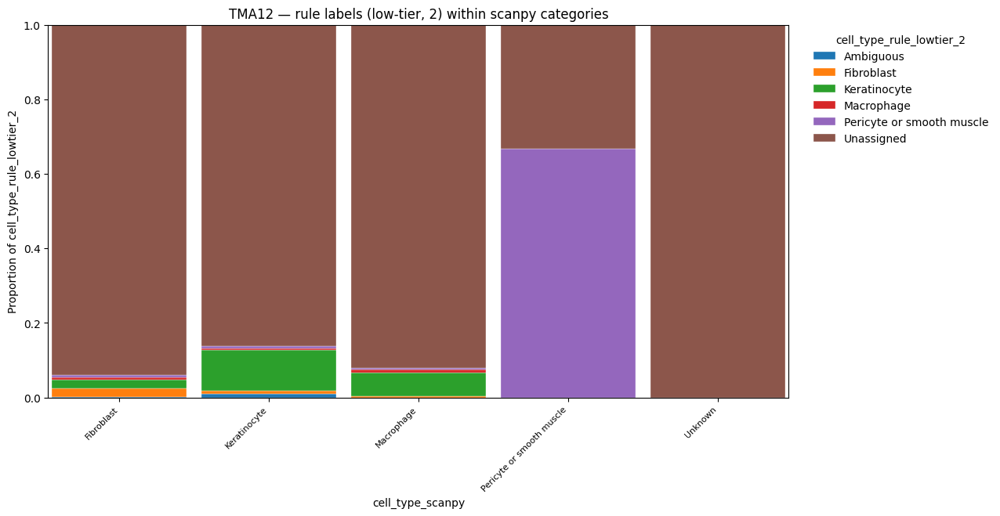

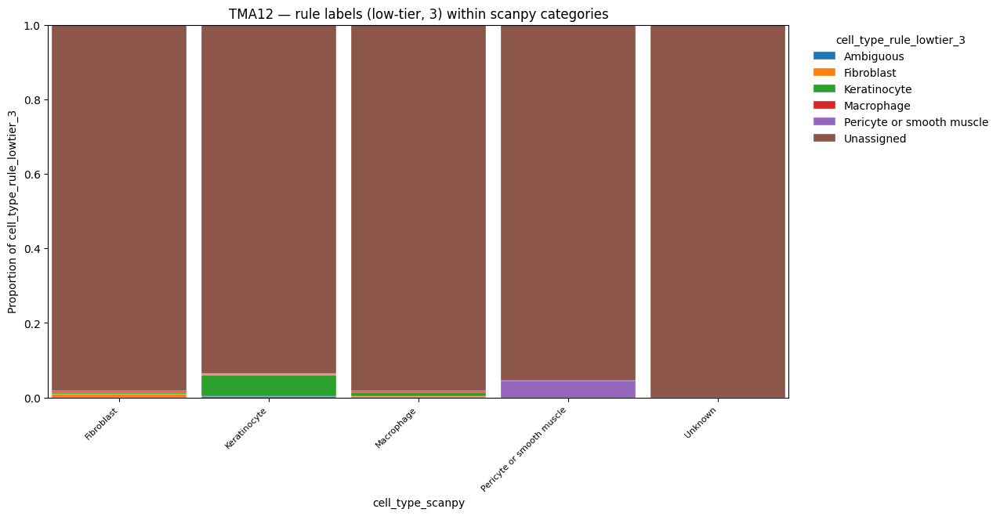

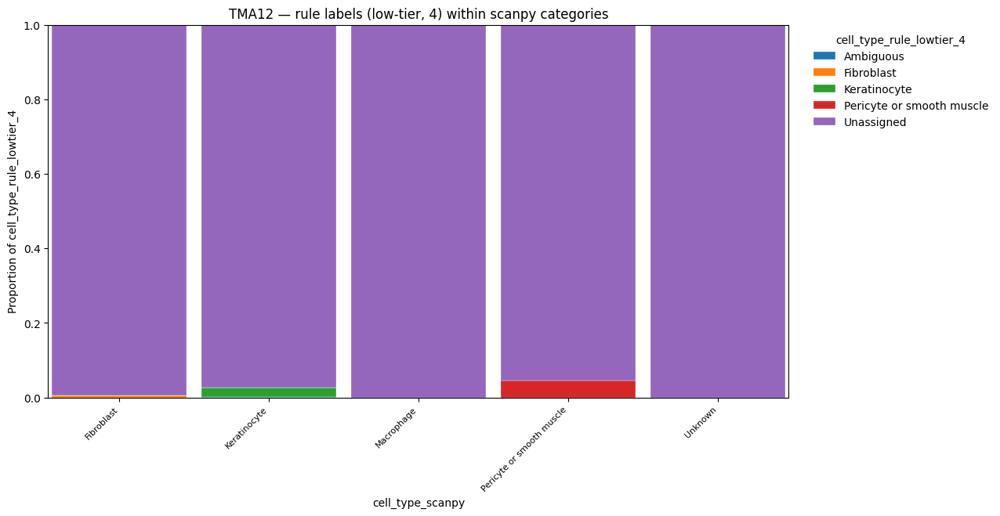

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA12/adata_core_TMA12_final.h5ad

############################################################
# TMA13
############################################################
Loaded TMA13: (4881, 6182)
cell_type_scanpy
Inflamed keratinocyte        1439
Fibroblast                   1003
Keratinocyte                  602
Unknown                       567
Macrophage and fibroblast     530
Macrophage                    506
Pericyte or smooth muscle     234
Name: count, dtype: int64
  Rule-based comparison using: ['Fibroblast', 'Inflamed keratinocyte', 'Keratinocyte', 'Macrophage', 'Pericyte or smooth muscle']


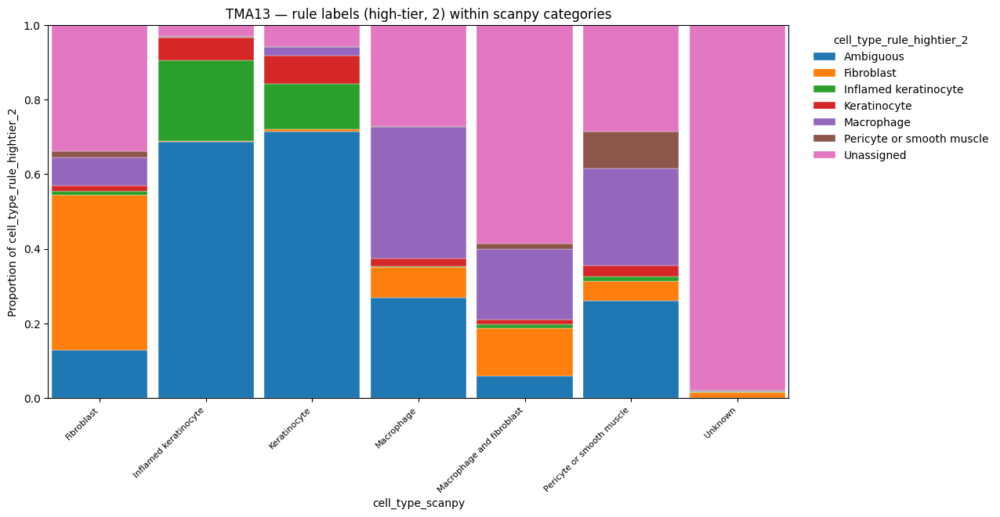

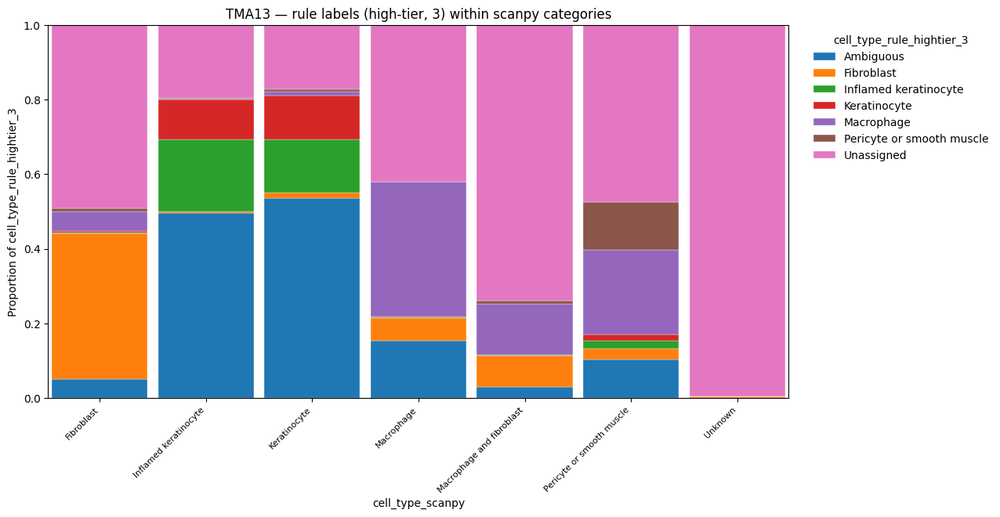

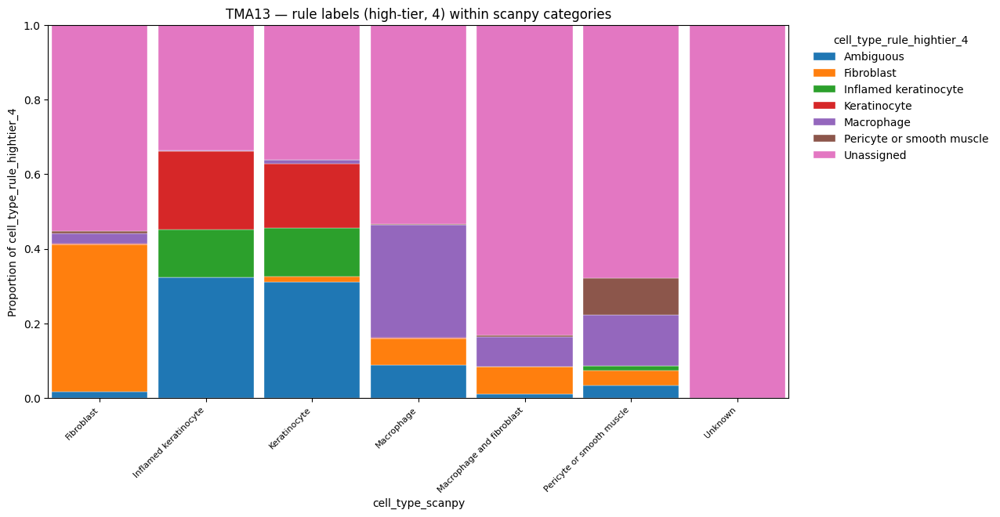

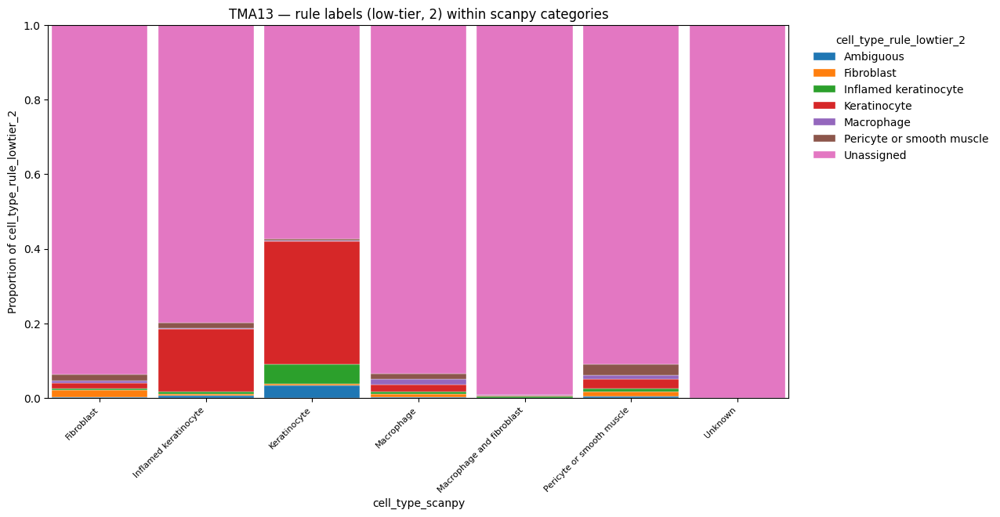

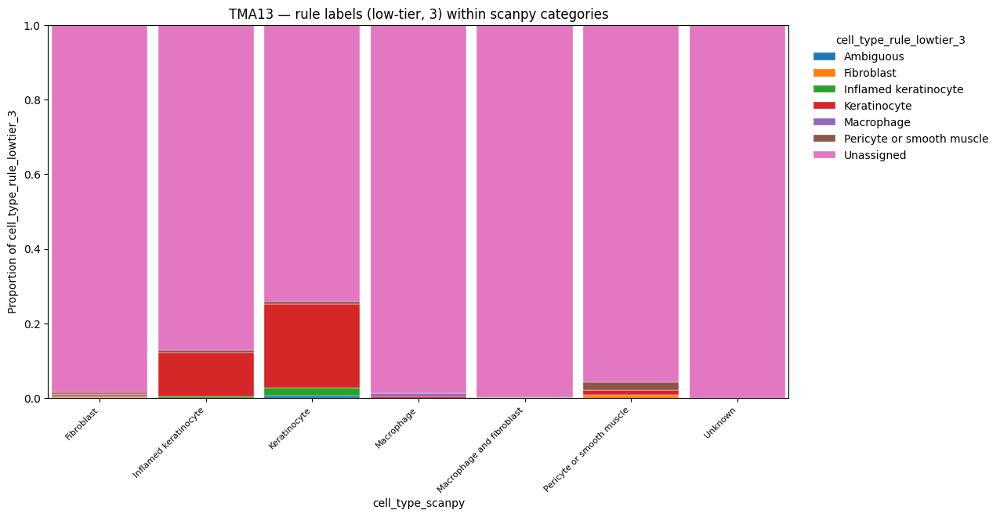

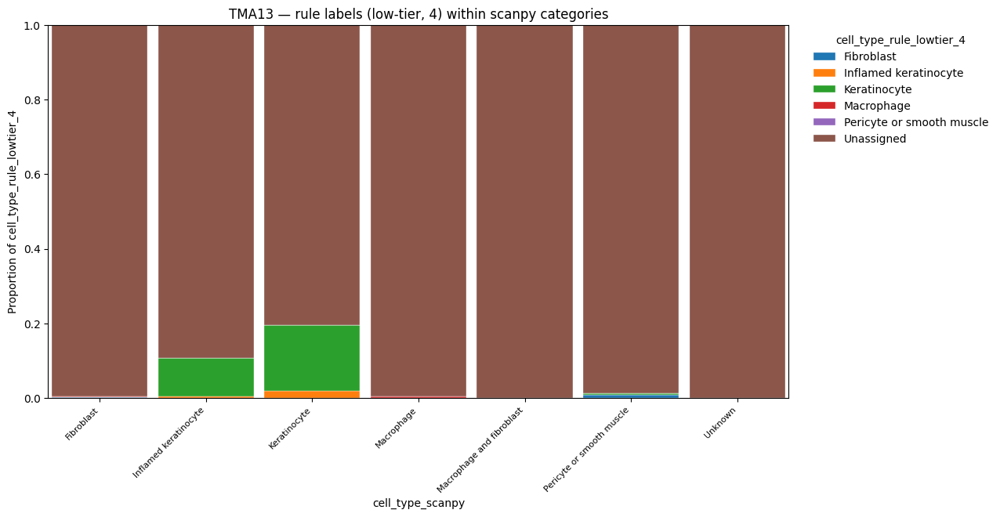

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA13/adata_core_TMA13_final.h5ad

############################################################
# TMA14
############################################################
Loaded TMA14: (2766, 6182)
cell_type_scanpy
Unknown                     1721
Epithelial (unspecified)     913
Fibroblast                   132
Name: count, dtype: int64
  Rule-based comparison using: ['Epithelial (unspecified)', 'Fibroblast']


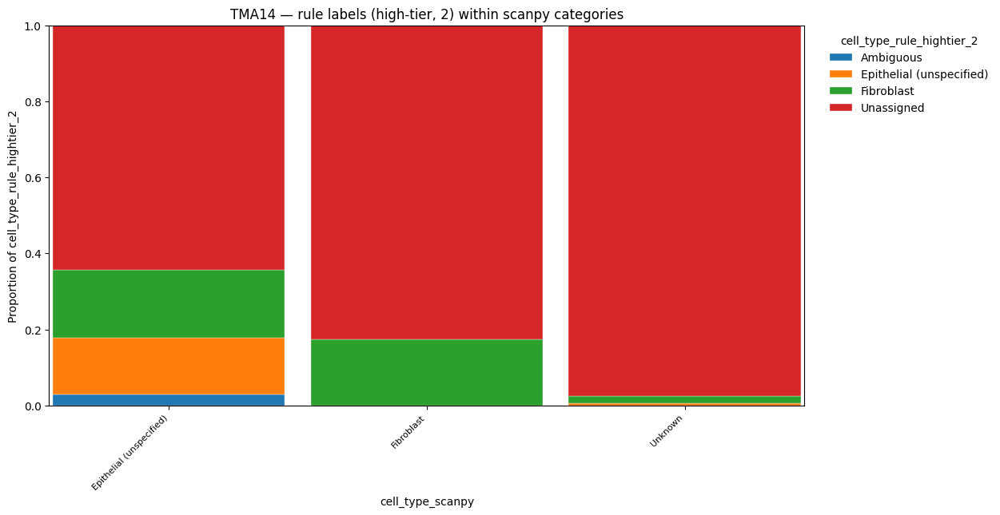

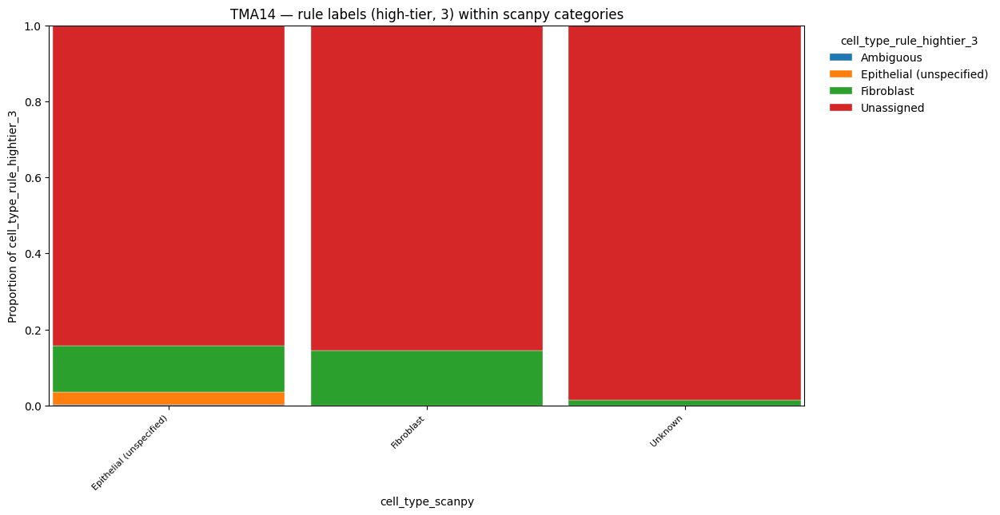

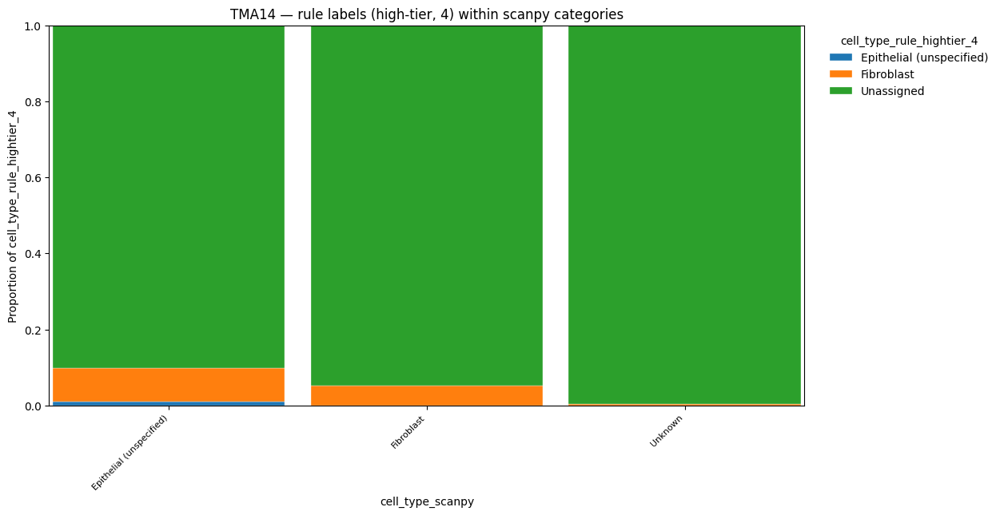

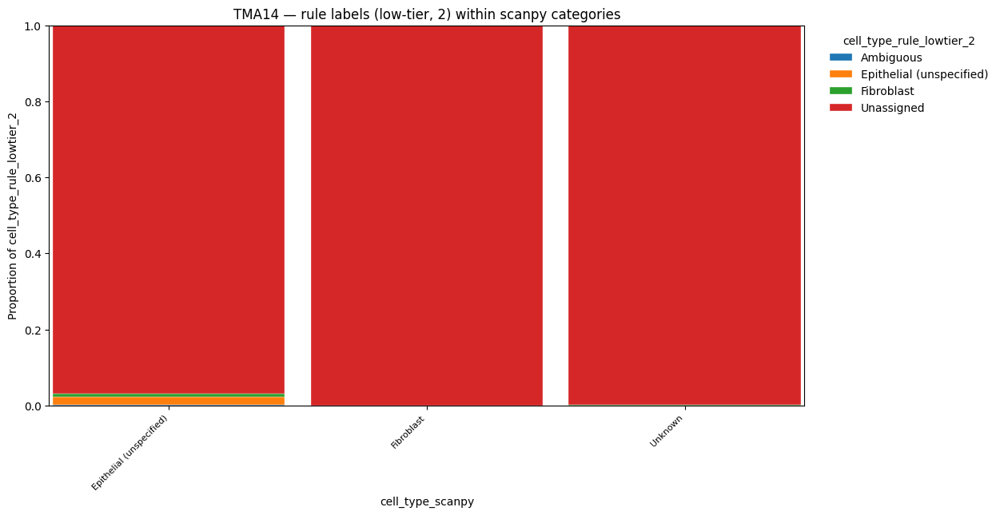

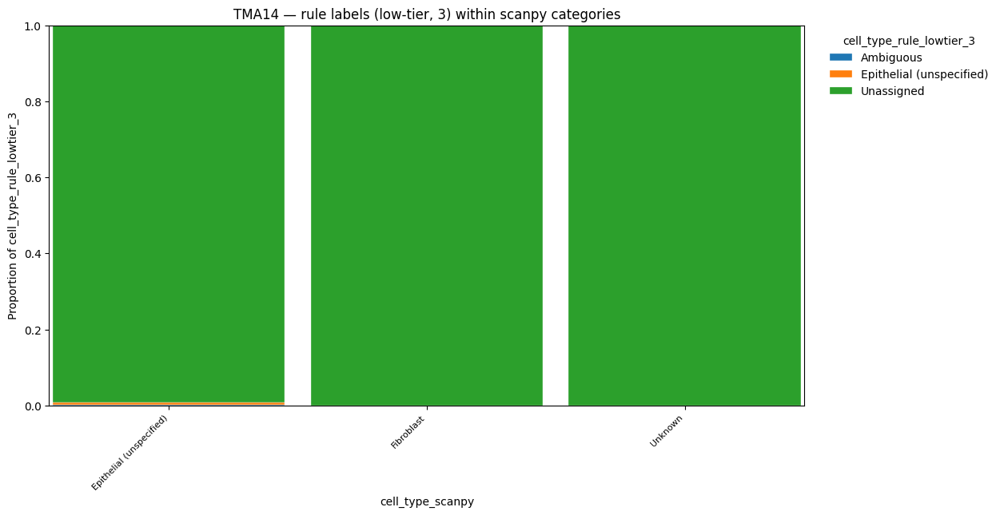

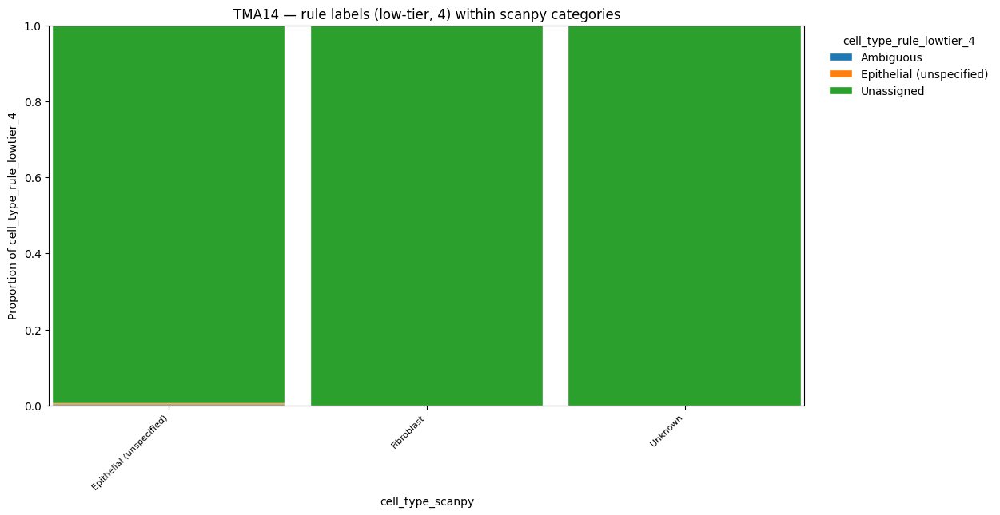

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA14/adata_core_TMA14_final.h5ad

############################################################
# TMA15
############################################################
Loaded TMA15: (2761, 6182)
cell_type_scanpy
Keratinocyte                1094
Unknown                      493
Epithelial (unspecified)     430
Fibroblast                   328
Inflamed keratinocyte        278
Macrophage                   138
Name: count, dtype: int64
  Rule-based comparison using: ['Epithelial (unspecified)', 'Fibroblast', 'Inflamed keratinocyte', 'Keratinocyte', 'Macrophage']


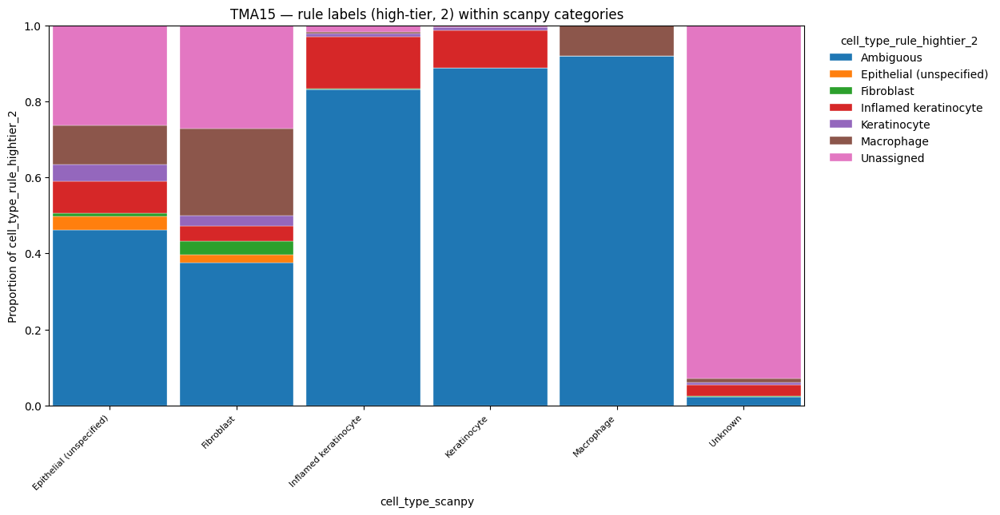

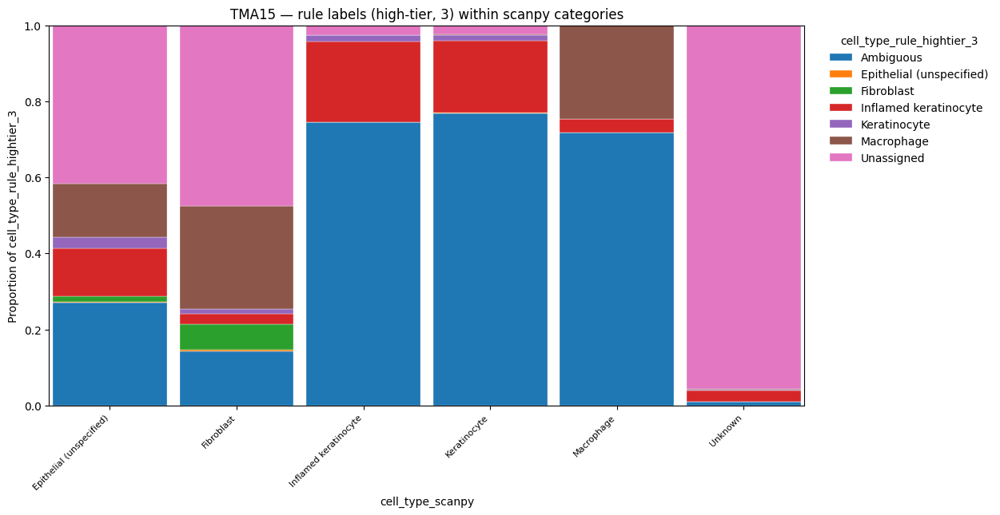

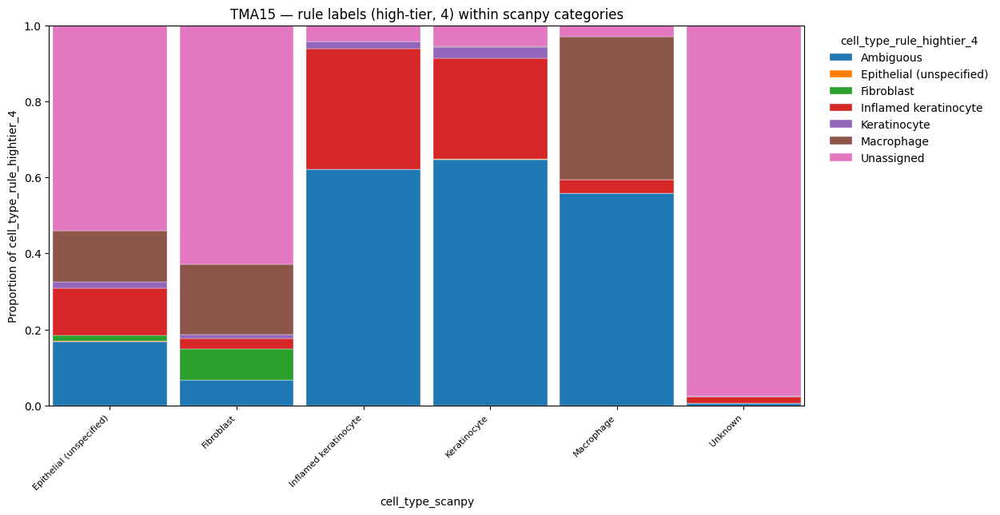

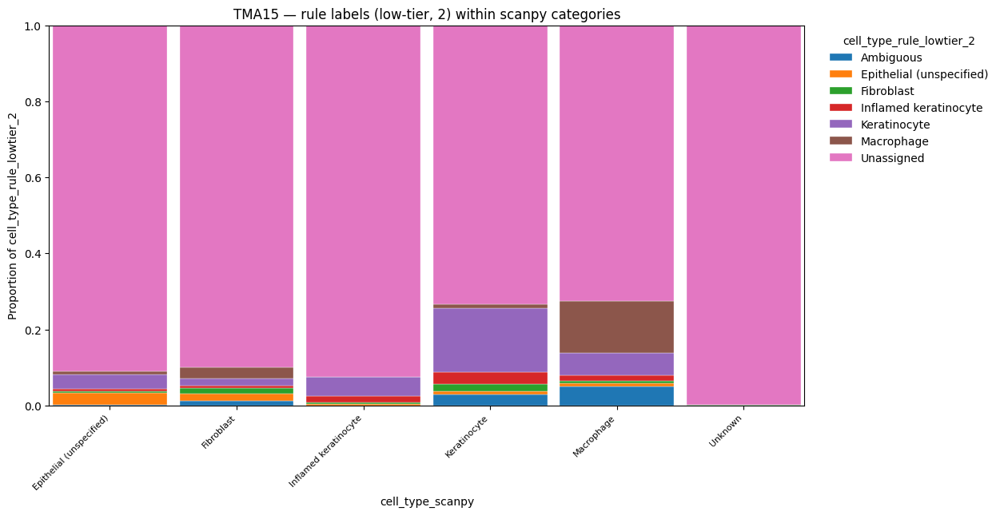

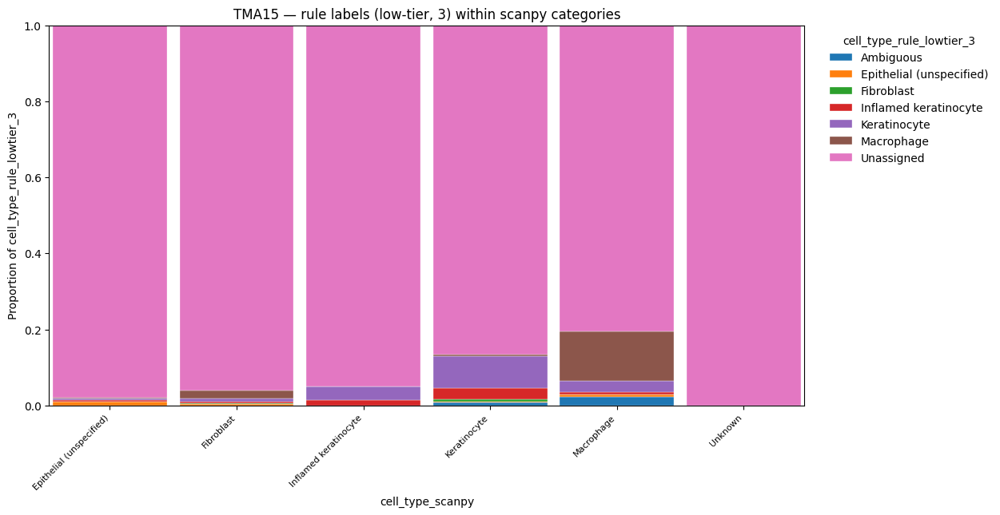

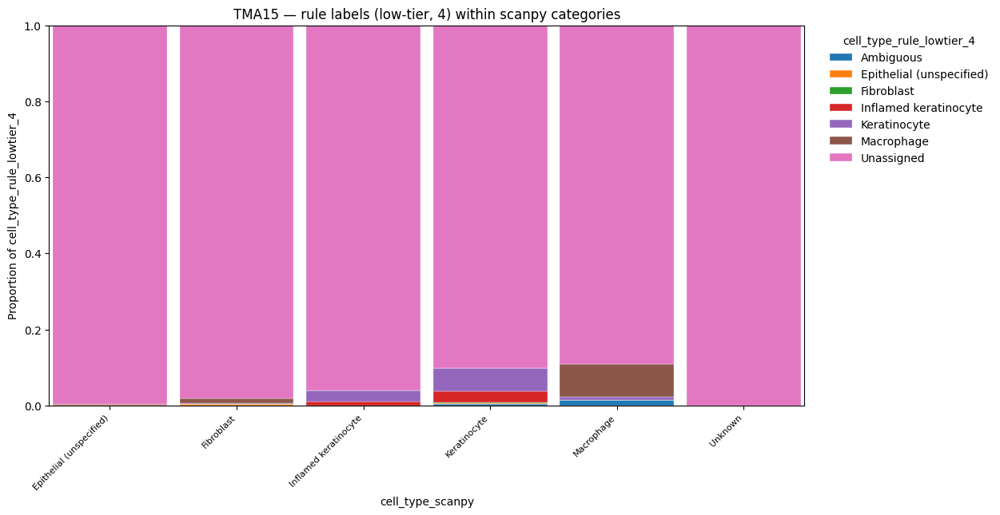

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA15/adata_core_TMA15_final.h5ad

############################################################
# TMA16
############################################################
Loaded TMA16: (6821, 6182)
cell_type_scanpy
Hepatocyte-like                   3577
Unknown                           1185
Fibroblast                         481
Macrophage (Kupffer)               469
Biliary epithelial                 461
Endothelial (liver sinusoidal)     402
Neutrophil                         133
Lymphocyte                         113
Name: count, dtype: int64
  Rule-based comparison using: ['Biliary epithelial', 'Endothelial (liver sinusoidal)', 'Fibroblast', 'Hepatocyte-like', 'Lymphocyte', 'Macrophage (Kupffer)', 'Neutrophil']


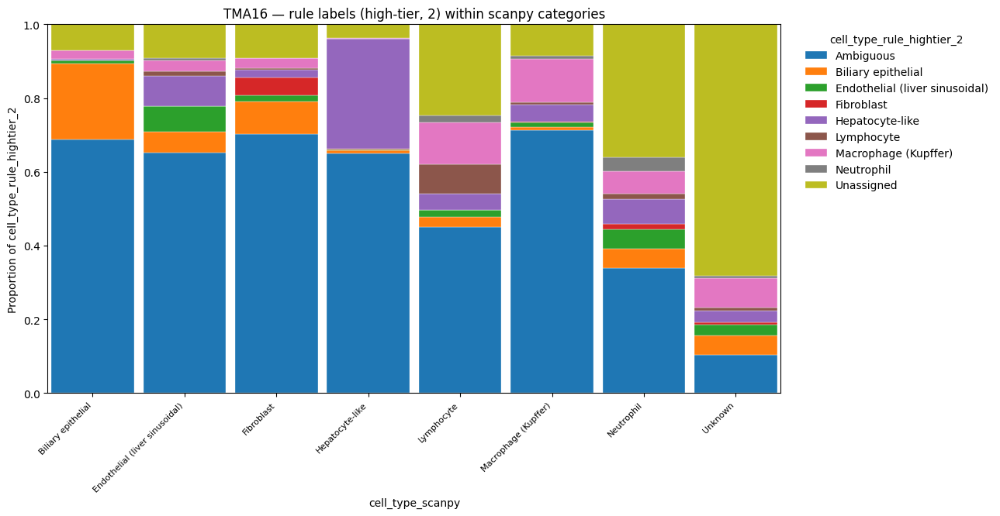

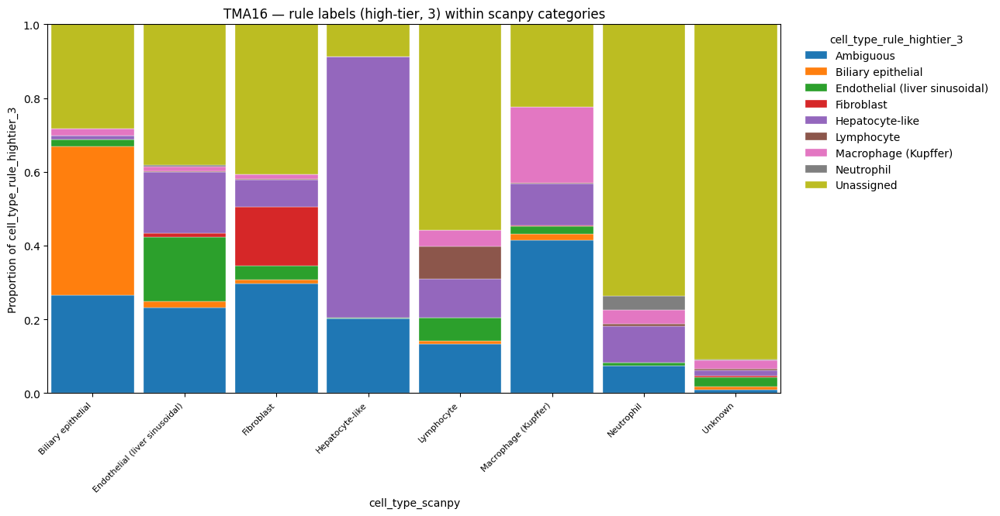

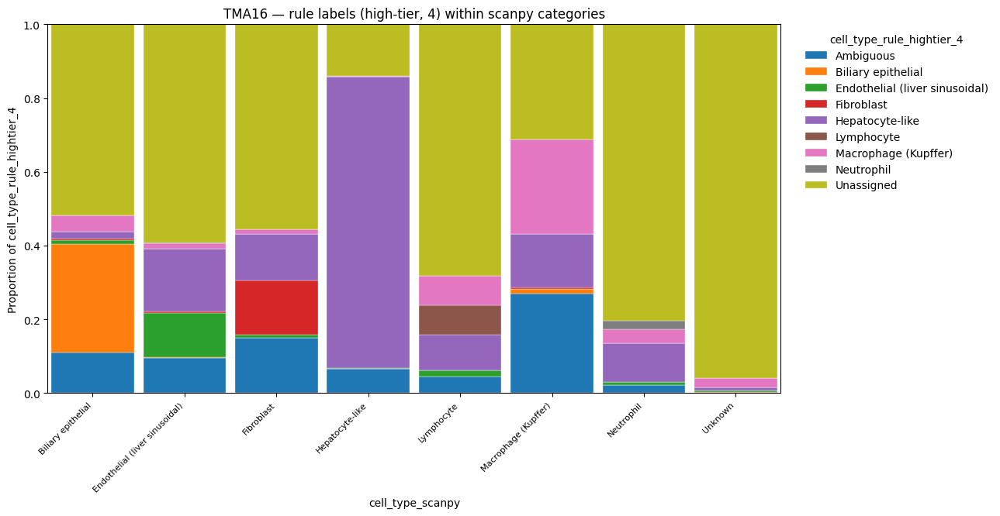

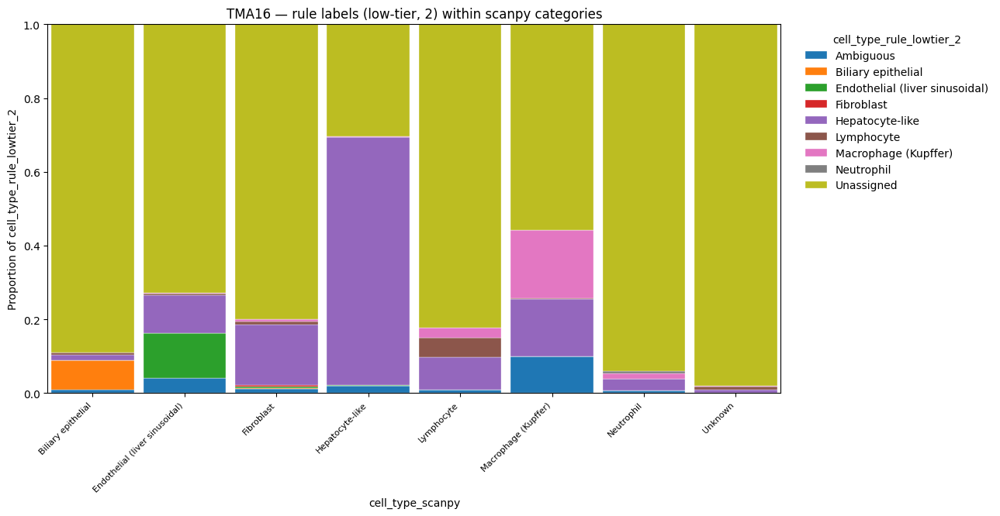

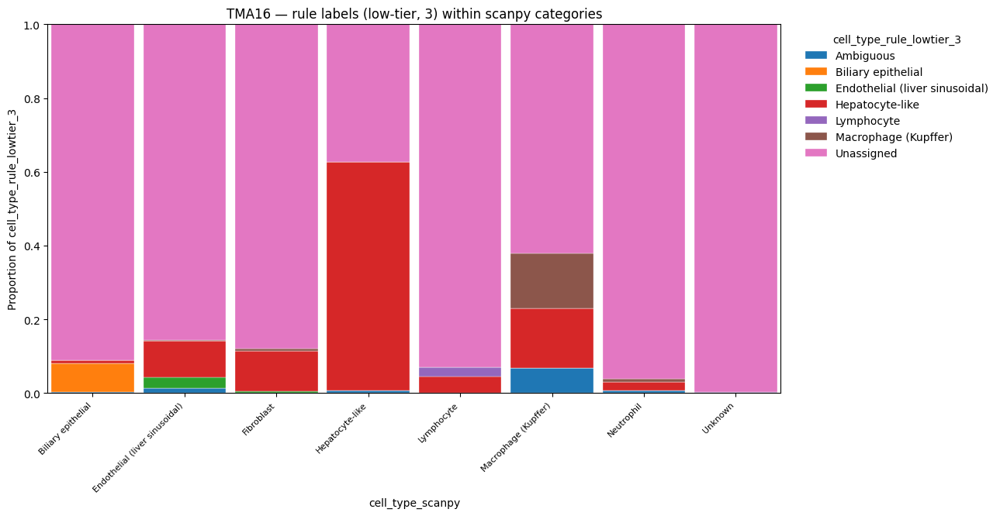

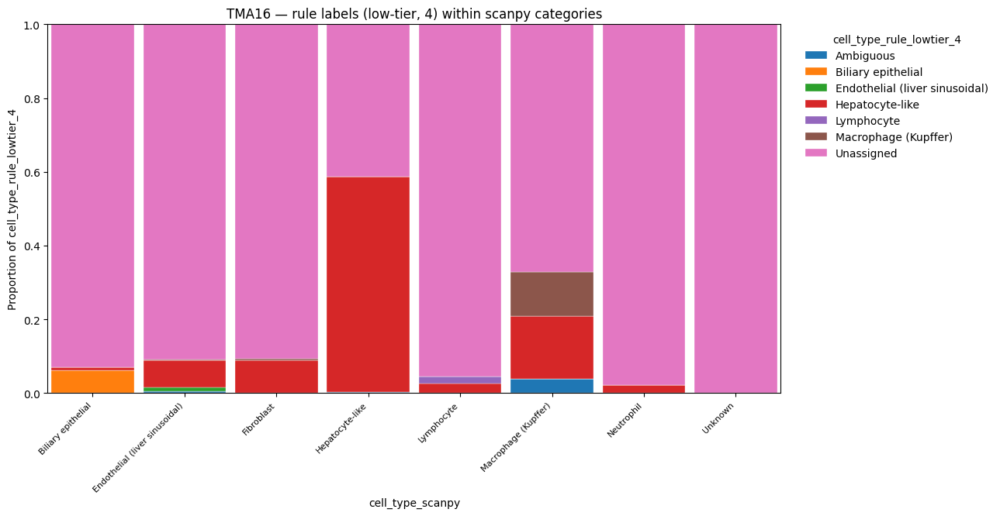

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA16/adata_core_TMA16_final.h5ad

############################################################
# TMA17
############################################################
Loaded TMA17: (6148, 6182)
cell_type_scanpy
Eccrine gland                 2144
Eccrine duct                  1045
Fibroblast                     962
Epithelial (unspecified)       792
Endothelial and macrophage     378
Unknown                        335
Endothelial or pericyte        151
Macrophage                     148
Pericyte                       144
Lymphocyte                      49
Name: count, dtype: int64
  Rule-based comparison using: ['Eccrine duct', 'Eccrine gland', 'Endothelial', 'Epithelial (unspecified)', 'Fibroblast', 'Lymphocyte', 'Macrophage', 'Pericyte or smooth muscle']


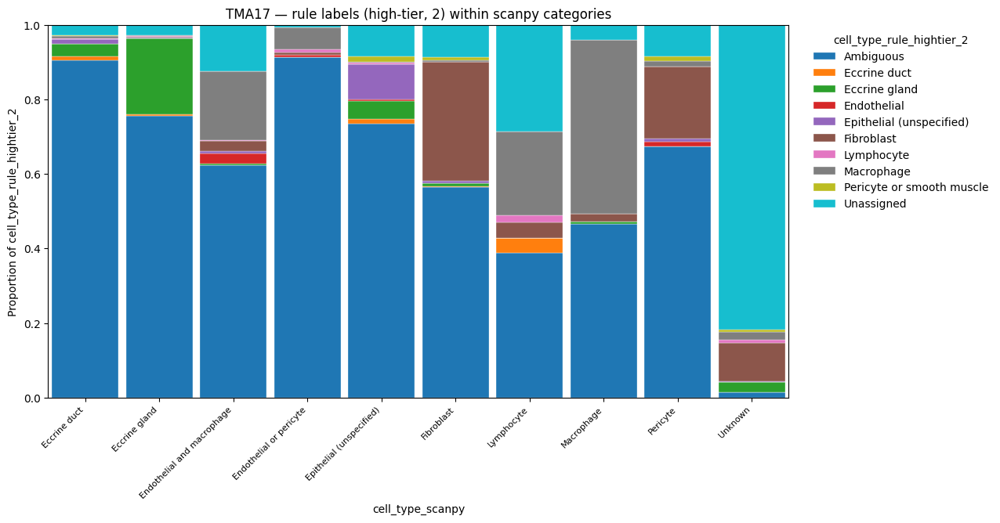

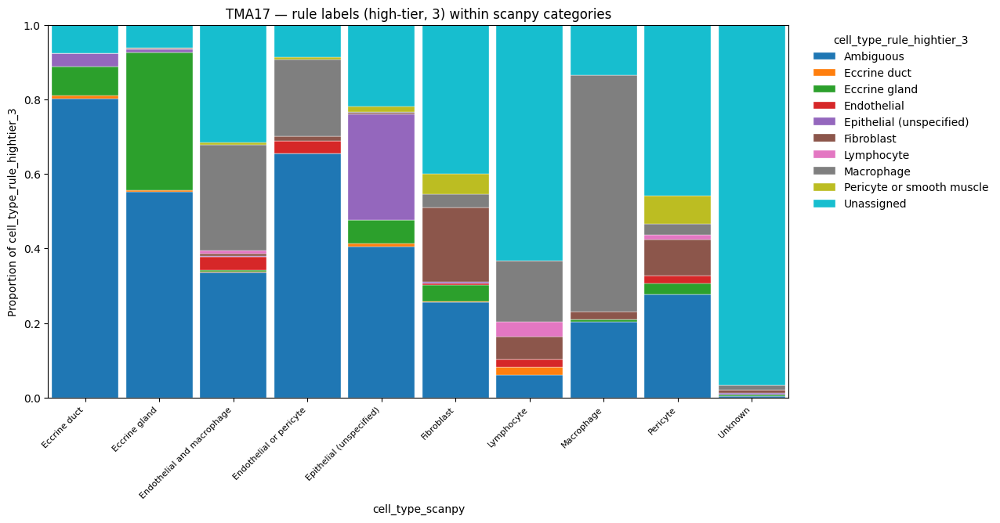

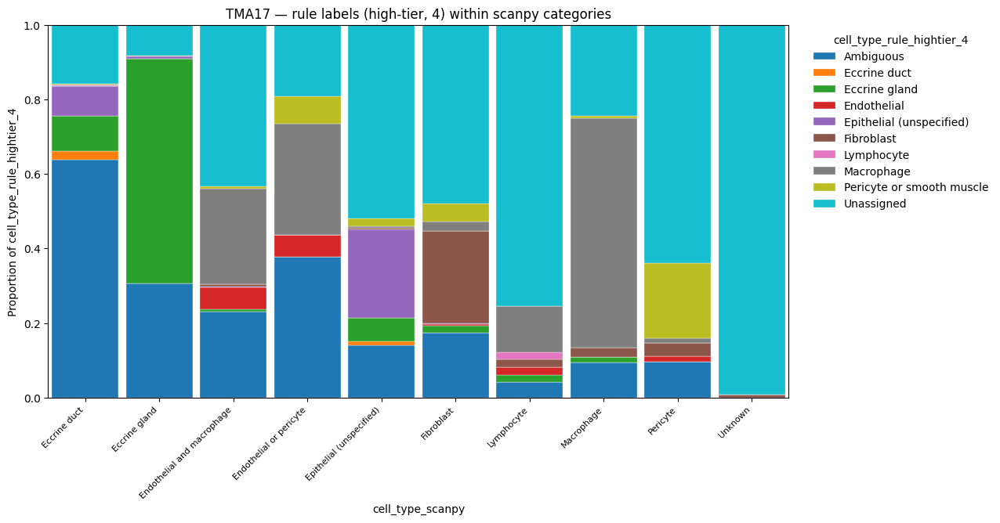

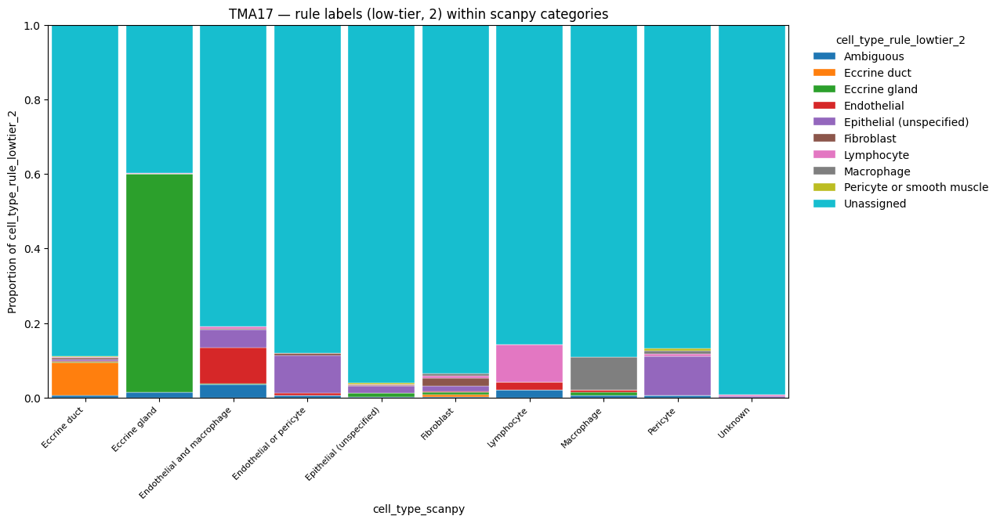

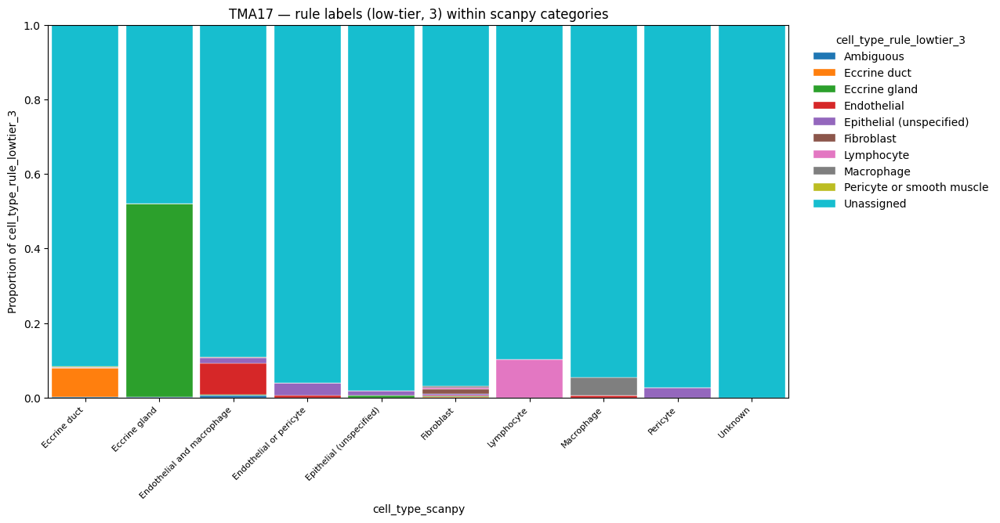

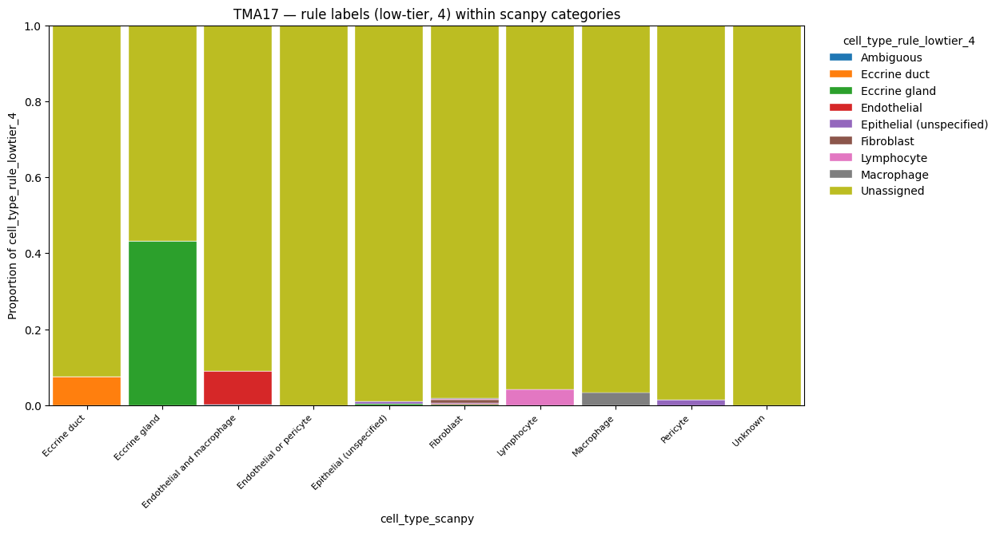

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA17/adata_core_TMA17_final.h5ad

############################################################
# TMA18
############################################################
Loaded TMA18: (2613, 6182)
cell_type_scanpy
Unknown                     1044
Keratinocyte                 811
Epithelial (unspecified)     394
Macrophage                   229
Fibroblast                   135
Name: count, dtype: int64
  Rule-based comparison using: ['Epithelial (unspecified)', 'Fibroblast', 'Keratinocyte', 'Macrophage']


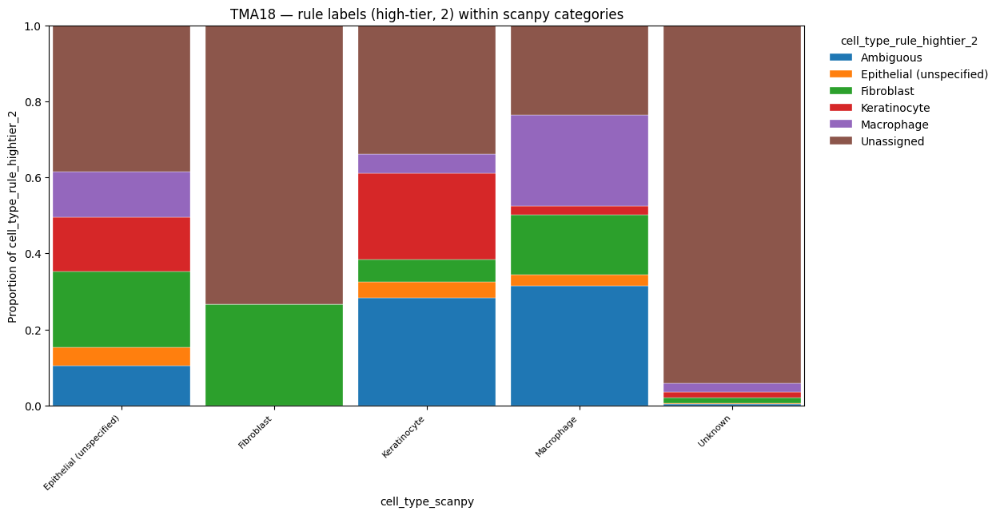

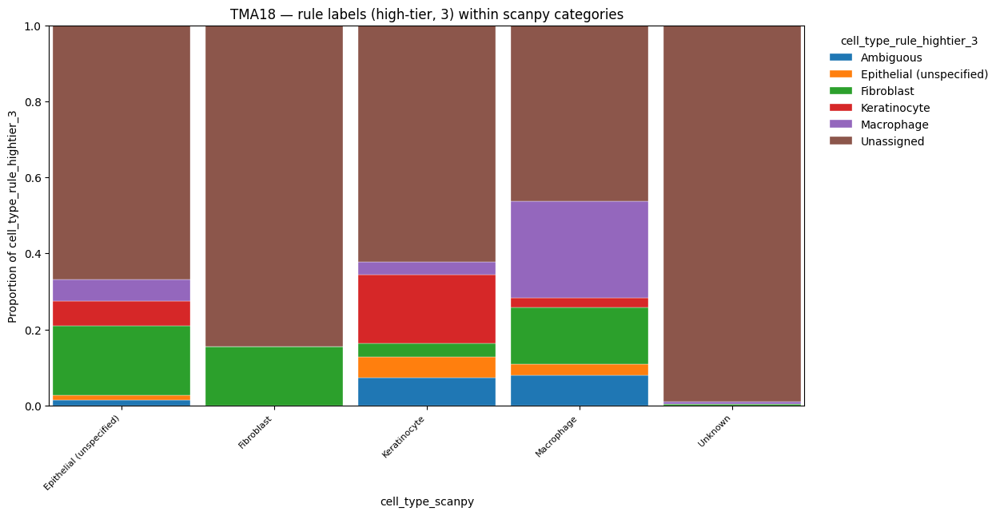

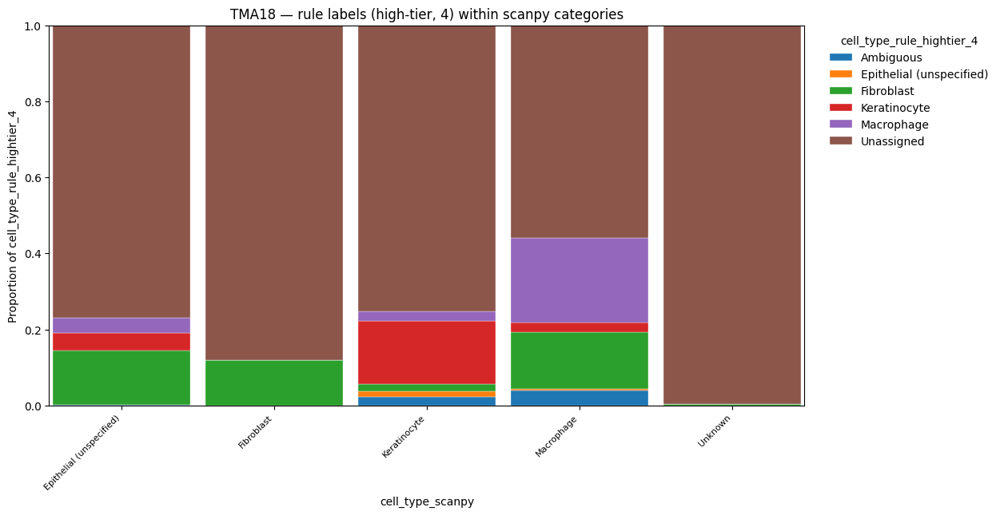

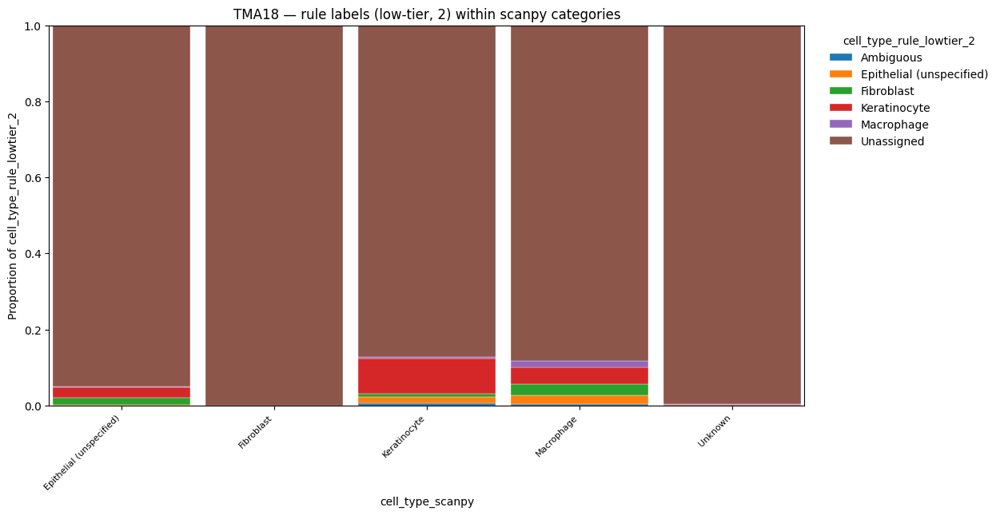

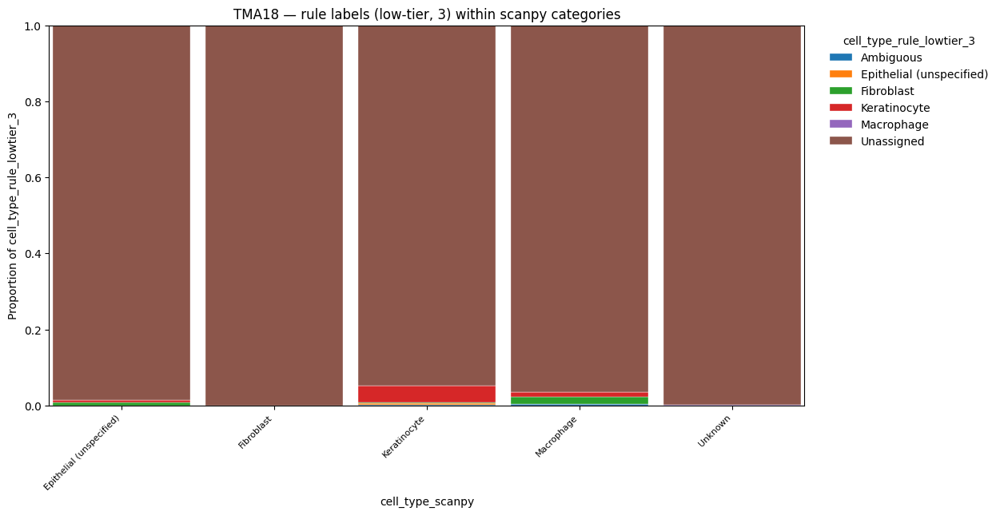

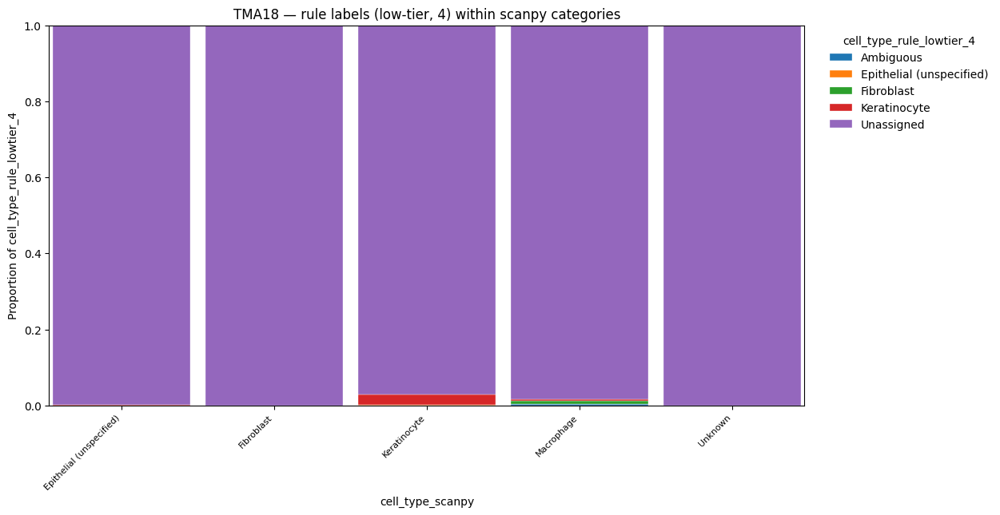

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA18/adata_core_TMA18_final.h5ad

############################################################
# TMA19
############################################################
Loaded TMA19: (3334, 6182)
cell_type_scanpy
Inflamed keratinocyte    1124
Unknown                  1112
Fibroblast                682
Macrophage                364
Keratinocyte               52
Name: count, dtype: int64
  Rule-based comparison using: ['Fibroblast', 'Inflamed keratinocyte', 'Keratinocyte', 'Macrophage']


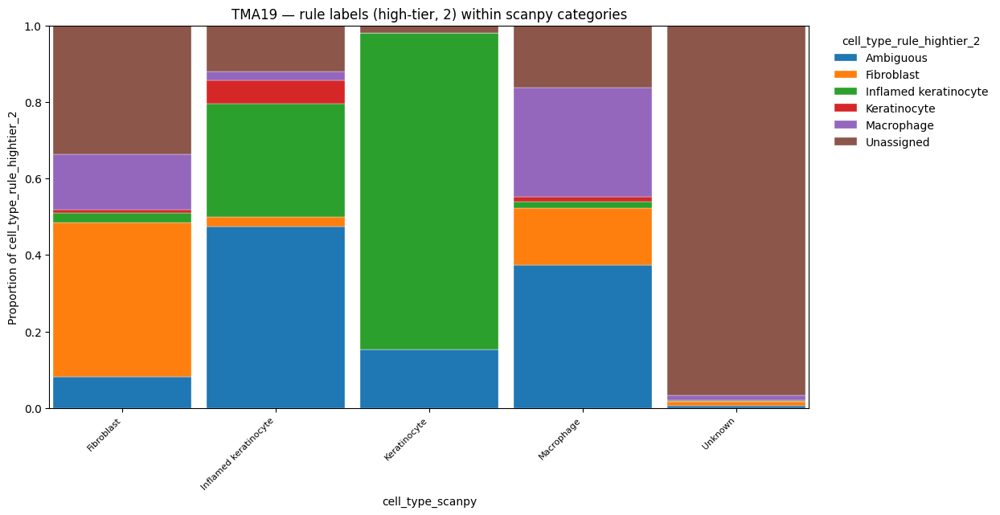

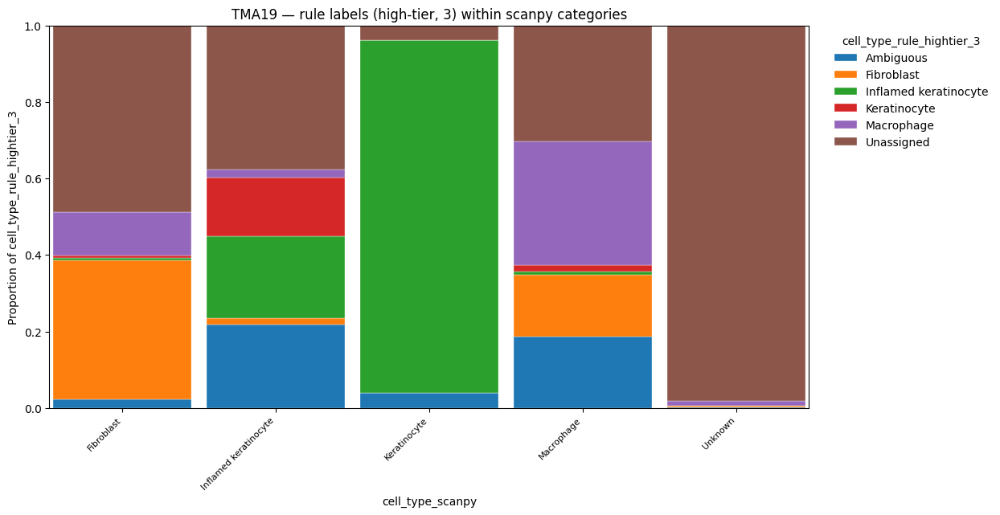

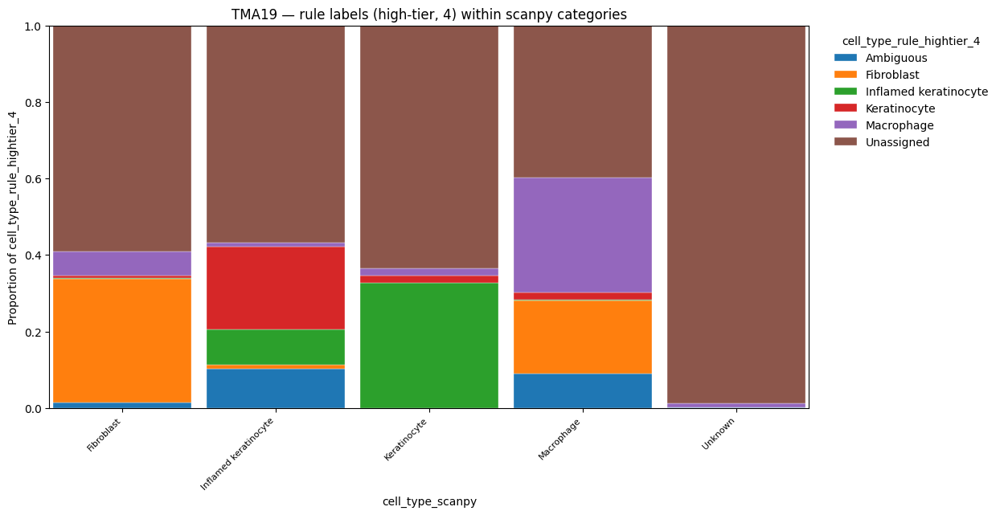

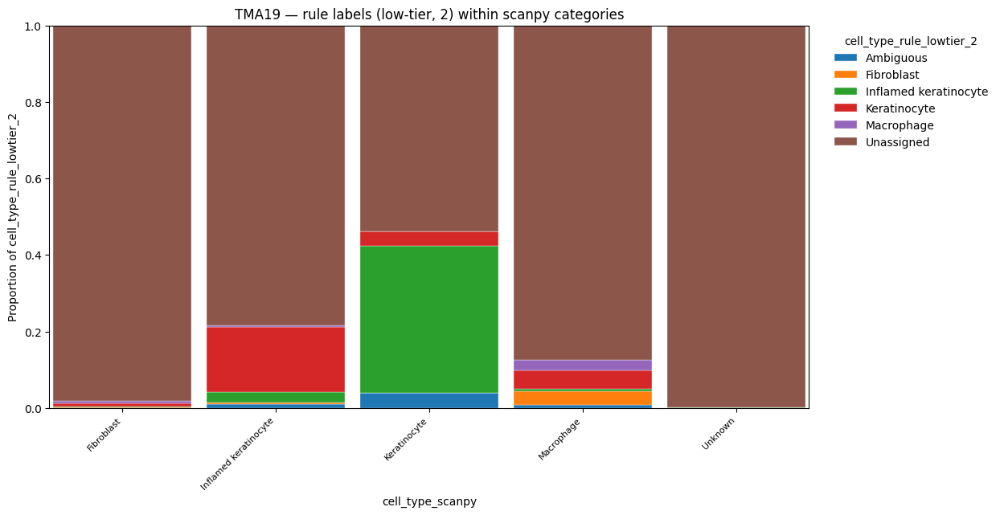

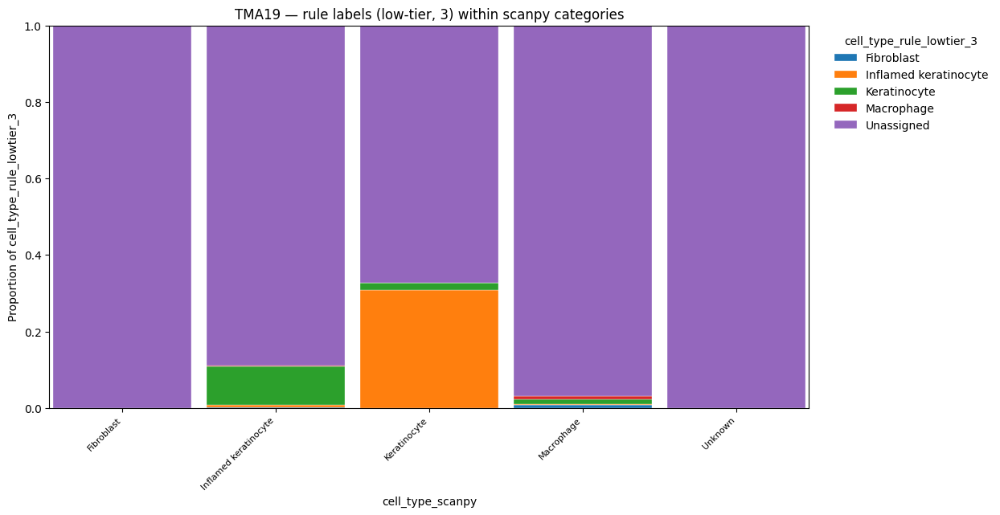

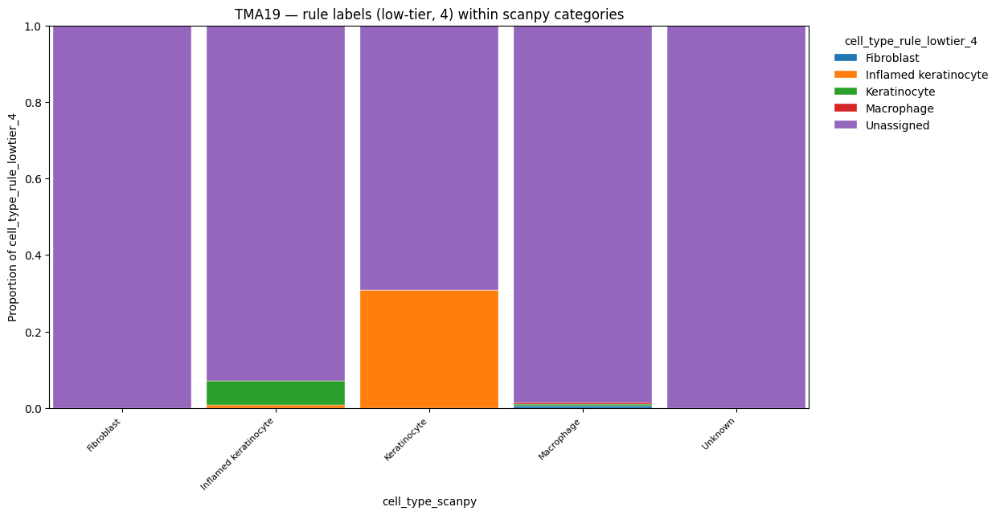

Saved: /scratch/dkz4822/biohackathon2026/tma_runs/TMA19/adata_core_TMA19_final.h5ad

DONE -- 20 core(s) annotated and finalized
core_id  n_cells                                                                                                                                                                                                                           cell_type_counts
      0     2981                                                                                {'Macrophage': 800, 'Fibroblast': 768, 'Inflamed keratinocyte': 600, 'Unknown': 406, 'Pericyte or smooth muscle': 244, 'Endothelial': 95, 'Lymphocyte': 68}
      1     3358                                                                                           {'Fibroblast': 867, 'Unknown': 845, 'Keratinocyte': 553, 'Pericyte or smooth muscle': 399, 'Macrophage': 378, 'Endothelial and macrophage': 316}
      2     5228                                                           {'Epithelial (unspecified)': 2063, 'Unkno

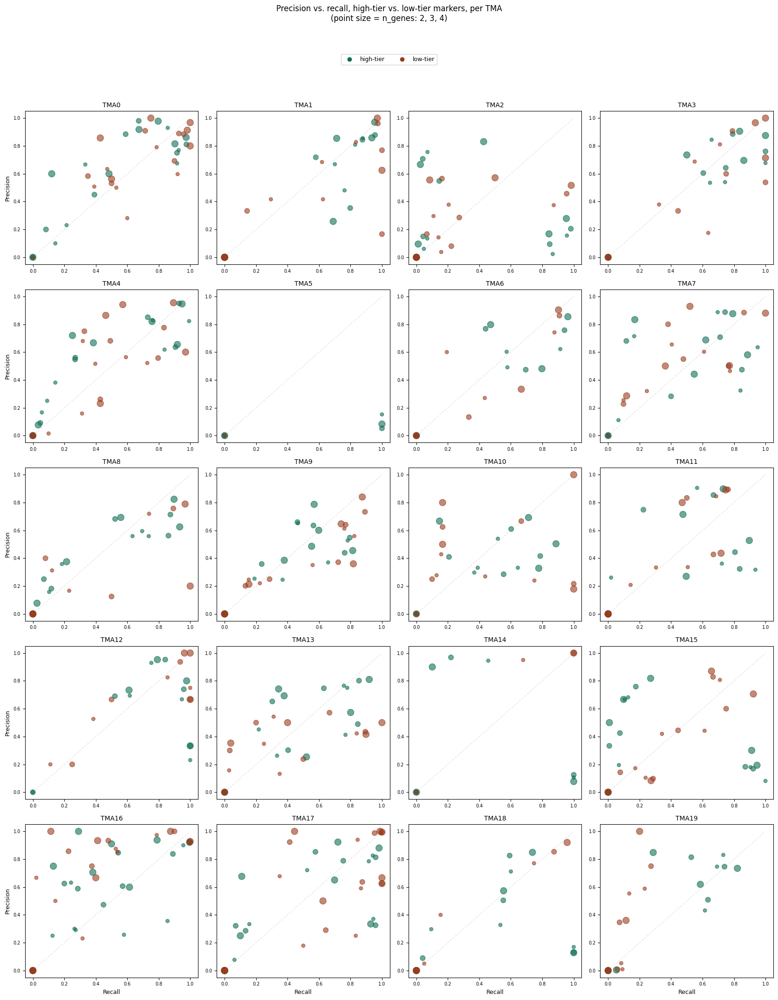

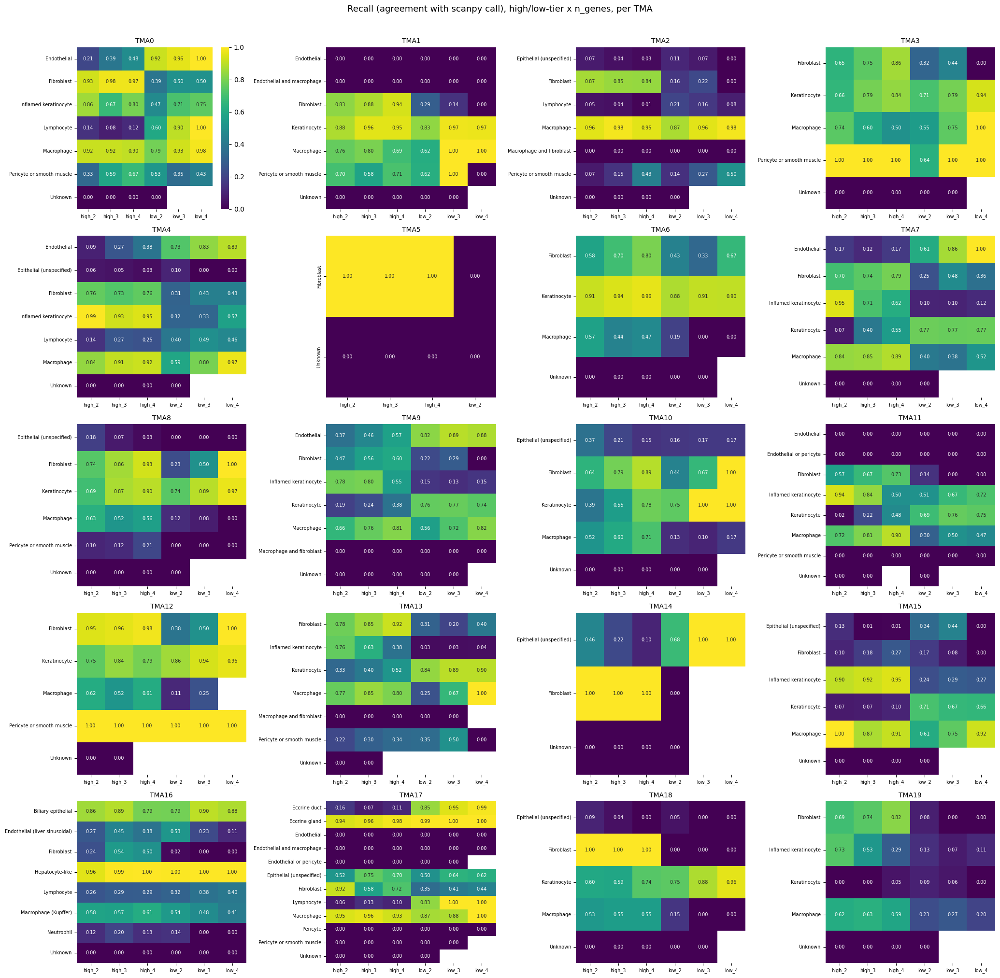


Saved summary figures and metrics to: /scratch/dkz4822/biohackathon2026/tma_runs
  - precision_recall_f1_all_cores_tiered.csv
  - precision_recall_scatter_all_TMAs_tiered.png
  - recall_heatmap_all_TMAs_tiered.png
  - per-core individual plots in TMA<id>/tier_plots/


In [7]:
# ============================================================
# PART 2 (BATCH) — annotate, tiered rule-based compare, summarize
# ============================================================
# All 20 TMA cores annotated below from their marker tables.
# For each core, the rule-based comparison now runs BOTH tiers:
#   - high-tier: best-detected N genes per cell type
#   - low-tier:  worst-detected N genes per cell type
# at N = 2, 3, 4 genes each -- 6 combinations per core, each
# producing its own cell_type_rule_{tier}tier_{n} column, plus
# a UMAP, spatial plot, marker dotplot, crosstabs, and a
# custom_barplot, same as the original single-TMA exploration.
#
# With 20 cores x 6 combinations = 120 plots, everything is saved
# to disk per core rather than displayed inline (set
# GENERATE_PER_METHOD_PLOTS = False to skip these and just get the
# crosstabs/metrics, if you don't need every individual plot).
#
# NOTE: TMA16 shows a full hepatic signature (hepatocytes, Kupffer
# cells, liver sinusoidal endothelium, biliary epithelium) rather
# than skin -- confirm this is intentional before using these
# labels downstream.
#
# NOTE: TMA5 and TMA10 are dominated by low-quality/noise clusters
# -- most clusters are "Unknown" because no coherent cell-type
# signature was present. Worth checking QC metrics for these cores.

from pathlib import Path
import sys
import json

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import precision_recall_fscore_support

REPO_DIR = Path("/scratch/dkz4822/biohackathon2026/KIDS26-Team18/")
SRC_DIR = REPO_DIR / "src"
sys.path.insert(0, str(SRC_DIR))
from plot import SpatialCoord_plot, custom_barplot  # noqa: E402

RUNS_DIR = Path("/scratch/dkz4822/biohackathon2026/tma_runs")

# Set False to skip the 120 individual UMAP/spatial/dotplot/barplot
# figures and just get crosstabs + precision/recall/F1 + summary figs.
GENERATE_PER_METHOD_PLOTS = True

# ------------------------------------------------------------
# Manual cluster annotations, all 20 cores
# ------------------------------------------------------------
CLUSTER_ANNOTATIONS_BY_CORE = {
    "0": {
        "0": "Inflamed keratinocyte", "1": "Fibroblast", "2": "Macrophage",
        "3": "Macrophage", "4": "Pericyte or smooth muscle", "5": "Unknown",
        "6": "Macrophage", "7": "Fibroblast", "8": "Inflamed keratinocyte",
        "9": "Unknown", "10": "Fibroblast", "11": "Fibroblast",
        "12": "Endothelial", "13": "Lymphocyte", "14": "Macrophage",
    },
    "1": {
        "0": "Fibroblast", "1": "Fibroblast", "2": "Unknown",
        "3": "Keratinocyte", "4": "Endothelial and macrophage", "5": "Unknown",
        "6": "Pericyte or smooth muscle", "7": "Pericyte or smooth muscle",
        "8": "Macrophage", "9": "Unknown", "10": "Keratinocyte",
        "11": "Macrophage", "12": "Keratinocyte", "13": "Macrophage",
        "14": "Unknown",
    },
    "2": {
        "0": "Epithelial (unspecified)", "1": "Epithelial (unspecified)",
        "2": "Unknown", "3": "Epithelial (unspecified)", "4": "Unknown",
        "5": "Lymphocyte", "6": "Macrophage", "7": "Pericyte or smooth muscle",
        "8": "Macrophage and fibroblast", "9": "Macrophage and fibroblast",
        "10": "Fibroblast",
    },
    "3": {
        "0": "Keratinocyte", "1": "Keratinocyte", "2": "Fibroblast",
        "3": "Unknown", "4": "Fibroblast", "5": "Unknown", "6": "Macrophage",
        "7": "Keratinocyte", "8": "Pericyte or smooth muscle",
        "9": "Fibroblast", "10": "Unknown", "11": "Keratinocyte",
        "12": "Macrophage", "13": "Keratinocyte",
    },
    "4": {
        "0": "Unknown", "1": "Inflamed keratinocyte", "2": "Inflamed keratinocyte",
        "3": "Macrophage", "4": "Lymphocyte", "5": "Unknown", "6": "Macrophage",
        "7": "Inflamed keratinocyte", "8": "Fibroblast", "9": "Fibroblast",
        "10": "Endothelial", "11": "Macrophage", "12": "Fibroblast",
        "13": "Epithelial (unspecified)", "14": "Macrophage",
    },
    "5": {
        "0": "Unknown", "1": "Unknown", "2": "Unknown", "3": "Unknown",
        "4": "Unknown", "5": "Unknown", "6": "Unknown", "7": "Fibroblast",
        "8": "Unknown", "9": "Unknown", "10": "Unknown", "11": "Unknown",
        "12": "Unknown",
    },
    "6": {
        "0": "Keratinocyte", "1": "Fibroblast", "2": "Unknown", "3": "Unknown",
        "4": "Unknown", "5": "Macrophage", "6": "Fibroblast", "7": "Unknown",
        "8": "Macrophage",
    },
    "7": {
        "0": "Unknown", "1": "Inflamed keratinocyte", "2": "Keratinocyte",
        "3": "Inflamed keratinocyte", "4": "Fibroblast", "5": "Macrophage",
        "6": "Fibroblast", "7": "Endothelial", "8": "Fibroblast",
        "9": "Endothelial", "10": "Keratinocyte",
    },
    "8": {
        "0": "Epithelial (unspecified)", "1": "Keratinocyte", "2": "Unknown",
        "3": "Unknown", "4": "Keratinocyte", "5": "Fibroblast",
        "6": "Macrophage", "7": "Macrophage", "8": "Fibroblast",
        "9": "Pericyte or smooth muscle", "10": "Epithelial (unspecified)",
        "11": "Unknown",
    },
    "9": {
        "0": "Fibroblast", "1": "Keratinocyte", "2": "Inflamed keratinocyte",
        "3": "Macrophage", "4": "Inflamed keratinocyte",
        "5": "Macrophage and fibroblast", "6": "Unknown", "7": "Unknown",
        "8": "Fibroblast", "9": "Keratinocyte", "10": "Endothelial",
        "11": "Keratinocyte",
    },
    "10": {
        "0": "Unknown", "1": "Epithelial (unspecified)", "2": "Unknown",
        "3": "Unknown", "4": "Macrophage", "5": "Unknown", "6": "Keratinocyte",
        "7": "Fibroblast", "8": "Macrophage", "9": "Keratinocyte",
        "10": "Keratinocyte",
    },
    "11": {
        "0": "Inflamed keratinocyte", "1": "Keratinocyte", "2": "Keratinocyte",
        "3": "Keratinocyte", "4": "Inflamed keratinocyte", "5": "Keratinocyte",
        "6": "Fibroblast", "7": "Macrophage", "8": "Keratinocyte",
        "9": "Fibroblast", "10": "Keratinocyte", "11": "Endothelial or pericyte",
        "12": "Unknown", "13": "Inflamed keratinocyte",
    },
    "12": {
        "0": "Keratinocyte", "1": "Unknown", "2": "Unknown", "3": "Keratinocyte",
        "4": "Macrophage", "5": "Fibroblast", "6": "Keratinocyte",
        "7": "Fibroblast", "8": "Keratinocyte", "9": "Fibroblast",
        "10": "Pericyte or smooth muscle",
    },
    "13": {
        "0": "Unknown", "1": "Inflamed keratinocyte",
        "2": "Macrophage and fibroblast", "3": "Fibroblast", "4": "Macrophage",
        "5": "Inflamed keratinocyte", "6": "Inflamed keratinocyte",
        "7": "Keratinocyte", "8": "Fibroblast", "9": "Pericyte or smooth muscle",
        "10": "Fibroblast", "11": "Keratinocyte", "12": "Keratinocyte",
    },
    "14": {
        "0": "Epithelial (unspecified)", "1": "Unknown",
        "2": "Epithelial (unspecified)", "3": "Unknown", "4": "Unknown",
        "5": "Unknown", "6": "Unknown", "7": "Fibroblast",
    },
    "15": {
        "0": "Keratinocyte", "1": "Unknown", "2": "Keratinocyte",
        "3": "Epithelial (unspecified)", "4": "Unknown",
        "5": "Epithelial (unspecified)", "6": "Keratinocyte",
        "7": "Keratinocyte", "8": "Fibroblast", "9": "Keratinocyte",
        "10": "Fibroblast", "11": "Inflamed keratinocyte", "12": "Macrophage",
        "13": "Inflamed keratinocyte",
    },
    # NOTE: TMA16 shows a full hepatic (liver) signature, not skin --
    # confirm this is intentional before using these labels downstream.
    "16": {
        "0": "Hepatocyte-like", "1": "Hepatocyte-like", "2": "Unknown",
        "3": "Hepatocyte-like", "4": "Hepatocyte-like", "5": "Unknown",
        "6": "Biliary epithelial", "7": "Macrophage (Kupffer)",
        "8": "Hepatocyte-like", "9": "Hepatocyte-like",
        "10": "Endothelial (liver sinusoidal)", "11": "Fibroblast",
        "12": "Fibroblast", "13": "Neutrophil",
        "14": "Endothelial (liver sinusoidal)", "15": "Macrophage (Kupffer)",
        "16": "Lymphocyte",
    },
    "17": {
        "0": "Eccrine duct", "1": "Eccrine gland", "2": "Eccrine gland",
        "3": "Epithelial (unspecified)", "4": "Fibroblast",
        "5": "Eccrine gland", "6": "Fibroblast", "7": "Unknown",
        "8": "Endothelial and macrophage", "9": "Eccrine duct",
        "10": "Epithelial (unspecified)", "11": "Eccrine gland",
        "12": "Eccrine gland", "13": "Endothelial or pericyte",
        "14": "Macrophage", "15": "Eccrine gland", "16": "Pericyte",
        "17": "Eccrine duct", "18": "Endothelial and macrophage",
        "19": "Lymphocyte",
    },
    "18": {
        "0": "Keratinocyte", "1": "Unknown", "2": "Epithelial (unspecified)",
        "3": "Unknown", "4": "Keratinocyte", "5": "Macrophage",
        "6": "Unknown", "7": "Fibroblast", "8": "Fibroblast",
        "9": "Keratinocyte",
    },
    "19": {
        "0": "Unknown", "1": "Inflamed keratinocyte", "2": "Unknown",
        "3": "Fibroblast", "4": "Macrophage", "5": "Inflamed keratinocyte",
        "6": "Inflamed keratinocyte", "7": "Fibroblast", "8": "Fibroblast",
        "9": "Keratinocyte", "10": "Unknown",
    },
}

# ------------------------------------------------------------
# MASTER candidate marker pool -- every cell type seen across
# all 20 cores. Each per-core rule-based comparison pulls only
# the subset relevant to that core's own annotated cell types.
# ------------------------------------------------------------
MASTER_CANDIDATE_MARKERS = {
    "Fibroblast": ["COL1A1", "COL1A2", "COL3A1", "PDGFRA", "LUM", "DCN", "BGN", "MGP",
                   "C7", "SFRP2", "CXCL12", "CXCL14"],
    "Keratinocyte": ["KRT5", "KRT14", "KRT1", "KRT10", "KRT6A", "PERP", "SFN", "DSC3",
                     "AQP3", "LY6D", "DSP", "COL17A1"],
    "Inflamed keratinocyte": ["S100A7", "S100A8", "S100A9", "SPRR2A", "PI3", "LCN2",
                              "KRT16", "KRT17", "CALML5", "FLG", "KRT4", "IFI27"],
    "Macrophage": ["CD74", "HLA-DRA", "HLA-DRB", "HLA-DPA1", "HLA-DQB1", "C1QA", "C1QB",
                   "C1QC", "CD14", "CD163", "CD68", "LYZ"],
    "Endothelial": ["PECAM1", "PLVAP", "KLF2", "HLA-E", "AQP1", "ID1", "ID3", "ENG",
                    "RAMP3", "CD93", "ACKR1", "GNG11"],
    "Pericyte or smooth muscle": ["RGS5", "NOTCH3", "MYL9", "TPM2", "CALD1", "TAGLN",
                                   "ACTA2", "MYH11", "DES", "ACTG2", "TPM1", "PDGFRB"],
    "Lymphocyte": ["IL32", "CORO1A", "COTL1", "PTPRCAP", "SPOCK2", "CRIP1", "PTPRC",
                   "NKG7", "CCL5", "TXNIP", "LTB", "EVL"],
    "Eccrine gland": ["DEFB1", "SPP1", "PLAU", "SDC1", "GOLM1", "ATP1A1", "ATP1B1",
                      "PEBP1", "KNG1", "SERPINA1", "CTSD", "CLDN4"],
    "Eccrine duct": ["KRT19", "CA2", "AQP3", "ATP6V1A", "ATP6V0C", "TSPAN1", "GATA3",
                     "HMGCS2", "CTSH", "KIT", "CD9", "CDH1"],
    "Epithelial (unspecified)": ["KRT18", "TACSTD2", "CLDN4", "ELF3", "PAX8", "CRYAB",
                                  "CLU", "ODC1", "ITGB3", "PFKFB3", "FN1", "AKT2"],
    "Hepatocyte-like": ["APOC1", "APOC3", "APOA1", "APOA2", "HP", "SERPINA1", "FGA",
                        "FGG", "ALDOB", "TTR", "AMBP", "RBP4"],
    "Biliary epithelial": ["KRT7", "ANXA4", "SPP1", "FGFR2", "RHOB", "AQP1", "LYZ",
                           "PHKG2", "KRT19", "EPCAM", "SOX9", "CFTR"],
    "Macrophage (Kupffer)": ["CD5L", "CD163", "CD74", "C1QA", "C1QB", "C1QC", "CTSB",
                             "HLA-DRA", "HLA-DRB", "GPX1", "MARCO", "TMSB4X"],
    "Endothelial (liver sinusoidal)": ["STAB1", "FLT1", "LDB2", "CAVIN2", "CTSL", "NID1",
                                       "HSPG2", "EPAS1", "MCL1", "DUSP1", "HLA-E", "PLPP1"],
    "Neutrophil": ["S100A8", "S100A9", "CSF3R", "SLC11A1", "G0S2", "FOS", "SRGN",
                   "MNDA", "AZU1", "IL1B", "CXCL8", "FCGR3B"],
}

LABEL_TO_POOL_KEYS = {
    "Fibroblast": ["Fibroblast"],
    "Keratinocyte": ["Keratinocyte"],
    "Inflamed keratinocyte": ["Inflamed keratinocyte"],
    "Macrophage": ["Macrophage"],
    "Macrophage and fibroblast": ["Macrophage", "Fibroblast"],
    "Endothelial": ["Endothelial"],
    "Endothelial and macrophage": ["Endothelial", "Macrophage"],
    "Endothelial cell and macrophage": ["Endothelial", "Macrophage"],
    "Endothelial or pericyte": ["Endothelial", "Pericyte or smooth muscle"],
    "Pericyte": ["Pericyte or smooth muscle"],
    "Pericyte or smooth muscle": ["Pericyte or smooth muscle"],
    "Lymphocyte": ["Lymphocyte"],
    "Eccrine gland": ["Eccrine gland"],
    "Eccrine duct": ["Eccrine duct"],
    "Epithelial (unspecified)": ["Epithelial (unspecified)"],
    "Hepatocyte-like": ["Hepatocyte-like"],
    "Biliary epithelial": ["Biliary epithelial"],
    "Macrophage (Kupffer)": ["Macrophage (Kupffer)"],
    "Endothelial (liver sinusoidal)": ["Endothelial (liver sinusoidal)"],
    "Neutrophil": ["Neutrophil"],
    "Unknown": [],
}


def relevant_pool_keys_for_core(cluster_annotations):
    keys = set()
    for label in cluster_annotations.values():
        keys.update(LABEL_TO_POOL_KEYS.get(label, []))
    return keys


def detection_rate(adata, genes):
    present = [g for g in genes if g in adata.var_names]
    rates = {}
    for gene in present:
        x = adata[:, gene].X
        x = x.toarray().ravel() if hasattr(x, "toarray") else np.asarray(x).ravel()
        rates[gene] = float((x > 0).mean())
    return pd.Series(rates).sort_values(ascending=False)


def _get_gene_counts(adata, genes):
    x = adata[:, genes].X
    return x.toarray() if hasattr(x, "toarray") else np.asarray(x)


def assign_rule_labels(adata, gene_sets_by_label):
    label_names = list(gene_sets_by_label.keys())
    pos_flags = [(_get_gene_counts(adata, genes) > 0).all(axis=1) for genes in gene_sets_by_label.values()]
    pos_matrix = np.column_stack(pos_flags)
    n_pos = pos_matrix.sum(axis=1)

    labels = np.full(adata.n_obs, "Unassigned", dtype=object)
    for label_name, pos in zip(label_names, pos_flags):
        labels[(n_pos == 1) & pos] = label_name
    labels[n_pos > 1] = "Ambiguous"
    return labels


# ------------------------------------------------------------
# Process each annotated core
# ------------------------------------------------------------
all_core_summaries = []
all_metric_rows = []  # accumulates precision/recall/F1 across every core, tier, n_genes

for CORE_ID, CLUSTER_ANNOTATIONS in CLUSTER_ANNOTATIONS_BY_CORE.items():
    out_dir = RUNS_DIR / f"TMA{CORE_ID}"
    plots_dir = out_dir / "tier_plots"
    preannot_path = out_dir / f"adata_core_TMA{CORE_ID}_preannot.h5ad"

    if not preannot_path.exists():
        print(f"[skip] TMA{CORE_ID}: no part1 output found at {preannot_path}")
        continue

    print(f"\n{'#'*60}")
    print(f"# TMA{CORE_ID}")
    print(f"{'#'*60}")

    adata_core = sc.read_h5ad(preannot_path)
    print(f"Loaded TMA{CORE_ID}: {adata_core.shape}")

    clusters_present = set(adata_core.obs["leiden"].astype(str).unique())
    clusters_annotated = set(CLUSTER_ANNOTATIONS.keys())
    if clusters_present - clusters_annotated:
        print(f"  [warn] clusters with no annotation entry (-> 'Unassigned'): "
              f"{sorted(clusters_present - clusters_annotated, key=int)}")

    adata_core.obs["cell_type_scanpy"] = (
        adata_core.obs["leiden"]
        .astype(str)
        .map(CLUSTER_ANNOTATIONS)
        .fillna("Unassigned")
    )
    adata_core.obs["cell_type_scanpy"] = adata_core.obs["cell_type_scanpy"].astype("category")
    print(adata_core.obs["cell_type_scanpy"].value_counts(dropna=False))

    with open(out_dir / f"cluster_annotations_TMA{CORE_ID}.json", "w") as f:
        json.dump(CLUSTER_ANNOTATIONS, f, indent=2)

    # --- scanpy-call spatial plot ---
    ax = SpatialCoord_plot(
        adata_core, variable="cell_type_scanpy",
        x_col="CenterX_global_px", y_col="CenterY_global_px", size=4, show=False,
    )
    ax.figure.savefig(out_dir / f"SpatialCoord_plot_TMA{CORE_ID}.png", dpi=300, bbox_inches="tight")
    plt.close()

    # --- which marker-pool keys are relevant to this core ---
    pool_keys = relevant_pool_keys_for_core(CLUSTER_ANNOTATIONS)
    if not pool_keys:
        print(f"  [skip rule-based] TMA{CORE_ID}: no recognized cell types to build candidates from")
        adata_core.write_h5ad(out_dir / f"adata_core_TMA{CORE_ID}_final.h5ad")
        continue

    candidate_sets = {key: MASTER_CANDIDATE_MARKERS[key] for key in pool_keys if key in MASTER_CANDIDATE_MARKERS}
    print(f"  Rule-based comparison using: {sorted(candidate_sets.keys())}")

    detection_rates = {label: detection_rate(adata_core, genes) for label, genes in candidate_sets.items()}
    detection_rates = {label: r for label, r in detection_rates.items() if len(r) > 0}

    if not detection_rates:
        print(f"  [skip rule-based] TMA{CORE_ID}: no candidate genes detected in this core")
        adata_core.write_h5ad(out_dir / f"adata_core_TMA{CORE_ID}_final.h5ad")
        continue

    # --- build high-tier / low-tier marker sets at n = 2, 3, 4 ---
    tiers = {}
    for tier_name, picker in [("high", lambda r, n: r.head(n)), ("low", lambda r, n: r.tail(n))]:
        tiers[tier_name] = {}
        for n_genes in [2, 3, 4]:
            tiers[tier_name][n_genes] = {
                label: picker(rates, n_genes).index.tolist()
                for label, rates in detection_rates.items()
            }

    if GENERATE_PER_METHOD_PLOTS:
        plots_dir.mkdir(parents=True, exist_ok=True)

    for tier_name in ["high", "low"]:
        for n_genes in [2, 3, 4]:
            gene_sets_by_label = {
                label: genes for label, genes in tiers[tier_name][n_genes].items() if genes
            }
            if not gene_sets_by_label:
                continue
            col_name = f"cell_type_rule_{tier_name}tier_{n_genes}"

            adata_core.obs[col_name] = pd.Categorical(assign_rule_labels(adata_core, gene_sets_by_label))

            # --- crosstabs ---
            ct = pd.crosstab(adata_core.obs["cell_type_scanpy"], adata_core.obs[col_name], margins=True)
            ct.to_csv(out_dir / f"crosstab_TMA{CORE_ID}_{tier_name}tier_{n_genes}.csv")

            ct_norm = pd.crosstab(
                adata_core.obs["cell_type_scanpy"], adata_core.obs[col_name], normalize="index"
            ).round(3)
            ct_norm.to_csv(out_dir / f"crosstab_normalized_TMA{CORE_ID}_{tier_name}tier_{n_genes}.csv")

            # --- precision / recall / F1 ---
            mask = ~adata_core.obs[col_name].isin(["Unassigned", "Ambiguous"])
            if mask.sum() > 0:
                y_true = adata_core.obs.loc[mask, "cell_type_scanpy"].astype(str)
                y_pred = adata_core.obs.loc[mask, col_name].astype(str)
                labels = sorted(set(y_true) | set(y_pred))
                precision, recall, f1, support = precision_recall_fscore_support(
                    y_true, y_pred, labels=labels, zero_division=0
                )
                for lbl, p, r, f, s in zip(labels, precision, recall, f1, support):
                    all_metric_rows.append({
                        "core_id": CORE_ID, "tier": tier_name, "n_genes": n_genes,
                        "cell_type": lbl, "precision": p, "recall": r, "f1": f, "support": s,
                    })

            # --- full per-method plots (UMAP, spatial, dotplot, barplot) ---
            if GENERATE_PER_METHOD_PLOTS:
                try:
                    sc.pl.umap(adata_core, color=col_name,
                               title=f"TMA{CORE_ID} — {tier_name}-tier, {n_genes} markers", show=False)
                    plt.savefig(plots_dir / f"umap_{tier_name}tier_{n_genes}.png", dpi=150, bbox_inches="tight")
                    plt.close()
                except Exception as e:
                    print(f"    [warn] umap plot failed ({tier_name}, {n_genes}): {e}")

                try:
                    ax2 = SpatialCoord_plot(
                        adata_core, variable=col_name,
                        x_col="CenterX_global_px", y_col="CenterY_global_px",
                        size=4, alpha=0.7, show=False,
                        title=f"TMA{CORE_ID} — spatial, {tier_name}-tier, {n_genes} markers",
                    )
                    ax2.figure.savefig(plots_dir / f"spatial_{tier_name}tier_{n_genes}.png", dpi=200, bbox_inches="tight")
                    plt.close()
                except Exception as e:
                    print(f"    [warn] spatial plot failed ({tier_name}, {n_genes}): {e}")

                try:
                    all_markers = [g for genes in gene_sets_by_label.values() for g in genes]
                    sc.pl.dotplot(
                        adata_core, var_names=all_markers, groupby=col_name,
                        standard_scale="var",
                        title=f"TMA{CORE_ID} — markers by rule label, {tier_name}-tier, {n_genes}",
                        show=False,
                    )
                    plt.savefig(plots_dir / f"dotplot_{tier_name}tier_{n_genes}.png", dpi=150, bbox_inches="tight")
                    plt.close()
                except Exception as e:
                    print(f"    [warn] dotplot failed ({tier_name}, {n_genes}): {e}")

                try:
                    custom_barplot(
                        adata_core, var_1=col_name, var_2="cell_type_scanpy",
                        plot_type="bar", cluster_bars=False,
                        title=f"TMA{CORE_ID} — rule labels ({tier_name}-tier, {n_genes}) within scanpy categories",
                    )
                    plt.savefig(plots_dir / f"barplot_{tier_name}tier_{n_genes}.png", dpi=150, bbox_inches="tight")
                    plt.close()
                except Exception as e:
                    print(f"    [warn] barplot failed ({tier_name}, {n_genes}): {e}")

    # --- save final annotated object for this core ---
    final_path = out_dir / f"adata_core_TMA{CORE_ID}_final.h5ad"
    adata_core.write_h5ad(final_path)
    print(f"Saved: {final_path}")

    all_core_summaries.append({
        "core_id": CORE_ID,
        "n_cells": adata_core.n_obs,
        "cell_type_counts": adata_core.obs["cell_type_scanpy"].value_counts().to_dict(),
    })

# ------------------------------------------------------------
# Combined summary across all annotated cores
# ------------------------------------------------------------
if all_core_summaries:
    summary_df = pd.DataFrame(all_core_summaries)
    summary_df.to_csv(RUNS_DIR / "all_cores_final_summary.csv", index=False)
    print(f"\n{'='*60}")
    print(f"DONE -- {len(all_core_summaries)} core(s) annotated and finalized")
    print(f"{'='*60}")
    print(summary_df.to_string(index=False))
else:
    print("\nNo cores were processed -- check CLUSTER_ANNOTATIONS_BY_CORE has valid core_ids.")

metrics_df = pd.DataFrame(all_metric_rows)
metrics_df.to_csv(RUNS_DIR / "precision_recall_f1_all_cores_tiered.csv", index=False)

# ------------------------------------------------------------
# Summary figure 1: precision vs. recall scatter, one panel per
# TMA, color = tier, marker size = n_genes
# ------------------------------------------------------------
core_ids_with_metrics = sorted(metrics_df["core_id"].unique(), key=int) if not metrics_df.empty else []
tier_colors = {"high": "#0F6E56", "low": "#993C1D"}  # teal-800 / coral-800

if core_ids_with_metrics:
    n_cores = len(core_ids_with_metrics)
    ncols = 4
    nrows = int(np.ceil(n_cores / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 4 * nrows), squeeze=False)
    axes_flat = axes.ravel()

    for i, core_id in enumerate(core_ids_with_metrics):
        ax = axes_flat[i]
        sub = metrics_df[metrics_df["core_id"] == core_id]
        for tier_name in ["high", "low"]:
            tsub = sub[sub["tier"] == tier_name]
            sizes = tsub["n_genes"].map({2: 30, 3: 60, 4: 100})
            ax.scatter(
                tsub["recall"], tsub["precision"], s=sizes,
                c=tier_colors[tier_name], alpha=0.6, label=f"{tier_name}-tier",
            )
        ax.plot([0, 1], [0, 1], "--", color="gray", alpha=0.2, linewidth=1)
        ax.set_title(f"TMA{core_id}", fontsize=10)
        ax.set_xlim(-0.05, 1.05)
        ax.set_ylim(-0.05, 1.05)
        ax.tick_params(labelsize=7)

    for ax in axes_flat[n_cores:]:
        ax.axis("off")
    for ax in axes[-1, :]:
        ax.set_xlabel("Recall", fontsize=9)
    for ax in axes[:, 0]:
        ax.set_ylabel("Precision", fontsize=9)

    handles = [plt.Line2D([0], [0], marker="o", linestyle="", color=tier_colors[t], label=f"{t}-tier")
               for t in ["high", "low"]]
    fig.legend(handles=handles, loc="upper center", bbox_to_anchor=(0.5, 1.02), ncol=2, fontsize=9)

    plt.suptitle("Precision vs. recall, high-tier vs. low-tier markers, per TMA\n(point size = n_genes: 2, 3, 4)",
                 y=1.07, fontsize=12)
    plt.tight_layout()
    plt.savefig(RUNS_DIR / "precision_recall_scatter_all_TMAs_tiered.png", dpi=200, bbox_inches="tight")
    plt.show()

    # --------------------------------------------------------
    # Summary figure 2: recall heatmap, cell type x (tier, n_genes),
    # one panel per TMA -- 6 columns per panel, matching the
    # hightier_2/3/4, lowtier_2/3/4 layout
    # --------------------------------------------------------
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.2 * ncols, 4 * nrows), squeeze=False)
    axes_flat = axes.ravel()

    col_order = ["high_2", "high_3", "high_4", "low_2", "low_3", "low_4"]

    for i, core_id in enumerate(core_ids_with_metrics):
        ax = axes_flat[i]
        sub = metrics_df[metrics_df["core_id"] == core_id].copy()
        sub["tier_n"] = sub["tier"] + "_" + sub["n_genes"].astype(str)
        pivot = sub.pivot_table(index="cell_type", columns="tier_n", values="recall")
        pivot = pivot.reindex(columns=[c for c in col_order if c in pivot.columns])
        sns.heatmap(
            pivot, annot=True, fmt=".2f", cmap="viridis", vmin=0, vmax=1,
            ax=ax, cbar=(i == 0), annot_kws={"size": 7},
        )
        ax.set_title(f"TMA{core_id}", fontsize=10)
        ax.set_xlabel("", fontsize=8)
        ax.set_ylabel("", fontsize=8)
        ax.tick_params(labelsize=7)

    for ax in axes_flat[n_cores:]:
        ax.axis("off")

    plt.suptitle("Recall (agreement with scanpy call), high/low-tier x n_genes, per TMA", y=1.01, fontsize=13)
    plt.tight_layout()
    plt.savefig(RUNS_DIR / "recall_heatmap_all_TMAs_tiered.png", dpi=200, bbox_inches="tight")
    plt.show()

    print(f"\nSaved summary figures and metrics to: {RUNS_DIR}")
    print("  - precision_recall_f1_all_cores_tiered.csv")
    print("  - precision_recall_scatter_all_TMAs_tiered.png")
    print("  - recall_heatmap_all_TMAs_tiered.png")
    if GENERATE_PER_METHOD_PLOTS:
        print("  - per-core individual plots in TMA<id>/tier_plots/")
else:
    print("\nNo precision/recall metrics computed -- check that rule-based comparisons ran for at least one core.")

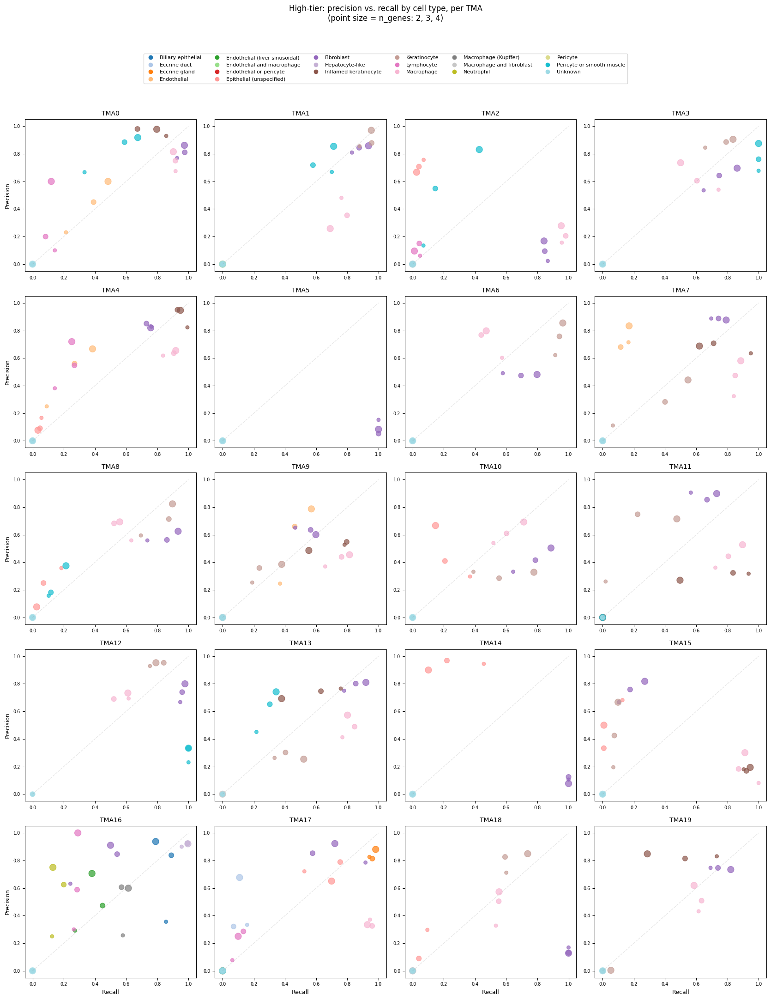

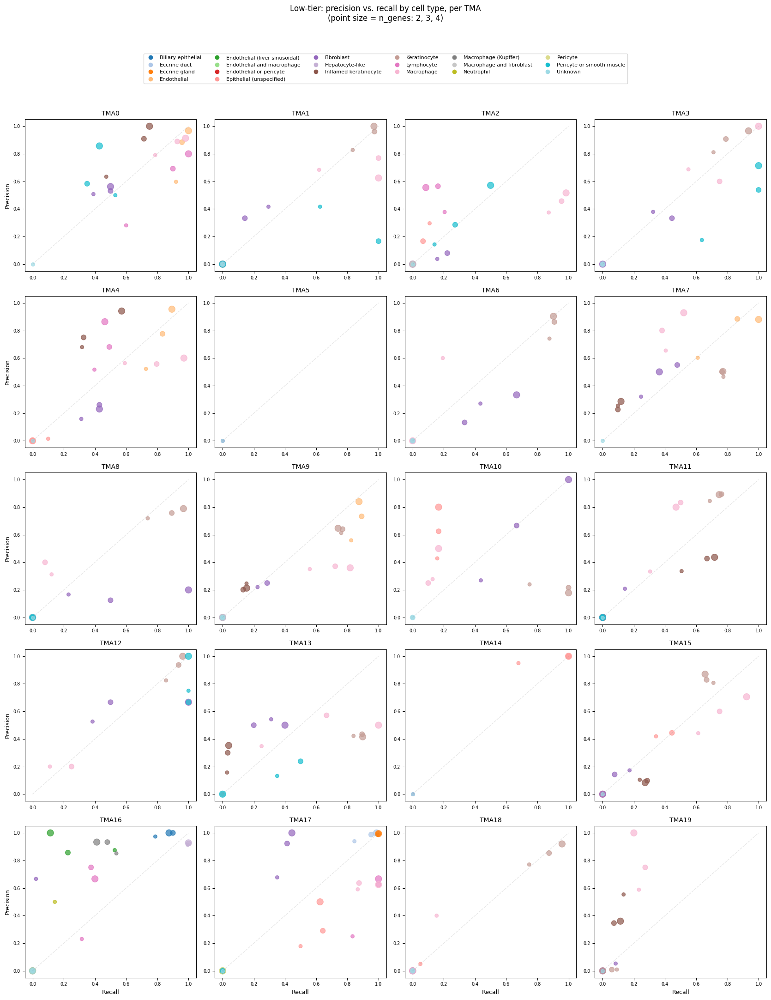

In [8]:
all_cell_types = sorted(metrics_df["cell_type"].unique())
palette = sns.color_palette("tab20", n_colors=len(all_cell_types))
color_map = dict(zip(all_cell_types, palette))

core_ids_with_metrics = sorted(metrics_df["core_id"].unique(), key=int)
n_cores = len(core_ids_with_metrics)
ncols = 4
nrows = int(np.ceil(n_cores / ncols))

for tier_name in ["high", "low"]:
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 4 * nrows), squeeze=False)
    axes_flat = axes.ravel()

    for i, core_id in enumerate(core_ids_with_metrics):
        ax = axes_flat[i]
        sub = metrics_df[(metrics_df["core_id"] == core_id) & (metrics_df["tier"] == tier_name)]
        for cell_type in sub["cell_type"].unique():
            ct_sub = sub[sub["cell_type"] == cell_type]
            sizes = ct_sub["n_genes"].map({2: 30, 3: 60, 4: 100})
            ax.scatter(
                ct_sub["recall"], ct_sub["precision"], s=sizes,
                c=[color_map[cell_type]], alpha=0.7, label=cell_type,
            )
        ax.plot([0, 1], [0, 1], "--", color="gray", alpha=0.2, linewidth=1)
        ax.set_title(f"TMA{core_id}", fontsize=10)
        ax.set_xlim(-0.05, 1.05)
        ax.set_ylim(-0.05, 1.05)
        ax.tick_params(labelsize=7)

    for ax in axes_flat[n_cores:]:
        ax.axis("off")
    for ax in axes[-1, :]:
        ax.set_xlabel("Recall", fontsize=9)
    for ax in axes[:, 0]:
        ax.set_ylabel("Precision", fontsize=9)

    handles = [plt.Line2D([0], [0], marker="o", linestyle="", color=color_map[ct], label=ct)
               for ct in all_cell_types]
    fig.legend(handles=handles, loc="upper center", bbox_to_anchor=(0.5, 1.03),
               ncol=min(len(all_cell_types), 6), fontsize=8)

    plt.suptitle(f"{tier_name.capitalize()}-tier: precision vs. recall by cell type, per TMA\n(point size = n_genes: 2, 3, 4)",
                 y=1.08, fontsize=12)
    plt.tight_layout()
    plt.savefig(RUNS_DIR / f"precision_recall_scatter_{tier_name}tier_by_celltype.png", dpi=200, bbox_inches="tight")
    plt.show()

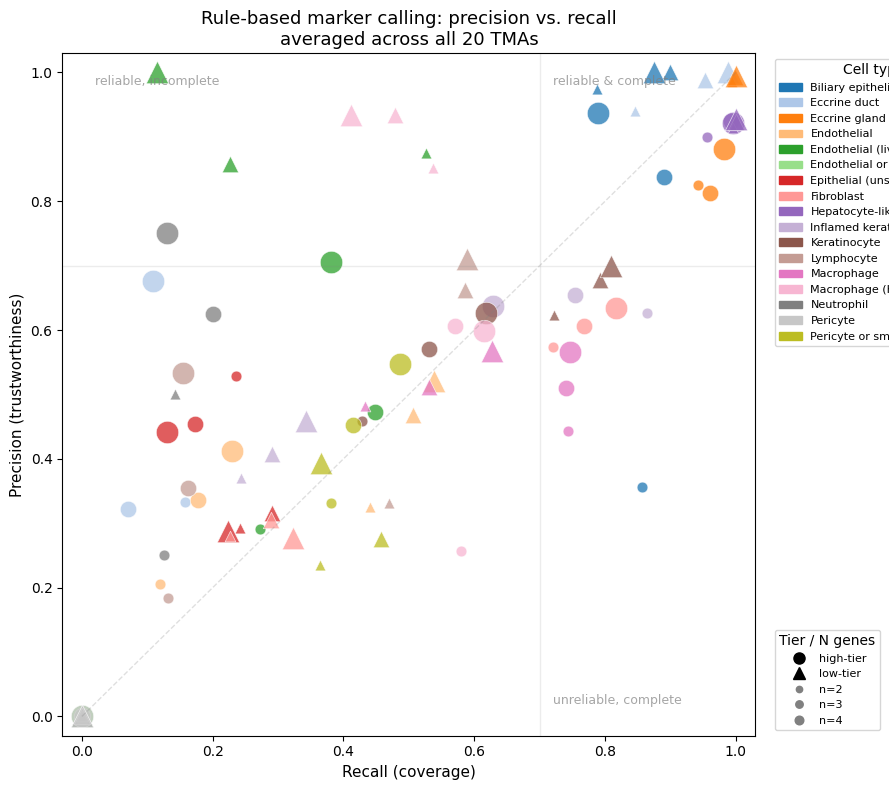

In [9]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Exclude structural zero-recall categories that can never match
# (compound/mixture labels and "Unknown" have no candidate marker set)
EXCLUDE_TYPES = {"Unknown"}
plot_df = metrics_df[
    ~metrics_df["cell_type"].isin(EXCLUDE_TYPES)
    & ~metrics_df["cell_type"].str.contains(" and ", case=False)
].copy()

# Average across all TMAs for each cell type x tier x n_genes
agg = (
    plot_df.groupby(["cell_type", "tier", "n_genes"])
    .agg(precision=("precision", "mean"), recall=("recall", "mean"), support=("support", "sum"))
    .reset_index()
)

fig, ax = plt.subplots(figsize=(9, 8))

all_cell_types = sorted(agg["cell_type"].unique())
palette = sns.color_palette("tab20", n_colors=len(all_cell_types))
color_map = dict(zip(all_cell_types, palette))
markers = {"high": "o", "low": "^"}
size_map = {2: 60, 3: 140, 4: 260}

for _, row in agg.iterrows():
    ax.scatter(
        row["recall"], row["precision"],
        s=size_map[row["n_genes"]],
        c=[color_map[row["cell_type"]]],
        marker=markers[row["tier"]],
        alpha=0.75, edgecolors="white", linewidth=0.5,
    )

ax.plot([0, 1], [0, 1], "--", color="gray", alpha=0.25, linewidth=1)
ax.axhline(0.7, color="gray", alpha=0.15, linewidth=1)
ax.axvline(0.7, color="gray", alpha=0.15, linewidth=1)
ax.text(0.72, 0.98, "reliable & complete", fontsize=9, color="gray", alpha=0.7)
ax.text(0.02, 0.98, "reliable, incomplete", fontsize=9, color="gray", alpha=0.7)
ax.text(0.72, 0.02, "unreliable, complete", fontsize=9, color="gray", alpha=0.7)

ax.set_xlim(-0.03, 1.03)
ax.set_ylim(-0.03, 1.03)
ax.set_xlabel("Recall (coverage)", fontsize=11)
ax.set_ylabel("Precision (trustworthiness)", fontsize=11)
ax.set_title("Rule-based marker calling: precision vs. recall\naveraged across all 20 TMAs", fontsize=13)

# legends: cell type color, tier shape, n_genes size
color_handles = [mpatches.Patch(color=color_map[ct], label=ct) for ct in all_cell_types]
shape_handles = [plt.Line2D([0], [0], marker=m, linestyle="", color="black", label=f"{t}-tier", markersize=8)
                  for t, m in markers.items()]
size_handles = [plt.Line2D([0], [0], marker="o", linestyle="", color="gray", label=f"n={n}",
                            markersize=(s / 25) ** 0.5 + 3) for n, s in size_map.items()]

leg1 = ax.legend(handles=color_handles, loc="upper left", bbox_to_anchor=(1.02, 1), fontsize=8, title="Cell type")
ax.add_artist(leg1)
leg2 = ax.legend(handles=shape_handles + size_handles, loc="lower left", bbox_to_anchor=(1.02, 0), fontsize=8, title="Tier / N genes")

plt.tight_layout()
plt.savefig(RUNS_DIR / "summary_precision_recall_single_plot.png", dpi=250, bbox_inches="tight")
plt.show()